# <center>Introduction to Data Analysis in </center>
    
<center><img src="https://www.python.org/static/community_logos/python-logo-inkscape.svg" alt="Python" width=300/> </center>

# <center>using </center>

<center><img src="pics/Pandas_logo.svg" alt="Pandas" width=300/></center>

# Working with Economic data in Python

This notebook will introduce you to working with data in ``Python``. You will use packages like ``Numpy`` to manipulate, work and do computations with arrays, matrices, and such, and manipulate data (see my [Introduction to Python](./IntroPython.ipynb)). But given the needs of economists (and other scientists) it will be advantageous for us to use [pandas](http://pandas.pydata.org). [pandas](http://pandas.pydata.org) is an open source, BSD-licensed library providing high-performance, easy-to-use data structures and data analysis tools for Python. [pandas](http://pandas.pydata.org) allows you to import and process data in many useful ways. It interacts greatly with [other packages](https://numfocus.org/sponsored-projects) that complement it making it a very powerful tool for data analysis. 

With [pandas](http://pandas.pydata.org) you can 
1. Import many types of data, including
    * CSV files
    * Tab or other types of delimited files 
    * Excel (xls, xlsx) files
    * Stata files

2. Open files directly from a website
3. Merge, select, join data
4. Perform statistical analyses
5. Create plots of your data

and much more. Let's start by importing ``pandas`` and use to it download some data and create some of the figures from the lecture notes. Note that when importing ``pandas`` it is accustomed to assign it the alias ``pd``. I suggest you follow this conventiuon, which will make using other peoples code and snippets easier.

In [1]:
# Let's import pandas and some other basic packages we will use 
from __future__ import division
%pylab --no-import-all
%matplotlib inline
import pandas as pd
import numpy as np

Using matplotlib backend: <object object at 0x187767fb0>
%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


# Working with Pandas

The basic structures in ``pandas`` are ``pd.Series`` and ``pd.DataFrame``. You can think of a ``pd.Series`` as a labeled vector that contains data and has a large set of functions that can be easily performed on it. A ``pd.DataFrame`` is similar a table/matrix of multidimensional data where each column contains a ``pd.Series``. I know...this may not explain much, so let's start with some actual examples. Let's create two series, one containing some country names and another containing some ficticious data.

In [2]:
countries = pd.Series(['Colombia', 'Turkey', 'USA', 'Germany', 'Chile'], name='country')
print(countries)
print('\n', 'There are ', countries.shape[0], 'countries in this series.')

0    Colombia
1      Turkey
2         USA
3     Germany
4       Chile
Name: country, dtype: object

 There are  5 countries in this series.


Notice that we have assinged a name to the series that is different than the name of the variable containing the series. Our ``print(countries)`` statement is showing the series and its contents, its name and the dype of data it contains. Here our series is only composed of strings so it assigns it the object dtype (not important for now, but we will use this later to convert data between types, e.g. strings to integers or floats or the other way around).

Let's create the data using some of the functions we already learned.

In [3]:
np.random.seed(123456)
data = pd.Series(np.random.normal(size=(countries.shape)), name='noise')
print(data)
print('\n', 'The average in this sample is ', data.mean())

0    0.469112
1   -0.282863
2   -1.509059
3   -1.135632
4    1.212112
Name: noise, dtype: float64

 The average in this sample is  -0.24926597871826645


Here we have used the ``mean()`` function of the series to compute its mean. There are many other properties/functions for these series including ``std()``, ``shape``, ``count()``, ``max()``, ``min()``, etc. You can access these by writing ``series.name_of_function_or_property``. To see what functions are available you can hit ``tab`` after writing ``series.``.

Let's create a ``pd.DataFrame`` using these two series.

In [4]:
df = pd.DataFrame([countries, data])
df

,0,1,2,3,4
country,Colombia,Turkey,USA,Germany,Chile
noise,0.469112,-0.282863,-1.509059,-1.135632,1.212112


Not exactly what we'd like, but don't worry, we can just transpose it so it has each country with its data in a row.

In [5]:
df = df.T
df

,country,noise
0,Colombia,0.469112
1,Turkey,-0.282863
2,USA,-1.509059
3,Germany,-1.135632
4,Chile,1.212112


Now let us add some more data to this dataframe. This is done easily by defining a new columns. Let's create the square of ``noise``, create the sum of ``noise`` and its square, and get the length of the country's name. 

In [6]:
df['noise_sq'] = df.noise**2
df['noise and its square'] = df.noise + df.noise_sq
df['name length'] = df.country.apply(len)
df

,country,noise,noise_sq,noise and its square,name length
0,Colombia,0.469112,0.220066,0.689179,8
1,Turkey,-0.282863,0.080012,-0.202852,6
2,USA,-1.509059,2.277258,0.768199,3
3,Germany,-1.135632,1.289661,0.154029,7
4,Chile,1.212112,1.469216,2.681328,5


This shows some of the ways in which you can create new data. Especially useful is the ``apply`` method, which applies a function to the series. You can also apply a function to the whole dataframe, which is useful if you want to perform computations using various columns.

Let's see some other ways in which we can interact with dataframes. First, let's select some observations, e.g., all countries in the South America.

In [7]:
# Let's create a list of South American countries
south_america = ['Colombia', 'Chile']
# Select the rows for South American countries
df.loc[df.country.apply(lambda x: x in south_america)]

,country,noise,noise_sq,noise and its square,name length
0,Colombia,0.469112,0.220066,0.689179,8
4,Chile,1.212112,1.469216,2.681328,5


Now let's use this to create a dummy indicating whether a country belongs to South America. To understand what is going on let's show the result of the condition for selecting rows.

In [8]:
df.country.apply(lambda x: x in south_america)

0     True
1    False
2    False
3    False
4     True
Name: country, dtype: bool

So in the previous selection of rows we told ``pandas`` which rows we wanted or not to be included by passing a ``series`` of booleans (``True``, ``False``). We can use this result to create the dummy, we only need to convert the output to ``int``.

In [9]:
df['South America'] = df.country.apply(lambda x: x in south_america).astype(int)

Now, let's plot the various series in the dataframe

<AxesSubplot:>

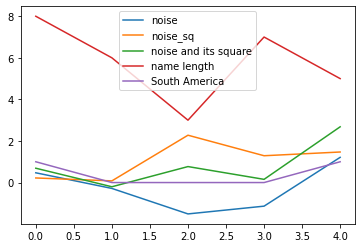

In [10]:
df.plot()

Not too nice nor useful. Notice that it assigned the row number to the x-axis labels. Let's change the row labels, which are contained in the dataframe's ``index`` by assigning the country names as the ``index``.

             noise  noise_sq noise and its square  name length  South America
country                                                                      
Colombia  0.469112  0.220066             0.689179            8              1
Turkey   -0.282863  0.080012            -0.202852            6              0
USA      -1.509059  2.277258             0.768199            3              0
Germany  -1.135632  1.289661             0.154029            7              0
Chile     1.212112  1.469216             2.681328            5              1


<AxesSubplot:xlabel='country'>

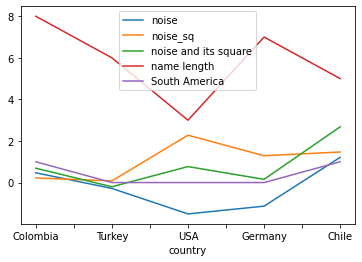

In [11]:
df = df.set_index('country')
print(df)
df.plot()

Better, but still not very informative. Below we will improve on this when we work with some real data.

Notice that by using the ``set_index`` function we have assigned the index to the country names. This may be useful to select data. E.g., if we want to see only the row for ``Colombia`` we can

In [12]:
df.loc['Colombia']

noise                   0.469112
noise_sq                0.220066
noise and its square    0.689179
name length                    8
South America                  1
Name: Colombia, dtype: object

# Getting data

One of the nice features of pandas and its ecology is that it makes obtaining data very easy. In order to exemplify this and also to revisit some of the basic facts of comparative development, let's download some data from various sources. This may require you to create accounts in order to access and download the data (sometimes the process is very simple and does not require an actual project...in other cases you need to propose a project and be approved...usually due to privacy concerns with micro-data). Don't be afraid, all these sources are free and are used a lot in research, so it is good that you learn to use them. Let's start with a list of useful sources. 

## Country-level data economic data
* [World Bank](https://data.worldbank.org/) provides all kinds of socio-economic data.
* [Penn World Tables](https://www.rug.nl/ggdc/productivity/pwt/) is a database with information on relative levels of income, output, input and productivity, covering 182 countries between 1950 and 2017.
* [Maddison Historical Data](http://www.ggdc.net/maddison/oriindex.htm) provides the most used historical statistics on population and GDP
* [The Maddison Project Database](https://www.rug.nl/ggdc/historicaldevelopment/maddison/releases/maddison-project-database-2018) provides information on comparative economic growth and income levels over the very long run,  follow-up to Maddison. 
* [Comparative Historical National Accounts ](https://www.rug.nl/ggdc/historicaldevelopment/na/) provides information on Gross Domestic Product, including an industry breakdown, for the 19th and 20th centuries. 
* [Human Mortality Database](https://www.mortality.org/) provides detailed mortality and population data for the world for the last two centuries.

## Censuses, Surveys, and other micro-level data
* [IPUMS](https://ipums.org/): provides census and survey data from around the world integrated across time and space.
* [General Social Survey](http://gss.norc.org/get-the-data/) provides survey data on what Americans think and feel about such issues as national spending priorities, crime and punishment, intergroup relations, and confidence in institutions.
* [European Social Survey](https://www.europeansocialsurvey.org/data/) provides survey measures on the attitudes, beliefs and behaviour patterns of diverse European populations in more than thirty nations. 
* [UK Data Service](https://ukdataservice.ac.uk) is the  UK’s largest collection of social, economic and population data resources.
* [SHRUG](http://www.devdatalab.org/shrug) is The Socioeconomic High-resolution Rural-Urban Geographic Platform for India. Provides access to dozens of datasets covering India’s 500,000 villages and 8000 towns using a set of a common geographic identifiers that span 25 years.

# Divergence - Big time

To study the divergence across countries let's download and plot the historical GDP and population data. In order to keep the data and not having to download it everytime from scratch, we'll create a folder ``./data`` in the currect directory and save each file there. Also, we'll make sure that if the data does not exist, we download it. We'll use the ``os`` package to create directories.

### Setting up paths

In [13]:
import os

pathout = './data/'

if not os.path.exists(pathout):
    os.mkdir(pathout)
    
pathgraphs = './graphs/'
if not os.path.exists(pathgraphs):
    os.mkdir(pathgraphs)

### Download New Maddison Project Data

In [14]:
try:
    maddison_new = pd.read_stata(pathout + 'Maddison2020.dta')
    maddison_new_region = pd.read_stata(pathout + 'Maddison2018_region.dta')
    maddison_new_1990 = pd.read_stata(pathout + 'Maddison2018_1990.dta')
except:
    maddison_new = pd.read_stata('https://www.rug.nl/ggdc/historicaldevelopment/maddison/data/mpd2020.dta')
    maddison_new.to_stata(pathout + 'Maddison2020.dta', write_index=False, version=117)
    maddison_new_region = pd.read_stata('https://www.rug.nl/ggdc/historicaldevelopment/maddison/data/mpd2018_region_data.dta')
    maddison_new_region.to_stata(pathout + 'Maddison2018_region.dta', write_index=False, version=117)
    maddison_new_1990 = pd.read_stata('https://www.rug.nl/ggdc/historicaldevelopment/maddison/data/mpd2018_1990bm.dta')
    maddison_new_1990.to_stata(pathout + 'Maddison2018_1990.dta', write_index=False, version=117)

In [15]:
maddison_new

,countrycode,country,year,gdppc,pop
0,AFG,Afghanistan,1820,NaN,3280.00000
1,AFG,Afghanistan,1870,NaN,4207.00000
2,AFG,Afghanistan,1913,NaN,5730.00000
3,AFG,Afghanistan,1950,1156.0000,8150.00000
4,AFG,Afghanistan,1951,1170.0000,8284.00000
...,...,...,...,...,...
21677,ZWE,Zimbabwe,2014,1594.0000,13313.99205
21678,ZWE,Zimbabwe,2015,1560.0000,13479.13812
21679,ZWE,Zimbabwe,2016,1534.0000,13664.79457
21680,ZWE,Zimbabwe,2017,1582.3662,13870.26413


This dataset is in long format. Also, notice that the year is not an integer. Let's correct this

In [16]:
maddison_new['year'] = maddison_new.year.astype(int)
maddison_new

,countrycode,country,year,gdppc,pop
0,AFG,Afghanistan,1820,NaN,3280.00000
1,AFG,Afghanistan,1870,NaN,4207.00000
2,AFG,Afghanistan,1913,NaN,5730.00000
3,AFG,Afghanistan,1950,1156.0000,8150.00000
4,AFG,Afghanistan,1951,1170.0000,8284.00000
...,...,...,...,...,...
21677,ZWE,Zimbabwe,2014,1594.0000,13313.99205
21678,ZWE,Zimbabwe,2015,1560.0000,13479.13812
21679,ZWE,Zimbabwe,2016,1534.0000,13664.79457
21680,ZWE,Zimbabwe,2017,1582.3662,13870.26413


### Original Maddison Data
Now, let's download, save and read the original Maddison database. Since the original file is an excel file with different data on each sheet, it will require us to use a different method to get all the data.

In [17]:
if not os.path.exists(pathout + 'Maddison_original.xlsx'):
    import urllib
    dataurl = "https://www.rug.nl/ggdc/historicaldevelopment/maddison/data/md2010_horizontal.xlsx"
    urllib.request.urlretrieve(dataurl, pathout + 'Maddison_original.xlsx')

#### Some data munging
This dataset is not very nicely structured for importing, as you can see if you open it in Excel. I suggest you do so, so that you can better see what is going on. Notice that the first two rows really have no data. Also, every second column is empty. Moreover, there are a few empty rows. Let's import the data and clean it so we can plot and analyse it better.

In [18]:
maddison_old_pop = pd.read_excel(pathout + 'Maddison_original.xlsx', sheet_name="Population", skiprows=2)
maddison_old_pop

,Unnamed: 0,1,Unnamed: 2,1000,Unnamed: 4,1500,Unnamed: 6,1600,Unnamed: 8,1700,...,2002,2003,2004,2005,2006,2007,2008,2009,Unnamed: 201,2030
0,Western Europe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Austria,500.0,NaN,700.0,NaN,2000.0,NaN,2500.0,NaN,2500.0,...,8148.312,8162.656,8174.762,8184.691,8192.880,8199.783,8205.533,8210,NaN,8120.000
2,Belgium,300.0,NaN,400.0,NaN,1400.0,NaN,1600.0,NaN,2000.0,...,10311.970,10330.824,10348.276,10364.388,10379.067,10392.226,10403.951,10414,NaN,10409.000
3,Denmark,180.0,NaN,360.0,NaN,600.0,NaN,650.0,NaN,700.0,...,5374.693,5394.138,5413.392,5432.335,5450.661,5468.120,5484.723,5501,NaN,5730.488
4,Finland,20.0,NaN,40.0,NaN,300.0,NaN,400.0,NaN,400.0,...,5193.039,5204.405,5214.512,5223.442,5231.372,5238.460,5244.749,5250,NaN,5201.445
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
273,Guadeloupe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,435.739,440.189,444.515,448.713,452.776,456.698,460.486,n.a.,NaN,523.493
274,Guyana (Fr.),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,182.333,186.917,191.309,195.506,199.509,203.321,206.941,n.a.,NaN,272.781
275,Martinique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,422.277,425.966,429.510,432.900,436.131,439.202,442.119,n.a.,NaN,486.714
276,Reunion,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,743.981,755.171,766.153,776.948,787.584,798.094,808.506,n.a.,NaN,1025.217


In [19]:
maddison_old_gdppc = pd.read_excel(pathout + 'Maddison_original.xls', sheet_name="PerCapita GDP", skiprows=2)
maddison_old_gdppc

,Unnamed: 0,1,Unnamed: 2,1000,Unnamed: 4,1500,Unnamed: 6,1600,Unnamed: 8,1700,...,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008
0,Western Europe,NaN,NaN,NaN,NaN,,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Austria,425.000000,NaN,425.000000,NaN,707,NaN,837.200000,NaN,993.200000,...,20065.093878,20691.415561,20812.893753,20955.874051,21165.047259,21626.929322,22140.725899,22892.682427,23674.041130,24130.547035
2,Belgium,450.000000,NaN,425.000000,NaN,875,NaN,975.625000,NaN,1144.000000,...,19964.428266,20656.458570,20761.238278,21032.935511,21205.859281,21801.602508,22246.561977,22881.632810,23446.949672,23654.763464
3,Denmark,400.000000,NaN,400.000000,NaN,738.333333,NaN,875.384615,NaN,1038.571429,...,22254.890572,22975.162513,23059.374968,23082.620719,23088.582457,23492.664119,23972.564284,24680.492880,24995.245167,24620.568805
4,Finland,400.000000,NaN,400.000000,NaN,453.333333,NaN,537.500000,NaN,637.500000,...,18855.985066,19770.363126,20245.896529,20521.702225,20845.802738,21574.406196,22140.573208,23190.283543,24131.519569,24343.586318
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,Total Africa,472.352941,NaN,424.767802,NaN,413.709504,NaN,422.071584,NaN,420.628684,...,1430.752576,1447.071701,1471.156532,1482.629352,1517.935644,1558.099461,1603.686517,1663.531318,1724.226776,1780.265474
191,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Let's start by renaming the first column, which has the region/country names

In [20]:
maddison_old_pop.rename(columns={'Unnamed: 0':'Country'}, inplace=True)
maddison_old_gdppc.rename(columns={'Unnamed: 0':'Country'}, inplace=True)

Now let's drop all the columns that do not have data

In [21]:
maddison_old_pop = maddison_old_pop[[col for col in maddison_old_pop.columns if str(col).startswith('Unnamed')==False]]
maddison_old_gdppc = maddison_old_gdppc[[col for col in maddison_old_gdppc.columns if str(col).startswith('Unnamed')==False]]

Now, let's change the name of the columns so they reflect the underlying variable

In [22]:
maddison_old_pop.columns = ['Country'] + ['pop_'+str(col) for col in maddison_old_pop.columns[1:]]
maddison_old_gdppc.columns = ['Country'] + ['gdppc_'+str(col) for col in maddison_old_gdppc.columns[1:]]

In [23]:
maddison_old_pop

,Country,pop_1,pop_1000,pop_1500,pop_1600,pop_1700,pop_1820,pop_1821,pop_1822,pop_1823,...,pop_2001,pop_2002,pop_2003,pop_2004,pop_2005,pop_2006,pop_2007,pop_2008,pop_2009,pop_2030
0,Western Europe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Austria,500.0,700.0,2000.0,2500.0,2500.0,3369.0,3386.0,3402.0,3419.0,...,8131.690,8148.312,8162.656,8174.762,8184.691,8192.880,8199.783,8205.533,8210,8120.000
2,Belgium,300.0,400.0,1400.0,1600.0,2000.0,3434.0,3464.0,3495.0,3526.0,...,10291.679,10311.970,10330.824,10348.276,10364.388,10379.067,10392.226,10403.951,10414,10409.000
3,Denmark,180.0,360.0,600.0,650.0,700.0,1155.0,1167.0,1179.0,1196.0,...,5355.826,5374.693,5394.138,5413.392,5432.335,5450.661,5468.120,5484.723,5501,5730.488
4,Finland,20.0,40.0,300.0,400.0,400.0,1169.0,1186.0,1202.0,1219.0,...,5180.309,5193.039,5204.405,5214.512,5223.442,5231.372,5238.460,5244.749,5250,5201.445
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
273,Guadeloupe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,431.170,435.739,440.189,444.515,448.713,452.776,456.698,460.486,n.a.,523.493
274,Guyana (Fr.),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,177.562,182.333,186.917,191.309,195.506,199.509,203.321,206.941,n.a.,272.781
275,Martinique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,418.454,422.277,425.966,429.510,432.900,436.131,439.202,442.119,n.a.,486.714
276,Reunion,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,732.570,743.981,755.171,766.153,776.948,787.584,798.094,808.506,n.a.,1025.217


In [24]:
maddison_old_gdppc

,Country,gdppc_1,gdppc_1000,gdppc_1500,gdppc_1600,gdppc_1700,gdppc_1820,gdppc_1821,gdppc_1822,gdppc_1823,...,gdppc_1999,gdppc_2000,gdppc_2001,gdppc_2002,gdppc_2003,gdppc_2004,gdppc_2005,gdppc_2006,gdppc_2007,gdppc_2008
0,Western Europe,NaN,NaN,,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Austria,425.000000,425.000000,707,837.200000,993.200000,1218.165628,NaN,NaN,NaN,...,20065.093878,20691.415561,20812.893753,20955.874051,21165.047259,21626.929322,22140.725899,22892.682427,23674.041130,24130.547035
2,Belgium,450.000000,425.000000,875,975.625000,1144.000000,1318.870122,NaN,NaN,NaN,...,19964.428266,20656.458570,20761.238278,21032.935511,21205.859281,21801.602508,22246.561977,22881.632810,23446.949672,23654.763464
3,Denmark,400.000000,400.000000,738.333333,875.384615,1038.571429,1273.593074,1320.479863,1326.547922,1307.692308,...,22254.890572,22975.162513,23059.374968,23082.620719,23088.582457,23492.664119,23972.564284,24680.492880,24995.245167,24620.568805
4,Finland,400.000000,400.000000,453.333333,537.500000,637.500000,781.009410,NaN,NaN,NaN,...,18855.985066,19770.363126,20245.896529,20521.702225,20845.802738,21574.406196,22140.573208,23190.283543,24131.519569,24343.586318
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,Total Africa,472.352941,424.767802,413.709504,422.071584,420.628684,419.755914,NaN,NaN,NaN,...,1430.752576,1447.071701,1471.156532,1482.629352,1517.935644,1558.099461,1603.686517,1663.531318,1724.226776,1780.265474
191,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Let's choose the rows that hold the aggregates by region for the main regions of the world.

In [25]:
gdppc = maddison_old_gdppc.loc[maddison_old_gdppc.Country.apply(lambda x: str(x).upper().find('TOTAL')!=-1)].reset_index(drop=True)
gdppc = gdppc.dropna(subset=['gdppc_1'])
gdppc = gdppc.loc[2:]
gdppc['Country'] = gdppc.Country.str.replace('Total', '').str.replace('Countries', '').str.replace('\d+', '').str.replace('European', 'Europe').str.strip()
gdppc = gdppc.loc[gdppc.Country.apply(lambda x: x.find('USSR')==-1 and  x.find('West Asian')==-1)].reset_index(drop=True)
gdppc

/var/folders/q1/7qsx8kmj439d81kr4f_k_wbr0000gp/T/ipykernel_10270/1141553257.py:4: FutureWarning: The default value of regex will change from True to False in a future version.
  gdppc['Country'] = gdppc.Country.str.replace('Total', '').str.replace('Countries', '').str.replace('\d+', '').str.replace('European', 'Europe').str.strip()


,Country,gdppc_1,gdppc_1000,gdppc_1500,gdppc_1600,gdppc_1700,gdppc_1820,gdppc_1821,gdppc_1822,gdppc_1823,...,gdppc_1999,gdppc_2000,gdppc_2001,gdppc_2002,gdppc_2003,gdppc_2004,gdppc_2005,gdppc_2006,gdppc_2007,gdppc_2008
0,Western Europe,576.167665,427.425665,771.093805,887.906964,993.456911,1194.184683,NaN,NaN,NaN,...,18497.208533,19176.001655,19463.863297,19627.707522,19801.145425,20199.220700,20522.238008,21087.304789,21589.011346,21671.774225
1,Western Offshoots,400.000000,400.000000,400,400.000000,476.000000,1201.993477,NaN,NaN,NaN,...,26680.580823,27393.808035,27387.312035,27648.644070,28090.274362,28807.845958,29415.399334,29922.741918,30344.425293,30151.805880
2,East Europe,411.789474,400.000000,496,548.023599,606.010638,683.160984,NaN,NaN,NaN,...,5734.162109,5970.165085,6143.112873,6321.395376,6573.365882,6942.136596,7261.721015,7730.097570,8192.881904,8568.967581
3,Latin America,400.000000,400.000000,416.457143,437.558140,526.639004,691.060678,NaN,NaN,NaN,...,5765.585093,5889.237351,5846.295193,5746.609672,5785.841237,6063.068969,6265.525702,6530.533583,6783.869986,6973.134656
4,Asia,455.671021,469.961665,568.4179,573.550859,571.605276,580.626115,NaN,NaN,NaN,...,3623.902724,3797.608955,3927.186275,4121.275511,4388.982705,4661.517477,4900.563281,5187.253152,5408.383588,5611.198564
5,Africa,472.352941,424.767802,413.709504,422.071584,420.628684,419.755914,NaN,NaN,NaN,...,1430.752576,1447.071701,1471.156532,1482.629352,1517.935644,1558.099461,1603.686517,1663.531318,1724.226776,1780.265474


Let's drop missing values

In [26]:
gdppc = gdppc.dropna(axis=1, how='any')
gdppc

,Country,gdppc_1,gdppc_1000,gdppc_1500,gdppc_1600,gdppc_1700,gdppc_1820,gdppc_1870,gdppc_1900,gdppc_1913,...,gdppc_1999,gdppc_2000,gdppc_2001,gdppc_2002,gdppc_2003,gdppc_2004,gdppc_2005,gdppc_2006,gdppc_2007,gdppc_2008
0,Western Europe,576.167665,427.425665,771.093805,887.906964,993.456911,1194.184683,1953.068150,2884.661525,3456.576178,...,18497.208533,19176.001655,19463.863297,19627.707522,19801.145425,20199.220700,20522.238008,21087.304789,21589.011346,21671.774225
1,Western Offshoots,400.000000,400.000000,400,400.000000,476.000000,1201.993477,2419.152411,4014.870040,5232.816582,...,26680.580823,27393.808035,27387.312035,27648.644070,28090.274362,28807.845958,29415.399334,29922.741918,30344.425293,30151.805880
2,East Europe,411.789474,400.000000,496,548.023599,606.010638,683.160984,936.628265,1437.944586,1694.879668,...,5734.162109,5970.165085,6143.112873,6321.395376,6573.365882,6942.136596,7261.721015,7730.097570,8192.881904,8568.967581
3,Latin America,400.000000,400.000000,416.457143,437.558140,526.639004,691.060678,676.005331,1113.071149,1494.431922,...,5765.585093,5889.237351,5846.295193,5746.609672,5785.841237,6063.068969,6265.525702,6530.533583,6783.869986,6973.134656
4,Asia,455.671021,469.961665,568.4179,573.550859,571.605276,580.626115,553.459947,637.615593,695.131881,...,3623.902724,3797.608955,3927.186275,4121.275511,4388.982705,4661.517477,4900.563281,5187.253152,5408.383588,5611.198564
5,Africa,472.352941,424.767802,413.709504,422.071584,420.628684,419.755914,500.011054,601.236364,637.433138,...,1430.752576,1447.071701,1471.156532,1482.629352,1517.935644,1558.099461,1603.686517,1663.531318,1724.226776,1780.265474


Let's convert from wide to long format

In [27]:
gdppc = pd.wide_to_long(gdppc, ['gdppc_'], i='Country', j='year').reset_index()
gdppc

,Country,year,gdppc_
0,Western Europe,1,576.167665
1,Western Offshoots,1,400.0
2,East Europe,1,411.789474
3,Latin America,1,400.0
4,Asia,1,455.671021
...,...,...,...
409,Western Offshoots,2008,30151.80588
410,East Europe,2008,8568.967581
411,Latin America,2008,6973.134656
412,Asia,2008,5611.198564


# Plotting

We can now plot the data. Let's try two different ways. The first uses the ``plot`` function from ``pandas``. The second uses the package ``seaborn``, which improves on the capabilities of ``matplotlib``. The main difference is how the data needs to be organized. Of course, these are not the only ways to plot and we can try others.

In [28]:
import matplotlib as mpl
import seaborn as sns
# Setup seaborn
sns.set()

Let's pivot the table so that each region is a column and each row is a year. This will allow us to plot using the ``plot`` function of the ``pandas DataFrame``.

In [29]:
gdppc2 = gdppc.pivot_table(index='year',columns='Country',values='gdppc_',aggfunc='sum')
gdppc2

Country,Africa,Asia,East Europe,Latin America,Western Europe,Western Offshoots
year,,,,,,
1,472.352941,455.671021,411.789474,400.000000,576.167665,400.000000
1000,424.767802,469.961665,400.000000,400.000000,427.425665,400.000000
1500,413.709504,568.417900,496.000000,416.457143,771.093805,400.000000
1600,422.071584,573.550859,548.023599,437.558140,887.906964,400.000000
1700,420.628684,571.605276,606.010638,526.639004,993.456911,476.000000
...,...,...,...,...,...,...
2004,1558.099461,4661.517477,6942.136596,6063.068969,20199.220700,28807.845958
2005,1603.686517,4900.563281,7261.721015,6265.525702,20522.238008,29415.399334
2006,1663.531318,5187.253152,7730.097570,6530.533583,21087.304789,29922.741918


Ok. Let's plot using the ``pandas`` ``plot`` function. 

Text(0, 0.5, "GDP per capita (1990 Int'l US$)")

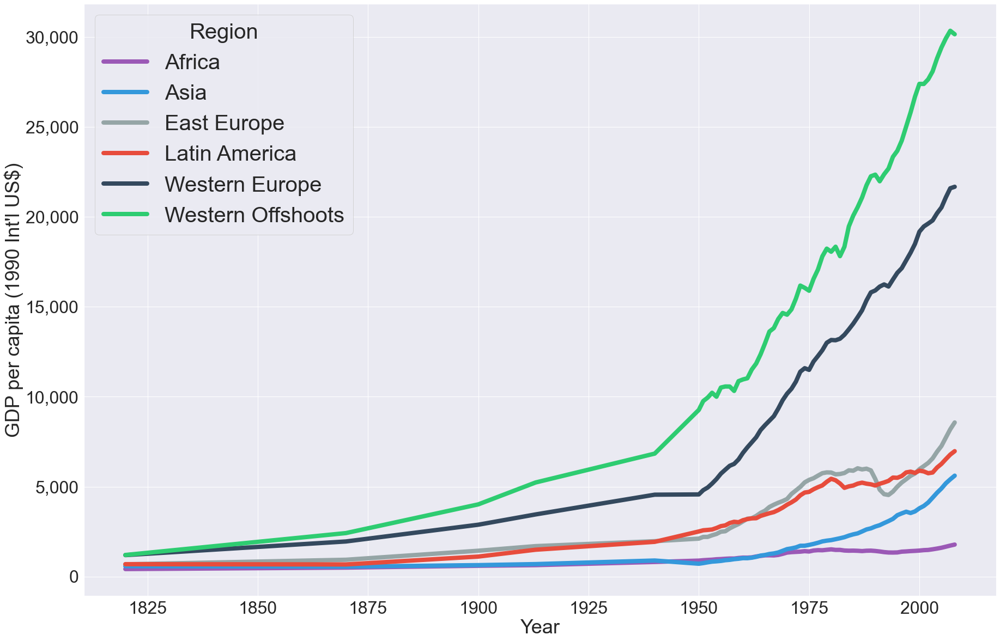

In [30]:
# Select some colors
mycolors = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
# Use seaborn to setup a color map to be used by matplotlib
my_cmap = mpl.colors.ListedColormap(sns.color_palette(mycolors).as_hex())

# Set the size of the figure and get a figure and axis object
fig, ax = plt.subplots(figsize=(30,20))
# Plot using the axis ax and colormap my_cmap
gdppc2.loc[1800:].plot(ax=ax, linewidth=8, cmap=my_cmap)
# Change options of axes, legend
ax.tick_params(axis = 'both', which = 'major', labelsize=32)
ax.tick_params(axis = 'both', which = 'minor', labelsize=16)
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.legend(prop={'size': 40}).set_title("Region", prop = {'size':40})
# Label axes
ax.set_xlabel('Year', fontsize=36)
ax.set_ylabel('GDP per capita (1990 Int\'l US$)', fontsize=36)


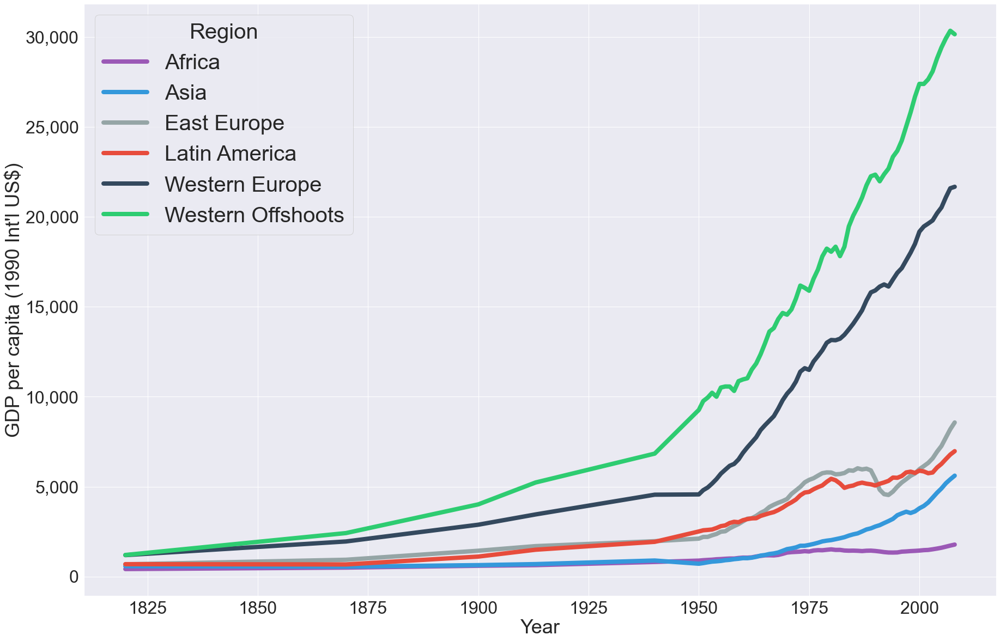

In [31]:
fig

Now, let's use ``seaborn``

Text(0, 0.5, "GDP per capita (1990 Int'l US$)")

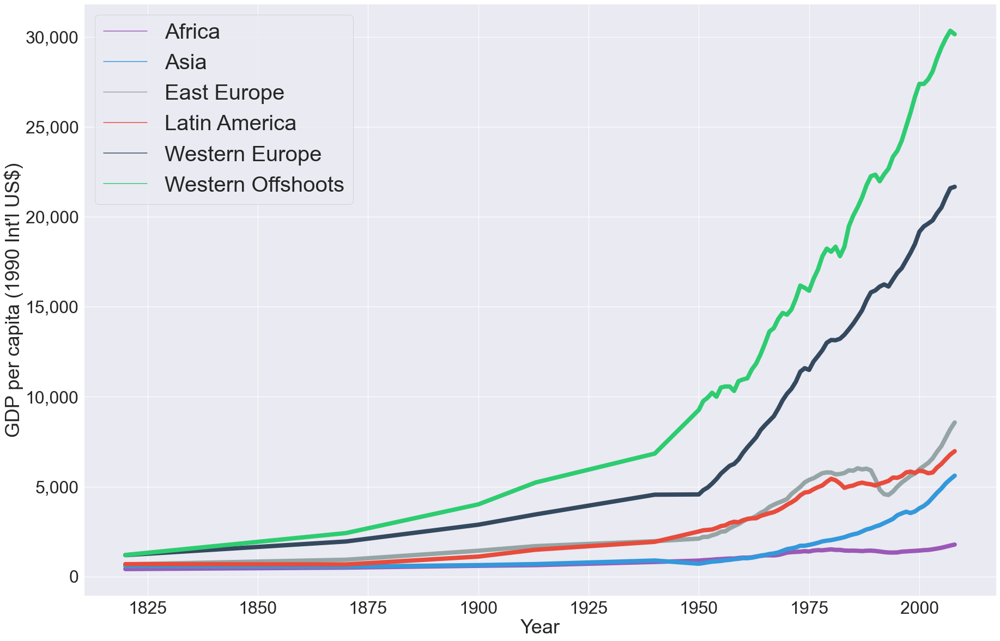

In [32]:
gdppc['Region'] = gdppc.Country.astype('category')
gdppc['gdppc_'] = gdppc.gdppc_.astype(float)
# Plot
fig, ax = plt.subplots(figsize=(30,20))
sns.lineplot(x='year', y='gdppc_', hue='Region', data=gdppc.loc[gdppc.year>=1800].reset_index(drop=True), alpha=1, lw=8, palette=sns.color_palette(mycolors), style='Region', dashes=False, markers=False)
ax.tick_params(axis = 'both', which = 'major', labelsize=32)
ax.tick_params(axis = 'both', which = 'minor', labelsize=16)
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.legend(title='', prop={'size': 40})
ax.set_xlabel('Year', fontsize=36)
ax.set_ylabel('GDP per capita (1990 Int\'l US$)', fontsize=36)


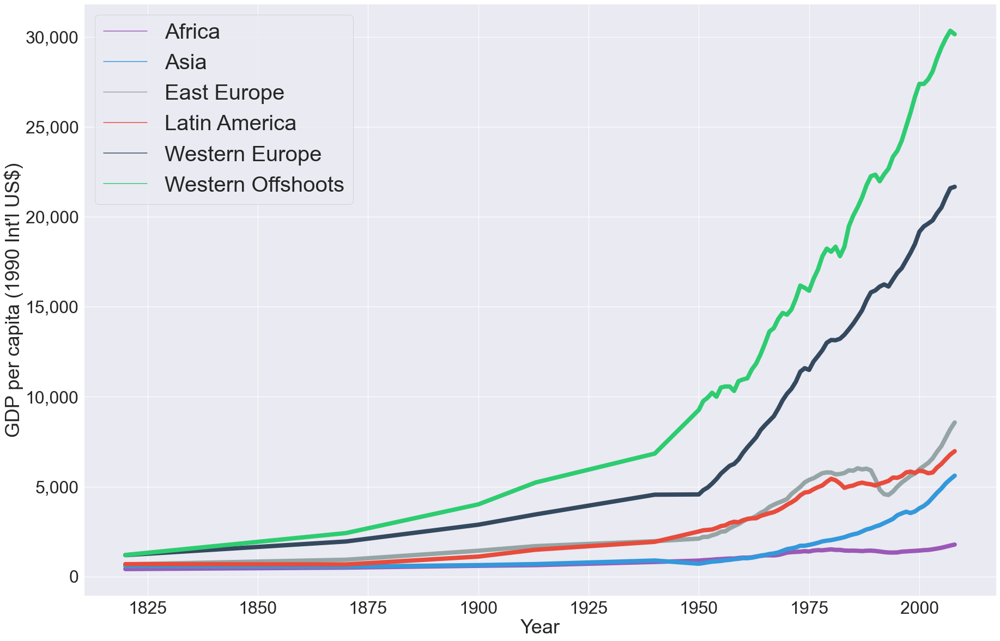

In [33]:
fig

Nice! Basically the same plot. But we can do better! Let's use ``seaborn`` again, but this time use different markers for each region, and let's use only a subset of the data so that it looks better. Also, let's export the figure so we can use it in our slides.

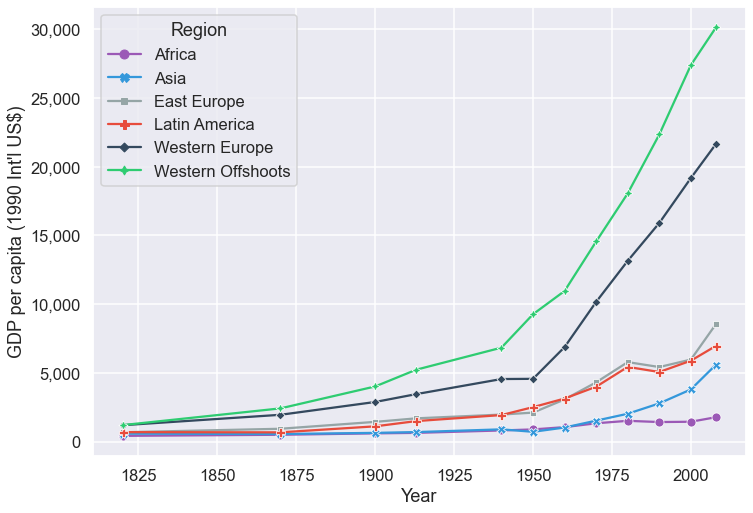

In [34]:
# Create category for hue
gdppc['Region'] = gdppc.Country.astype('category')
gdppc['gdppc_'] = gdppc.gdppc_.astype(float)

sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='gdppc_', hue='Region', data=gdppc.loc[(gdppc.year>=1800) & (gdppc.year.apply(lambda x: x not in [
       1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1961,
       1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1971, 1972,
       1973, 1974, 1975, 1976, 1977, 1978, 1979, 1981, 1982, 1983,
       1984, 1985, 1986, 1987, 1988, 1989, 1991, 1992, 1993, 1994,
       1995, 1996, 1997, 1998, 1999, 2001, 2002, 2003, 2004, 2005,
       2006, 2007]))].reset_index(drop=True), alpha=1, palette=sns.color_palette(mycolors), style='Region', dashes=False, markers=True,)
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
#ax.legend(title='', prop={'size': 40})
ax.set_xlabel('Year')
ax.set_ylabel('GDP per capita (1990 Int\'l US$)')
plt.savefig(pathgraphs + 'y1820-2010.pdf', dpi=300, bbox_inches='tight')

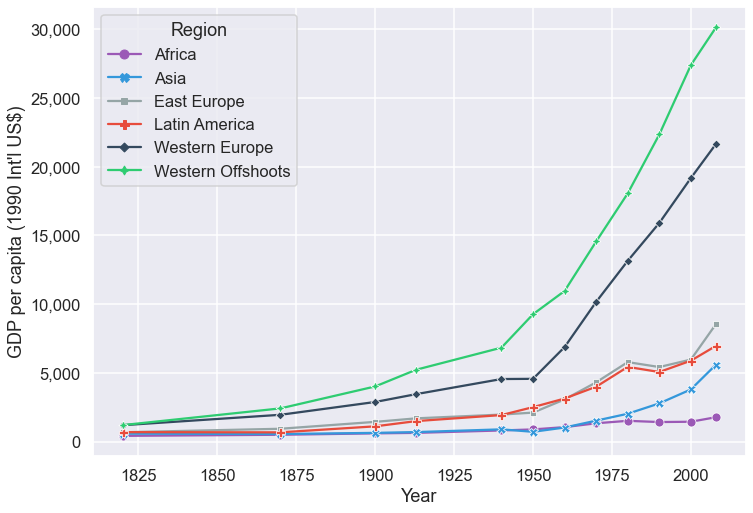

In [35]:
fig

Let's create the same plot using the updated data from the Maddison Project. Here we have less years, but the picture is similar.

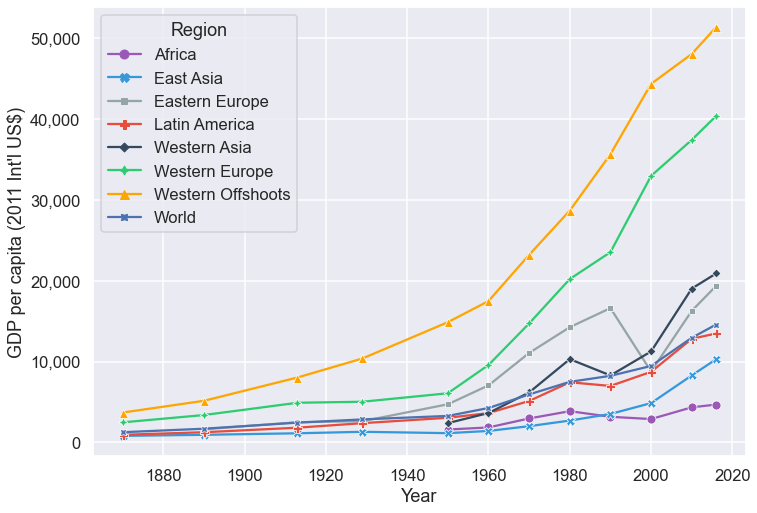

In [36]:
maddison_new_region['Region'] = maddison_new_region.region_name

mycolors2 = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71", "orange", "b"]
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='cgdppc', hue='Region', data=maddison_new_region.loc[(maddison_new_region.year.apply(lambda x: x in [1870, 1890, 1913, 1929,1950, 2016])) | ((maddison_new_region.year>1950) & (maddison_new_region.year.apply(lambda x: np.mod(x,10)==0)))], alpha=1, palette=sns.color_palette(mycolors2), style='Region', dashes=False, markers=True,)
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
#ax.legend(title='', prop={'size': 40})
ax.set_xlabel('Year')
ax.set_ylabel('GDP per capita (2011 Int\'l US$)')
plt.savefig(pathgraphs + 'y1870-2016.pdf', dpi=300, bbox_inches='tight')

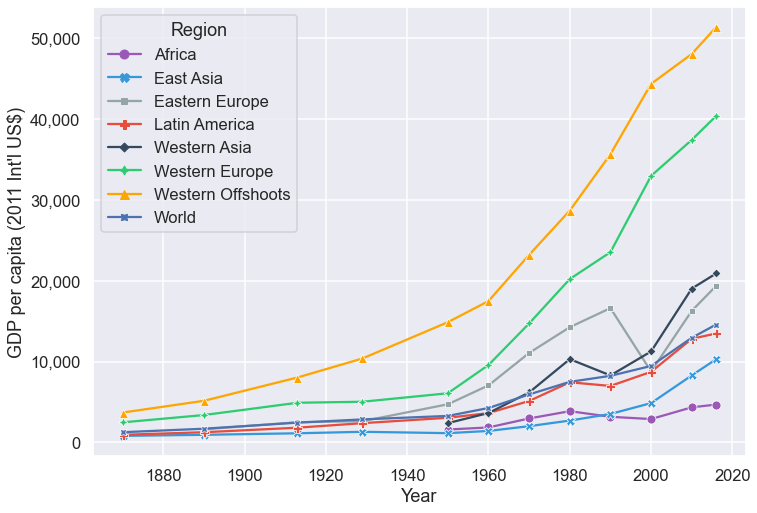

In [37]:
fig

Let's show the evolution starting from other periods.

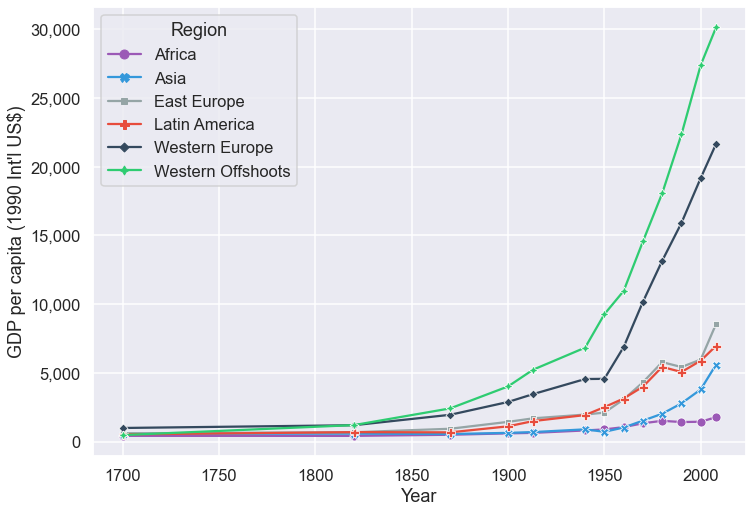

In [38]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='gdppc_', hue='Region', data=gdppc.loc[(gdppc.year>=1700) & (gdppc.year.apply(lambda x: x not in [
       1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1961,
       1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1971, 1972,
       1973, 1974, 1975, 1976, 1977, 1978, 1979, 1981, 1982, 1983,
       1984, 1985, 1986, 1987, 1988, 1989, 1991, 1992, 1993, 1994,
       1995, 1996, 1997, 1998, 1999, 2001, 2002, 2003, 2004, 2005,
       2006, 2007]))].reset_index(drop=True), alpha=1, palette=sns.color_palette(mycolors), style='Region', dashes=False, markers=True,)
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
#ax.legend(title='', prop={'size': 40})
ax.set_xlabel('Year')
ax.set_ylabel('GDP per capita (1990 Int\'l US$)')
plt.savefig(pathgraphs + 'take-off-1700-2010.pdf', dpi=300, bbox_inches='tight')

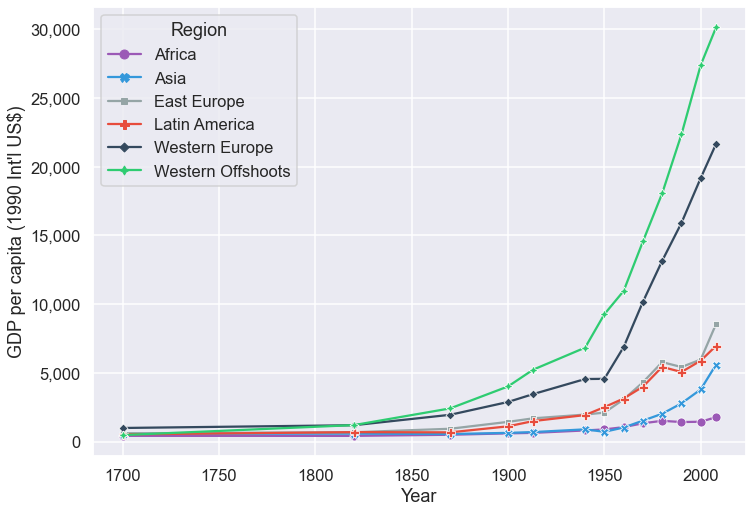

In [39]:
fig

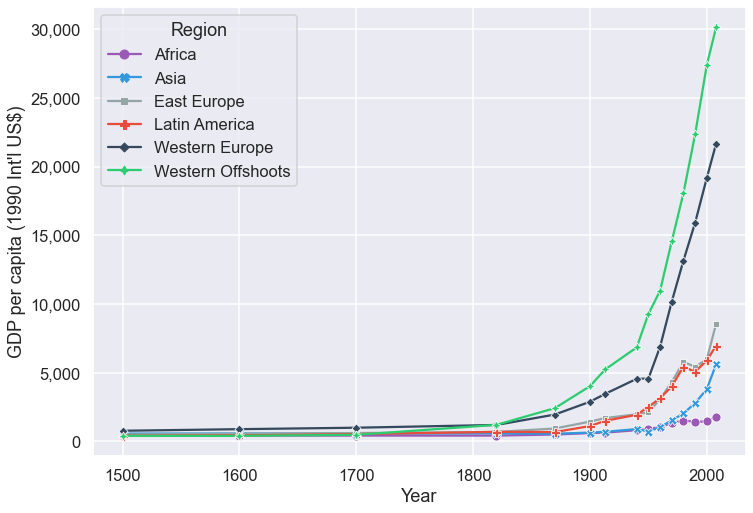

In [40]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='gdppc_', hue='Region', data=gdppc.loc[(gdppc.year>=1500) & (gdppc.year.apply(lambda x: x not in [
       1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1961,
       1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1971, 1972,
       1973, 1974, 1975, 1976, 1977, 1978, 1979, 1981, 1982, 1983,
       1984, 1985, 1986, 1987, 1988, 1989, 1991, 1992, 1993, 1994,
       1995, 1996, 1997, 1998, 1999, 2001, 2002, 2003, 2004, 2005,
       2006, 2007]))].reset_index(drop=True), alpha=1, palette=sns.color_palette(mycolors), style='Region', dashes=False, markers=True,)
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
#ax.legend(title='', prop={'size': 40})
ax.set_xlabel('Year')
ax.set_ylabel('GDP per capita (1990 Int\'l US$)')
plt.savefig(pathgraphs + 'y1500-2010.pdf', dpi=300, bbox_inches='tight')

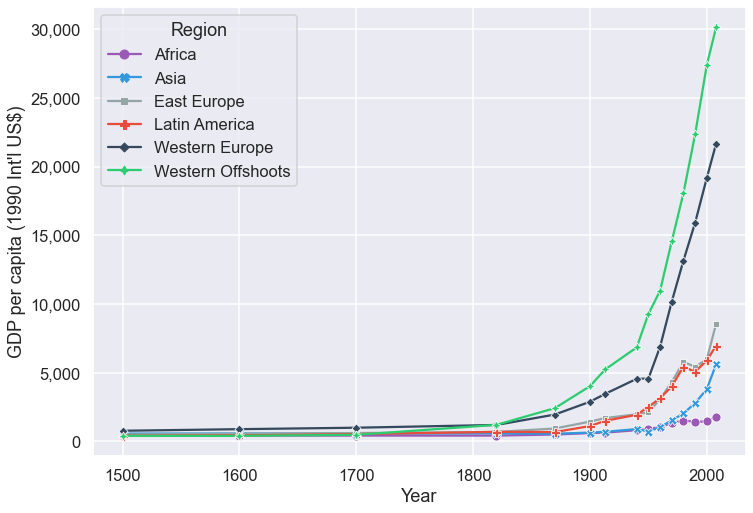

In [41]:
fig

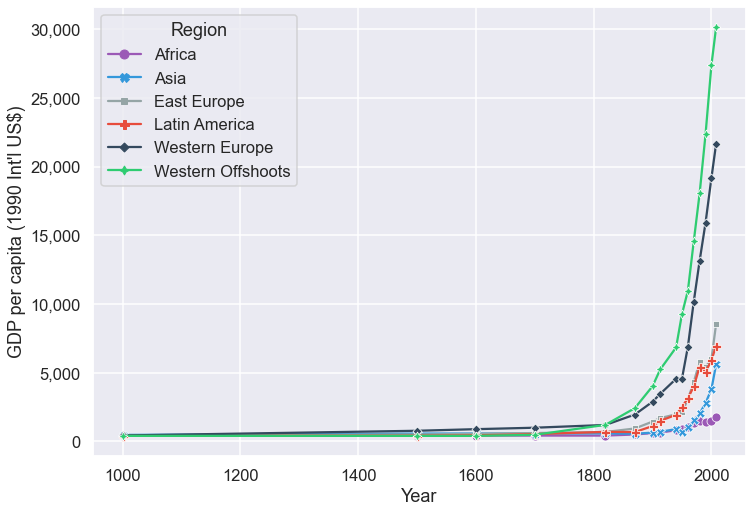

In [42]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='gdppc_', hue='Region', data=gdppc.loc[(gdppc.year>=1000) & (gdppc.year.apply(lambda x: x not in [
       1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1961,
       1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1971, 1972,
       1973, 1974, 1975, 1976, 1977, 1978, 1979, 1981, 1982, 1983,
       1984, 1985, 1986, 1987, 1988, 1989, 1991, 1992, 1993, 1994,
       1995, 1996, 1997, 1998, 1999, 2001, 2002, 2003, 2004, 2005,
       2006, 2007]))].reset_index(drop=True), alpha=1, palette=sns.color_palette(mycolors), style='Region', dashes=False, markers=True,)
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
#ax.legend(title='', prop={'size': 40})
ax.set_xlabel('Year')
ax.set_ylabel('GDP per capita (1990 Int\'l US$)')
plt.savefig(pathgraphs + 'y1000-2010.pdf', dpi=300, bbox_inches='tight')

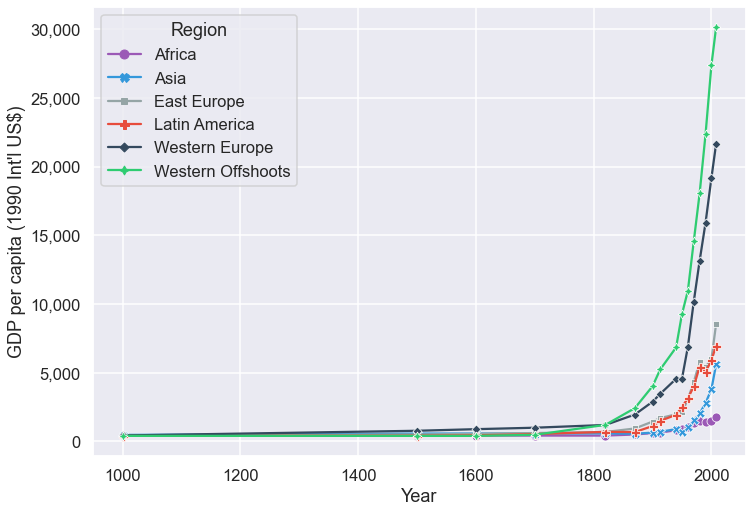

In [43]:
fig

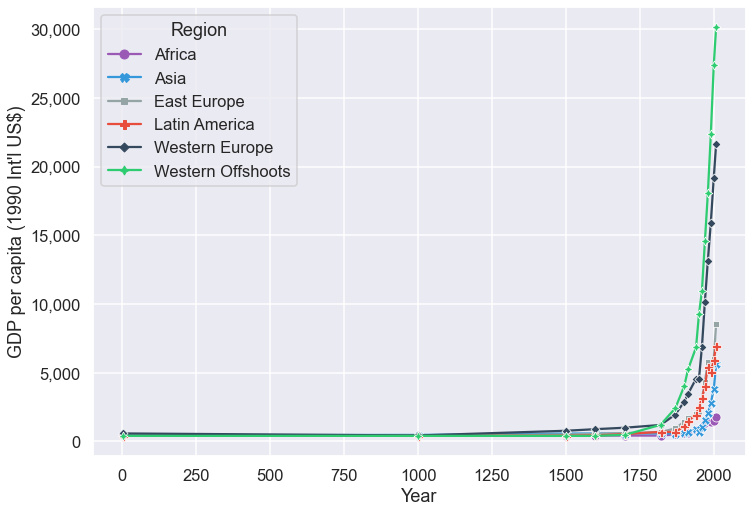

In [44]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='gdppc_', hue='Region', data=gdppc.loc[(gdppc.year>=0) & (gdppc.year.apply(lambda x: x not in [
       1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1961,
       1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1971, 1972,
       1973, 1974, 1975, 1976, 1977, 1978, 1979, 1981, 1982, 1983,
       1984, 1985, 1986, 1987, 1988, 1989, 1991, 1992, 1993, 1994,
       1995, 1996, 1997, 1998, 1999, 2001, 2002, 2003, 2004, 2005,
       2006, 2007]))].reset_index(drop=True), alpha=1, palette=sns.color_palette(mycolors), style='Region', dashes=False, markers=True,)
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
#ax.legend(title='', prop={'size': 40})
ax.set_xlabel('Year')
ax.set_ylabel('GDP per capita (1990 Int\'l US$)')
plt.savefig(pathgraphs + 'y1-2010.pdf', dpi=300, bbox_inches='tight')

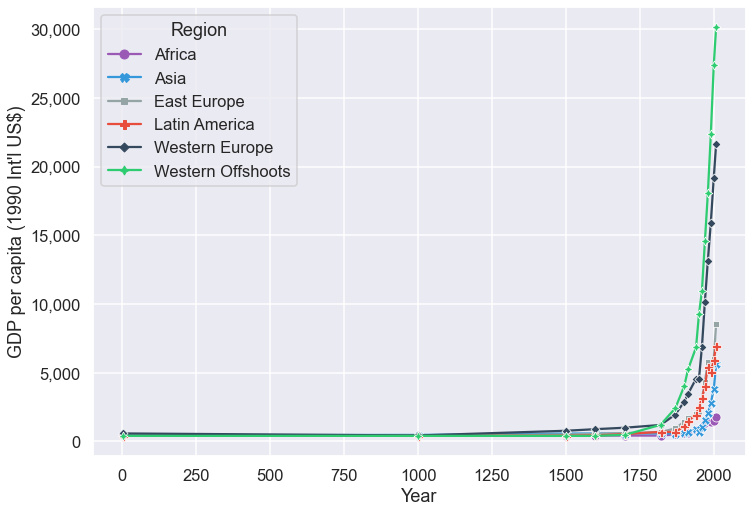

In [45]:
fig

Let's plot the evolution of GDP per capita for the whole world

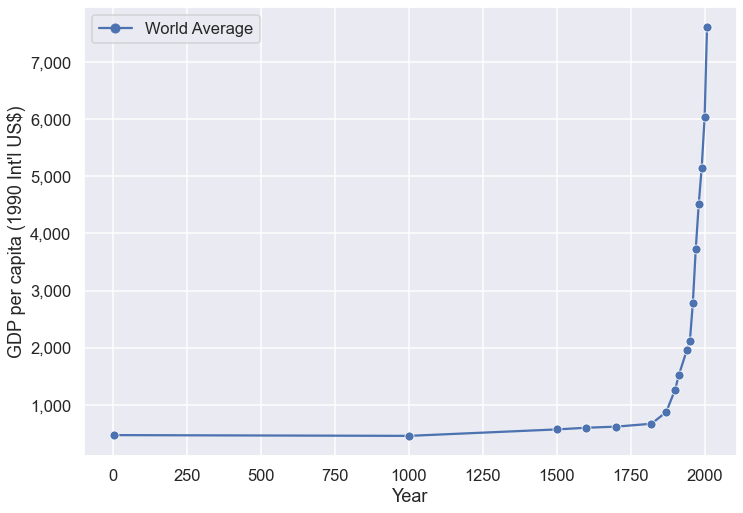

In [46]:
world_gdppc = maddison_old_gdppc.loc[maddison_old_gdppc.Country=='World Average']
world_gdppc = pd.wide_to_long(world_gdppc, ['gdppc_'], i='Country', j='year').reset_index()
world_gdppc
world_gdppc['Region'] = world_gdppc.Country.astype('category')
world_gdppc['gdppc_'] = world_gdppc.gdppc_.astype(float)

sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='gdppc_', hue='Region', data=world_gdppc.loc[(world_gdppc.year>=0) & (world_gdppc.year.apply(lambda x: x not in [
       1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1961,
       1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1971, 1972,
       1973, 1974, 1975, 1976, 1977, 1978, 1979, 1981, 1982, 1983,
       1984, 1985, 1986, 1987, 1988, 1989, 1991, 1992, 1993, 1994,
       1995, 1996, 1997, 1998, 1999, 2001, 2002, 2003, 2004, 2005,
       2006, 2007]))].reset_index(drop=True), alpha=1, style='Region', dashes=False, markers=True,)
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[1:], labels=labels[1:])
ax.set_xlabel('Year')
ax.set_ylabel('GDP per capita (1990 Int\'l US$)')
plt.savefig(pathgraphs + 'W-y1-2010.pdf', dpi=300, bbox_inches='tight')

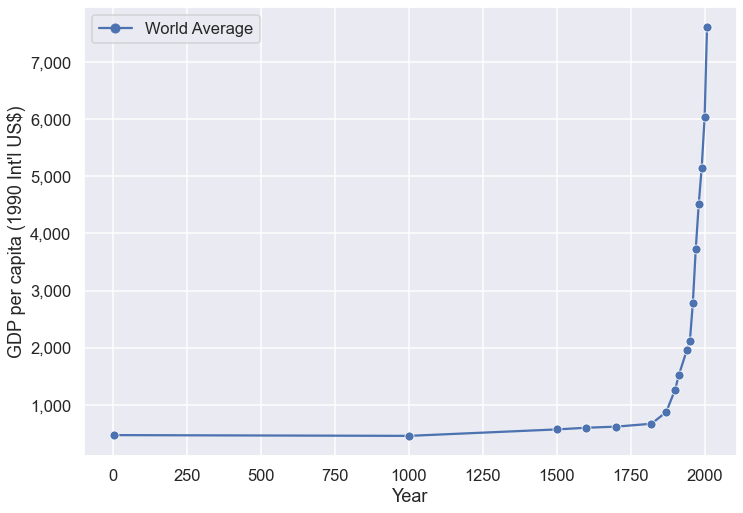

In [47]:
fig

Let's plot $log(GDPpc)$ during the modern era when we have sustained economic growth

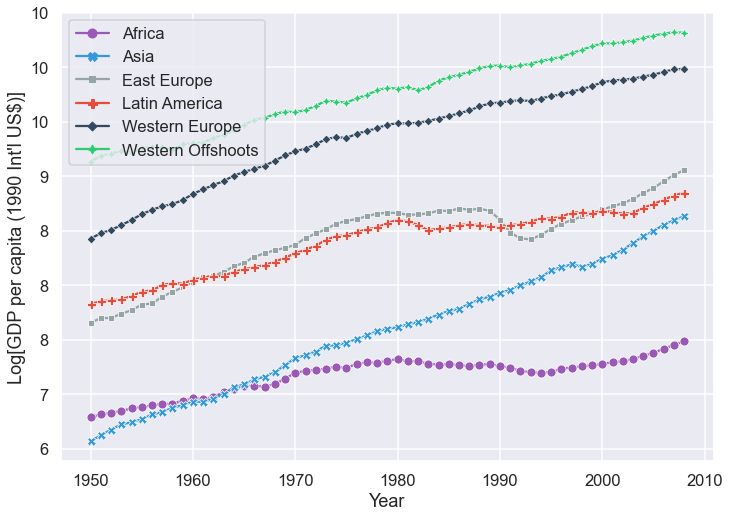

In [48]:
gdppc['lgdppc'] = np.log(gdppc.gdppc_)

# Select some colors
mycolors = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
# Use seaborn to setup a color map to be used by matplotlib
my_cmap = mpl.colors.ListedColormap(sns.color_palette(mycolors).as_hex())

sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='lgdppc', hue='Region', data=gdppc.loc[(gdppc.year>=1950)].reset_index(drop=True), alpha=1, palette=sns.color_palette(mycolors), style='Region', dashes=False, markers=True,)
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.legend(loc='upper left')
ax.set_xlabel('Year')
ax.set_ylabel('Log[GDP per capita (1990 Int\'l US$)]')
plt.savefig(pathgraphs + 'sg1950-2000.pdf', dpi=300, bbox_inches='tight')

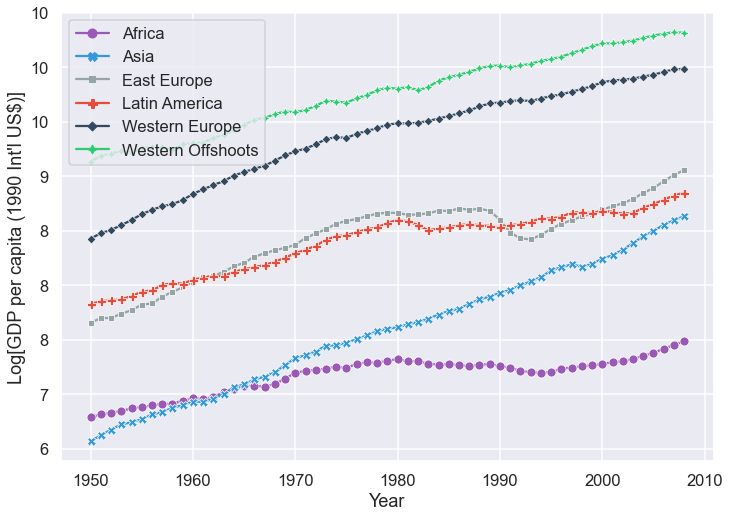

In [49]:
fig

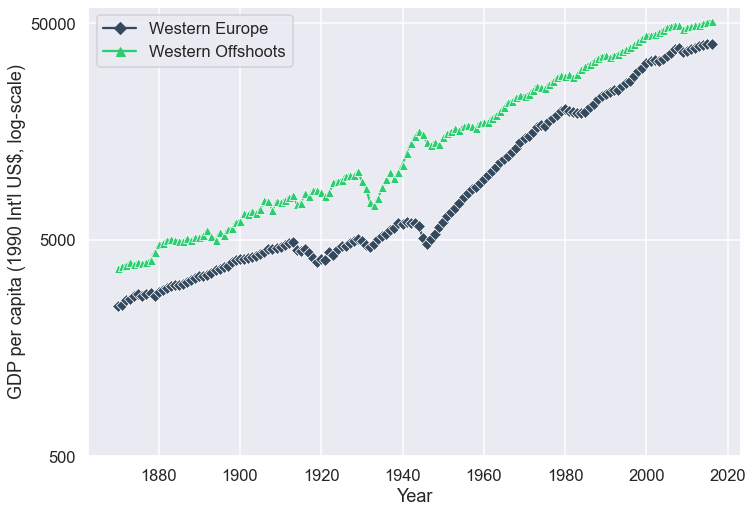

In [50]:
mycolors2 = ["#34495e", "#2ecc71"]
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='cgdppc', hue='Region', data=maddison_new_region.loc[(maddison_new_region.year>=1870) & (maddison_new_region.region.apply(lambda x: x in ['we', 'wo']))], alpha=1, palette=sns.color_palette(mycolors2), style='Region', dashes=False, markers=['D', '^'],)
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.1f}'))
ax.set_yscale('log')
ax.set_yticks([500, 5000, 50000])
ax.get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
ax.legend(loc='upper left')
ax.set_xlabel('Year')
ax.set_ylabel('GDP per capita (1990 Int\'l US$, log-scale)')
plt.savefig(pathgraphs + 'sg1870-2000.pdf', dpi=300, bbox_inches='tight')

## Growth Rates

Let's select a subsample of periods between 1CE and 2008 and compute the growth rate per year of income per capita in the world. We will select the sample of years we want using the ``loc`` operator and then use the ``shift`` operator to get data from the previous observation.

In [51]:
world_gdppc = world_gdppc.dropna(subset=['gdppc_'])
world_gdppc['mysample'] = world_gdppc.year.apply(lambda x: x in [1, 1000, 1500, 1820, 2008]).astype(int)
world_gdppc

,Country,year,gdppc_,Region,mysample
0,World Average,1,466.752281,World Average,1
1,World Average,1000,453.402162,World Average,1
2,World Average,1500,566.389464,World Average,1
3,World Average,1600,595.783856,World Average,0
4,World Average,1700,614.853602,World Average,0
...,...,...,...,...,...
189,World Average,2004,6738.281333,World Average,0
190,World Average,2005,6960.031035,World Average,0
191,World Average,2006,7238.383483,World Average,0
192,World Average,2007,7467.648232,World Average,0


In [52]:
maddison_growth = world_gdppc.loc[world_gdppc.mysample==1].reset_index(drop=True)
maddison_growth['year_prev'] = maddison_growth['year'] - maddison_growth['year'].shift(1)
maddison_growth['growth'] = ((maddison_growth['gdppc_'] / maddison_growth['gdppc_'].shift(1)) ** (1/ maddison_growth.year_prev) -1)
maddison_growth['Period'] = maddison_growth['year'].astype(str).shift(1) + '-' + maddison_growth['year'].astype(str)
maddison_growth    

,Country,year,gdppc_,Region,mysample,year_prev,growth,Period
0,World Average,1,466.752281,World Average,1,NaN,NaN,NaN
1,World Average,1000,453.402162,World Average,1,999.0,-0.000029,1-1000
2,World Average,1500,566.389464,World Average,1,500.0,0.000445,1000-1500
3,World Average,1820,665.735330,World Average,1,320.0,0.000505,1500-1820
4,World Average,2008,7613.922924,World Average,1,188.0,0.013046,1820-2008


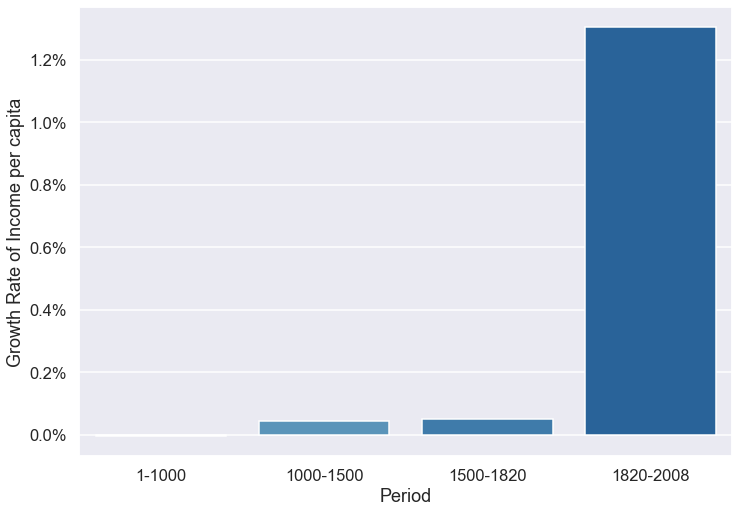

In [53]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.barplot(x='Period', y='growth', data=maddison_growth, alpha=1, palette=sns.color_palette("Blues", maddison_growth.shape[0]+4)[4:])
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.1%}'))
#handles, labels = ax.get_legend_handles_labels()
#ax.legend(handles=handles[1:], labels=labels[1:])
ax.set_xlabel('Period')
ax.set_ylabel('Growth Rate of Income per capita')
plt.savefig(pathgraphs + 'W-g1-2010.pdf', dpi=300, bbox_inches='tight')

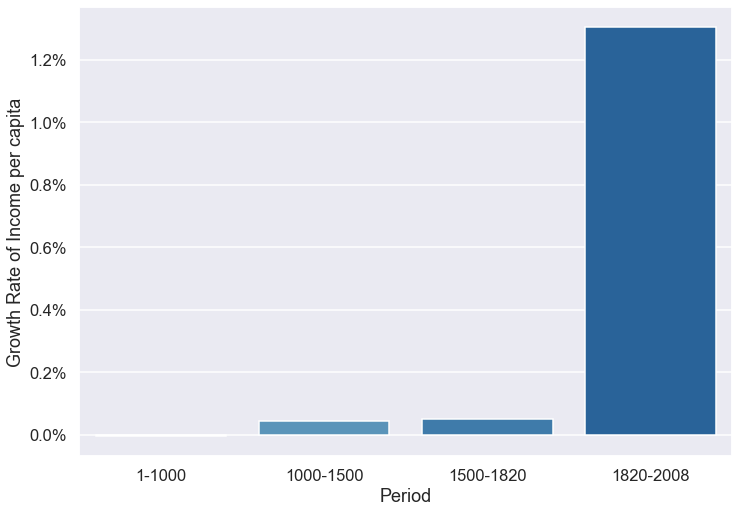

In [54]:
fig

## Growth of population and income (by regions)

In [55]:
# Growth rates gdppc
world_gdppc = maddison_old_gdppc.loc[maddison_old_gdppc.Country=='World Average']
world_gdppc = pd.wide_to_long(world_gdppc, ['gdppc_'], i='Country', j='year').reset_index()
world_gdppc['Region'] = 'World'
world_gdppc['Region'] = world_gdppc.Region.astype('category')
world_gdppc['gdppc_'] = world_gdppc.gdppc_.astype(float)
world_gdppc = world_gdppc.dropna(subset=['gdppc_'])
world_gdppc['mysample'] = world_gdppc.year.apply(lambda x: x in [1, 1000, 1500, 1820, 1913]).astype(int)
maddison_growth_gdppc = world_gdppc.loc[world_gdppc.mysample==1].reset_index(drop=True)
maddison_growth_gdppc['year_prev'] = maddison_growth_gdppc['year'] - maddison_growth_gdppc['year'].shift(1)
maddison_growth_gdppc['growth'] = ((maddison_growth_gdppc['gdppc_'] / maddison_growth_gdppc['gdppc_'].shift(1)) ** (1/ maddison_growth_gdppc.year_prev) -1)
maddison_growth_gdppc['Period'] = maddison_growth_gdppc['year'].astype(str).shift(1) + '-' + maddison_growth_gdppc['year'].astype(str)
print(maddison_growth_gdppc)

         Country  year       gdppc_ Region  mysample  year_prev    growth     Period
0  World Average     1   466.752281  World         1        NaN       NaN        NaN
1  World Average  1000   453.402162  World         1      999.0 -0.000029     1-1000
2  World Average  1500   566.389464  World         1      500.0  0.000445  1000-1500
3  World Average  1820   665.735330  World         1      320.0  0.000505  1500-1820
4  World Average  1913  1524.430799  World         1       93.0  0.008948  1820-1913


In [56]:
# Growth rates population
world_pop = maddison_old_pop.loc[maddison_old_pop.Country=='World Total']
world_pop = pd.wide_to_long(world_pop, ['pop_'], i='Country', j='year').reset_index()
world_pop['Region'] = 'World'
world_pop['Region'] = world_pop.Region.astype('category')
world_pop['pop_'] = world_pop.pop_.astype(float)
world_pop = world_pop.dropna(subset=['pop_'])
world_pop['mysample'] = world_pop.year.apply(lambda x: x in [1, 1000, 1500, 1820, 1913]).astype(int)
maddison_growth_pop = world_pop.loc[world_pop.mysample==1].reset_index(drop=True)
maddison_growth_pop['year_prev'] = maddison_growth_pop['year'] - maddison_growth_pop['year'].shift(1)
maddison_growth_pop['growth'] = ((maddison_growth_pop['pop_'] / maddison_growth_pop['pop_'].shift(1)) ** (1/ maddison_growth_pop.year_prev) -1)
maddison_growth_pop['Period'] = maddison_growth_pop['year'].astype(str).shift(1) + '-' + maddison_growth_pop['year'].astype(str)
print(maddison_growth_pop)    

       Country  year          pop_ Region  mysample  year_prev    growth     Period
0  World Total     1  2.258200e+05  World         1        NaN       NaN        NaN
1  World Total  1000  2.673300e+05  World         1      999.0  0.000169     1-1000
2  World Total  1500  4.384280e+05  World         1      500.0  0.000990  1000-1500
3  World Total  1820  1.041708e+06  World         1      320.0  0.002708  1500-1820
4  World Total  1913  1.792925e+06  World         1       93.0  0.005856  1820-1913


In [57]:
maddison_growth = maddison_growth_gdppc[['Region', 'Period', 'growth']].merge(maddison_growth_pop[['Region', 'Period', 'growth']], on=['Region', 'Period'],
                                                            suffixes=['_gdppc', '_pop'])
maddison_growth = maddison_growth.dropna()
maddison_growth = maddison_growth.rename(columns={'growth_gdppc':'GDPpc', 'growth_pop':'Population'})
maddison_growth

,Region,Period,GDPpc,Population
1,World,1-1000,-0.000029,0.000169
2,World,1000-1500,0.000445,0.000990
3,World,1500-1820,0.000505,0.002708
4,World,1820-1913,0.008948,0.005856


In [58]:
maddison_growth = maddison_growth_gdppc[['Region', 'Period', 'growth']].merge(maddison_growth_pop[['Region', 'Period', 'growth']], on=['Region', 'Period'],
                                                            suffixes=['_gdppc', '_pop'])
maddison_growth = maddison_growth.dropna()
maddison_growth = maddison_growth.rename(columns={'growth_gdppc':'Income per capita', 'growth_pop':'Population'})
maddison_growth = pd.melt(maddison_growth, id_vars =['Region', 'Period'], value_vars =['Income per capita', 'Population'],
        var_name='variable',value_name='growth') 
maddison_growth

,Region,Period,variable,growth
0,World,1-1000,Income per capita,-0.000029
1,World,1000-1500,Income per capita,0.000445
2,World,1500-1820,Income per capita,0.000505
3,World,1820-1913,Income per capita,0.008948
4,World,1-1000,Population,0.000169
5,World,1000-1500,Population,0.000990
6,World,1500-1820,Population,0.002708
7,World,1820-1913,Population,0.005856


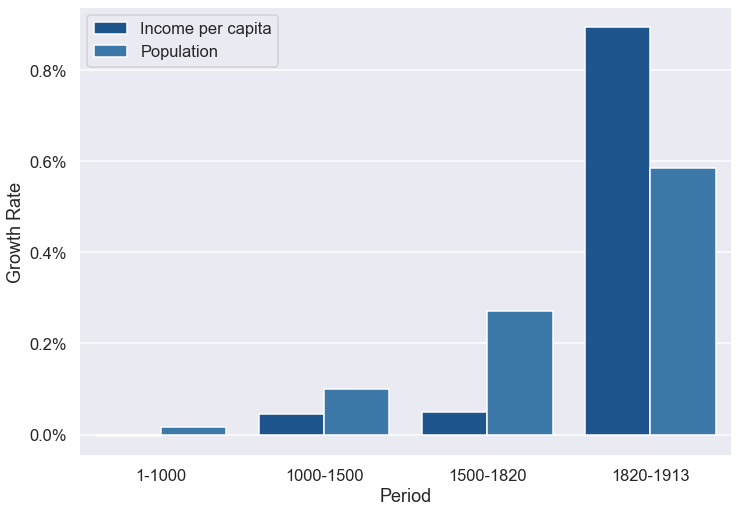

In [59]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.barplot(x='Period', y='growth', hue='variable', data=maddison_growth, alpha=1, palette=sns.color_palette("Blues_r"))
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.1%}'))
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])
ax.set_xlabel('Period')
ax.set_ylabel('Growth Rate')
plt.savefig(pathgraphs + 'W-pm-gr-y-p.pdf', dpi=300, bbox_inches='tight')

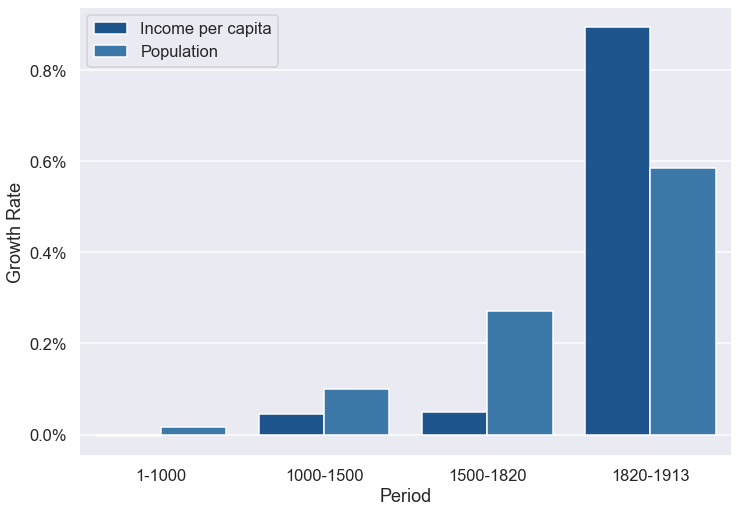

In [60]:
fig

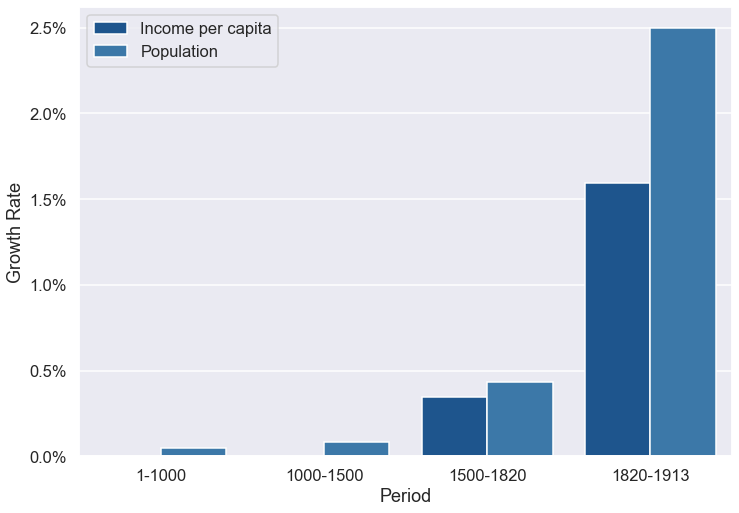

In [61]:
# Growth rates gdppc
myregion = 'Western Offshoots'
fname = 'WO'
world_gdppc = maddison_old_gdppc.loc[maddison_old_gdppc.Country.astype(str).str.strip()=='Total '+ myregion]
world_gdppc = pd.wide_to_long(world_gdppc, ['gdppc_'], i='Country', j='year').reset_index()
world_gdppc['Region'] = myregion
world_gdppc['Region'] = world_gdppc.Region.astype('category')
world_gdppc['gdppc_'] = world_gdppc.gdppc_.astype(float)
world_gdppc = world_gdppc.dropna(subset=['gdppc_'])
world_gdppc['mysample'] = world_gdppc.year.apply(lambda x: x in [1, 1000, 1500, 1820, 1913]).astype(int)
maddison_growth_gdppc = world_gdppc.loc[world_gdppc.mysample==1].reset_index(drop=True)
maddison_growth_gdppc['year_prev'] = maddison_growth_gdppc['year'] - maddison_growth_gdppc['year'].shift(1)
maddison_growth_gdppc['growth'] = ((maddison_growth_gdppc['gdppc_'] / maddison_growth_gdppc['gdppc_'].shift(1)) ** (1/ maddison_growth_gdppc.year_prev) -1)
maddison_growth_gdppc['Period'] = maddison_growth_gdppc['year'].astype(str).shift(1) + '-' + maddison_growth_gdppc['year'].astype(str)

# Growth rates population
world_pop = maddison_old_pop.loc[maddison_old_pop.Country.astype(str).str.strip()=='Total '+ myregion]
world_pop = pd.wide_to_long(world_pop, ['pop_'], i='Country', j='year').reset_index()
world_pop['Region'] = myregion
world_pop['Region'] = world_pop.Region.astype('category')
world_pop['pop_'] = world_pop.pop_.astype(float)
world_pop = world_pop.dropna(subset=['pop_'])
world_pop['mysample'] = world_pop.year.apply(lambda x: x in [1, 1000, 1500, 1820, 1913]).astype(int)

# Merge
maddison_growth_pop = world_pop.loc[world_pop.mysample==1].reset_index(drop=True)
maddison_growth_pop['year_prev'] = maddison_growth_pop['year'] - maddison_growth_pop['year'].shift(1)
maddison_growth_pop['growth'] = ((maddison_growth_pop['pop_'] / maddison_growth_pop['pop_'].shift(1)) ** (1/ maddison_growth_pop.year_prev) -1)
maddison_growth_pop['Period'] = maddison_growth_pop['year'].astype(str).shift(1) + '-' + maddison_growth_pop['year'].astype(str)
maddison_growth = maddison_growth_gdppc[['Region', 'Period', 'growth']].merge(maddison_growth_pop[['Region', 'Period', 'growth']], on=['Region', 'Period'],
                                                            suffixes=['_gdppc', '_pop'])
maddison_growth = maddison_growth.dropna()
maddison_growth = maddison_growth.rename(columns={'growth_gdppc':'GDPpc', 'growth_pop':'Population'})
maddison_growth = maddison_growth_gdppc[['Region', 'Period', 'growth']].merge(maddison_growth_pop[['Region', 'Period', 'growth']], on=['Region', 'Period'],
                                                            suffixes=['_gdppc', '_pop'])
maddison_growth = maddison_growth.dropna()
maddison_growth = maddison_growth.rename(columns={'growth_gdppc':'Income per capita', 'growth_pop':'Population'})
maddison_growth = pd.melt(maddison_growth, id_vars =['Region', 'Period'], value_vars =['Income per capita', 'Population'],
        var_name='variable',value_name='growth') 

# Plot
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.barplot(x='Period', y='growth', hue='variable', data=maddison_growth, alpha=1, palette=sns.color_palette("Blues_r"))
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.1%}'))
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])
ax.set_xlabel('Period')
ax.set_ylabel('Growth Rate')
plt.savefig(pathgraphs + fname + '-pm-gr-y-p.pdf', dpi=300, bbox_inches='tight')

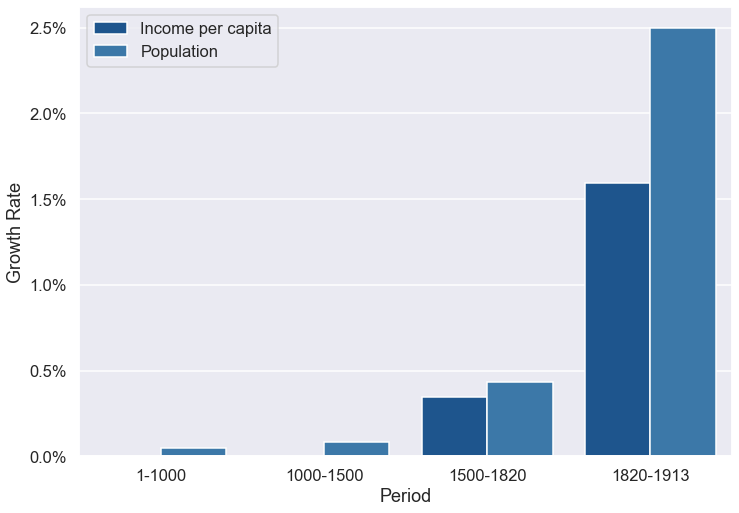

In [62]:
fig

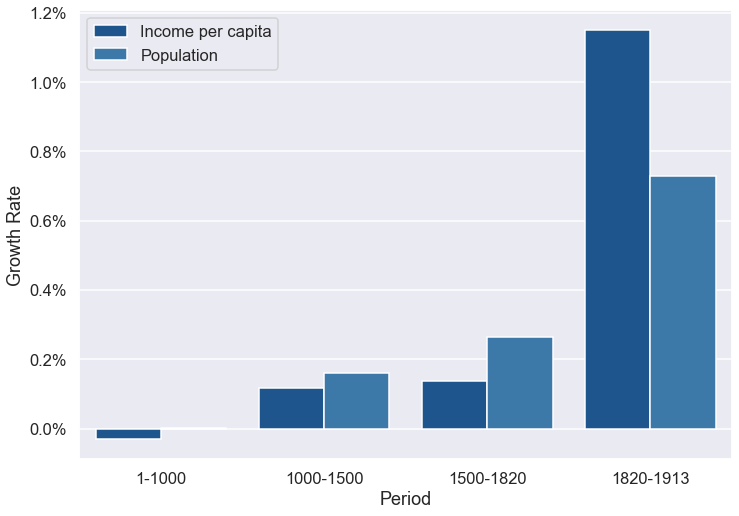

In [63]:
# Growth rates gdppc
myregion = 'Western Europe'
fname = 'WE'
world_gdppc = maddison_old_gdppc.loc[maddison_old_gdppc.Country.astype(str).str.strip()=='Total 30  '+ myregion]
world_gdppc = pd.wide_to_long(world_gdppc, ['gdppc_'], i='Country', j='year').reset_index()
world_gdppc['Region'] = myregion
world_gdppc['Region'] = world_gdppc.Region.astype('category')
world_gdppc['gdppc_'] = world_gdppc.gdppc_.astype(float)
world_gdppc = world_gdppc.dropna(subset=['gdppc_'])
world_gdppc['mysample'] = world_gdppc.year.apply(lambda x: x in [1, 1000, 1500, 1820, 1913]).astype(int)
maddison_growth_gdppc = world_gdppc.loc[world_gdppc.mysample==1].reset_index(drop=True)
maddison_growth_gdppc['year_prev'] = maddison_growth_gdppc['year'] - maddison_growth_gdppc['year'].shift(1)
maddison_growth_gdppc['growth'] = ((maddison_growth_gdppc['gdppc_'] / maddison_growth_gdppc['gdppc_'].shift(1)) ** (1/ maddison_growth_gdppc.year_prev) -1)
maddison_growth_gdppc['Period'] = maddison_growth_gdppc['year'].astype(str).shift(1) + '-' + maddison_growth_gdppc['year'].astype(str)

# Growth rates population
world_pop = maddison_old_pop.loc[maddison_old_pop.Country.astype(str).str.strip()=='Total 30  '+ myregion]
world_pop = pd.wide_to_long(world_pop, ['pop_'], i='Country', j='year').reset_index()
world_pop['Region'] = myregion
world_pop['Region'] = world_pop.Region.astype('category')
world_pop['pop_'] = world_pop.pop_.astype(float)
world_pop = world_pop.dropna(subset=['pop_'])
world_pop['mysample'] = world_pop.year.apply(lambda x: x in [1, 1000, 1500, 1820, 1913]).astype(int)

# Merge
maddison_growth_pop = world_pop.loc[world_pop.mysample==1].reset_index(drop=True)
maddison_growth_pop['year_prev'] = maddison_growth_pop['year'] - maddison_growth_pop['year'].shift(1)
maddison_growth_pop['growth'] = ((maddison_growth_pop['pop_'] / maddison_growth_pop['pop_'].shift(1)) ** (1/ maddison_growth_pop.year_prev) -1)
maddison_growth_pop['Period'] = maddison_growth_pop['year'].astype(str).shift(1) + '-' + maddison_growth_pop['year'].astype(str)
maddison_growth = maddison_growth_gdppc[['Region', 'Period', 'growth']].merge(maddison_growth_pop[['Region', 'Period', 'growth']], on=['Region', 'Period'],
                                                            suffixes=['_gdppc', '_pop'])
maddison_growth = maddison_growth.dropna()
maddison_growth = maddison_growth.rename(columns={'growth_gdppc':'GDPpc', 'growth_pop':'Population'})
maddison_growth = maddison_growth_gdppc[['Region', 'Period', 'growth']].merge(maddison_growth_pop[['Region', 'Period', 'growth']], on=['Region', 'Period'],
                                                            suffixes=['_gdppc', '_pop'])
maddison_growth = maddison_growth.dropna()
maddison_growth = maddison_growth.rename(columns={'growth_gdppc':'Income per capita', 'growth_pop':'Population'})
maddison_growth = pd.melt(maddison_growth, id_vars =['Region', 'Period'], value_vars =['Income per capita', 'Population'],
        var_name='variable',value_name='growth') 

# Plot
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.barplot(x='Period', y='growth', hue='variable', data=maddison_growth, alpha=1, palette=sns.color_palette("Blues_r"))
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.1%}'))
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])
ax.set_xlabel('Period')
ax.set_ylabel('Growth Rate')
plt.savefig(pathgraphs + fname + '-pm-gr-y-p.pdf', dpi=300, bbox_inches='tight')

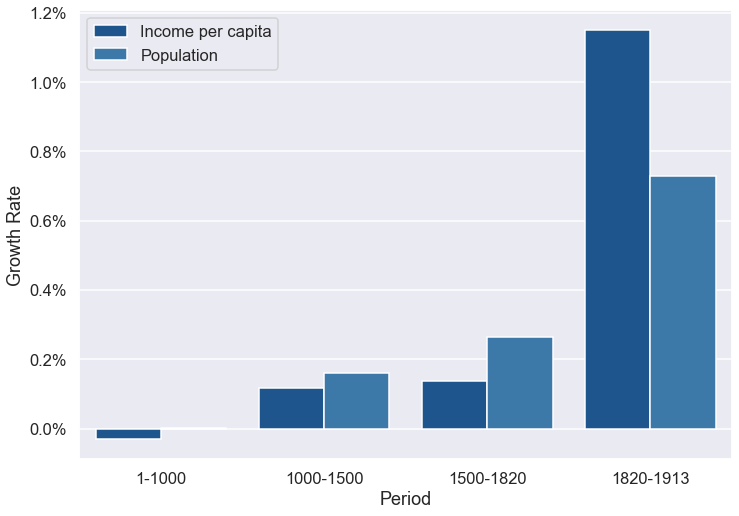

In [64]:
fig

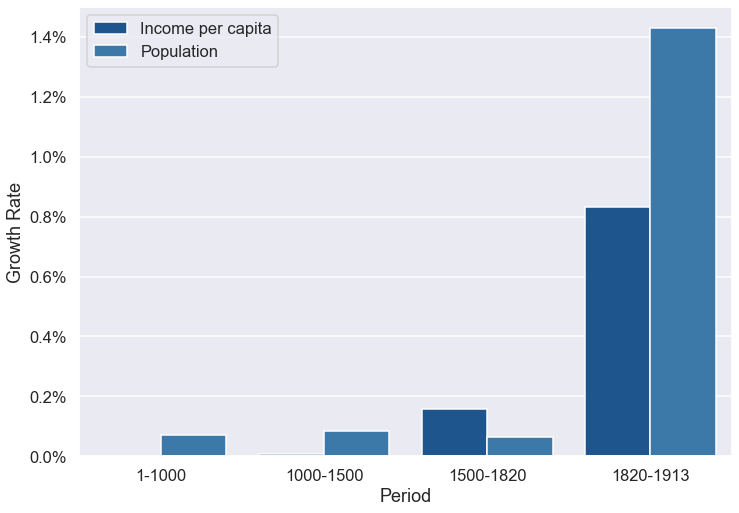

In [65]:
# Growth rates gdppc
myregion = 'Latin America'
fname = 'LA'
world_gdppc = maddison_old_gdppc.loc[maddison_old_gdppc.Country.astype(str).str.strip()=='Total '+ myregion]
world_gdppc = pd.wide_to_long(world_gdppc, ['gdppc_'], i='Country', j='year').reset_index()
world_gdppc['Region'] = myregion
world_gdppc['Region'] = world_gdppc.Region.astype('category')
world_gdppc['gdppc_'] = world_gdppc.gdppc_.astype(float)
world_gdppc = world_gdppc.dropna(subset=['gdppc_'])
world_gdppc['mysample'] = world_gdppc.year.apply(lambda x: x in [1, 1000, 1500, 1820, 1913]).astype(int)
maddison_growth_gdppc = world_gdppc.loc[world_gdppc.mysample==1].reset_index(drop=True)
maddison_growth_gdppc['year_prev'] = maddison_growth_gdppc['year'] - maddison_growth_gdppc['year'].shift(1)
maddison_growth_gdppc['growth'] = ((maddison_growth_gdppc['gdppc_'] / maddison_growth_gdppc['gdppc_'].shift(1)) ** (1/ maddison_growth_gdppc.year_prev) -1)
maddison_growth_gdppc['Period'] = maddison_growth_gdppc['year'].astype(str).shift(1) + '-' + maddison_growth_gdppc['year'].astype(str)

# Growth rates population
world_pop = maddison_old_pop.loc[maddison_old_pop.Country.astype(str).str.strip()=='Total '+ myregion]
world_pop = pd.wide_to_long(world_pop, ['pop_'], i='Country', j='year').reset_index()
world_pop['Region'] = myregion
world_pop['Region'] = world_pop.Region.astype('category')
world_pop['pop_'] = world_pop.pop_.astype(float)
world_pop = world_pop.dropna(subset=['pop_'])
world_pop['mysample'] = world_pop.year.apply(lambda x: x in [1, 1000, 1500, 1820, 1913]).astype(int)

# Merge
maddison_growth_pop = world_pop.loc[world_pop.mysample==1].reset_index(drop=True)
maddison_growth_pop['year_prev'] = maddison_growth_pop['year'] - maddison_growth_pop['year'].shift(1)
maddison_growth_pop['growth'] = ((maddison_growth_pop['pop_'] / maddison_growth_pop['pop_'].shift(1)) ** (1/ maddison_growth_pop.year_prev) -1)
maddison_growth_pop['Period'] = maddison_growth_pop['year'].astype(str).shift(1) + '-' + maddison_growth_pop['year'].astype(str)
maddison_growth = maddison_growth_gdppc[['Region', 'Period', 'growth']].merge(maddison_growth_pop[['Region', 'Period', 'growth']], on=['Region', 'Period'],
                                                            suffixes=['_gdppc', '_pop'])
maddison_growth = maddison_growth.dropna()
maddison_growth = maddison_growth.rename(columns={'growth_gdppc':'GDPpc', 'growth_pop':'Population'})
maddison_growth = maddison_growth_gdppc[['Region', 'Period', 'growth']].merge(maddison_growth_pop[['Region', 'Period', 'growth']], on=['Region', 'Period'],
                                                            suffixes=['_gdppc', '_pop'])
maddison_growth = maddison_growth.dropna()
maddison_growth = maddison_growth.rename(columns={'growth_gdppc':'Income per capita', 'growth_pop':'Population'})
maddison_growth = pd.melt(maddison_growth, id_vars =['Region', 'Period'], value_vars =['Income per capita', 'Population'],
        var_name='variable',value_name='growth') 

# Plot
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.barplot(x='Period', y='growth', hue='variable', data=maddison_growth, alpha=1, palette=sns.color_palette("Blues_r"))
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.1%}'))
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])
ax.set_xlabel('Period')
ax.set_ylabel('Growth Rate')
plt.savefig(pathgraphs + fname + '-pm-gr-y-p.pdf', dpi=300, bbox_inches='tight')

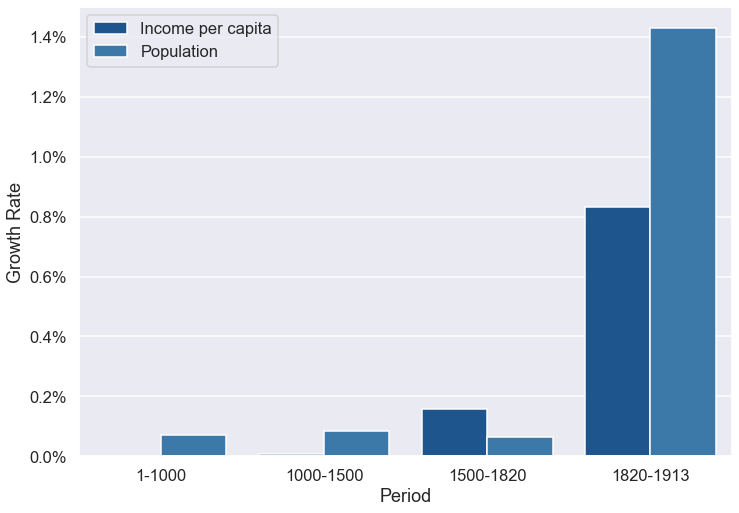

In [66]:
fig

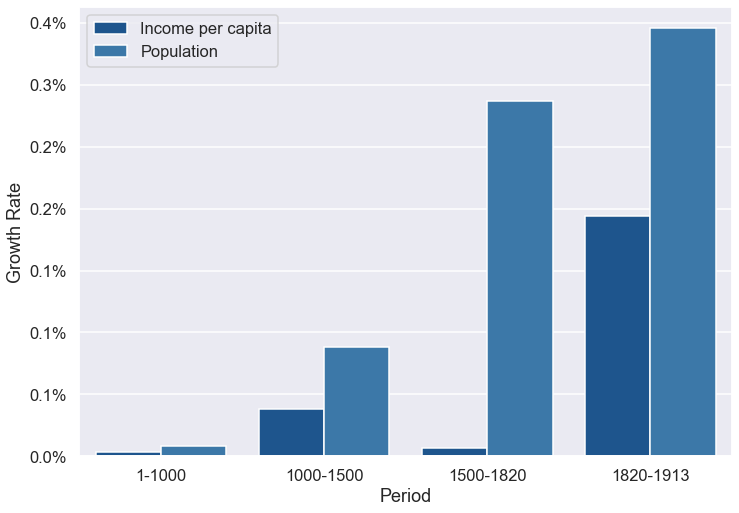

In [67]:
# Growth rates gdppc
myregion = 'Asia'
fname = 'AS'
world_gdppc = maddison_old_gdppc.loc[maddison_old_gdppc.Country.astype(str).str.strip()=='Total '+ myregion]
world_gdppc = pd.wide_to_long(world_gdppc, ['gdppc_'], i='Country', j='year').reset_index()
world_gdppc['Region'] = myregion
world_gdppc['Region'] = world_gdppc.Region.astype('category')
world_gdppc['gdppc_'] = world_gdppc.gdppc_.astype(float)
world_gdppc = world_gdppc.dropna(subset=['gdppc_'])
world_gdppc['mysample'] = world_gdppc.year.apply(lambda x: x in [1, 1000, 1500, 1820, 1913]).astype(int)
maddison_growth_gdppc = world_gdppc.loc[world_gdppc.mysample==1].reset_index(drop=True)
maddison_growth_gdppc['year_prev'] = maddison_growth_gdppc['year'] - maddison_growth_gdppc['year'].shift(1)
maddison_growth_gdppc['growth'] = ((maddison_growth_gdppc['gdppc_'] / maddison_growth_gdppc['gdppc_'].shift(1)) ** (1/ maddison_growth_gdppc.year_prev) -1)
maddison_growth_gdppc['Period'] = maddison_growth_gdppc['year'].astype(str).shift(1) + '-' + maddison_growth_gdppc['year'].astype(str)

# Growth rates population
world_pop = maddison_old_pop.loc[maddison_old_pop.Country.astype(str).str.strip()=='Total '+ myregion]
world_pop = pd.wide_to_long(world_pop, ['pop_'], i='Country', j='year').reset_index()
world_pop['Region'] = myregion
world_pop['Region'] = world_pop.Region.astype('category')
world_pop['pop_'] = world_pop.pop_.astype(float)
world_pop = world_pop.dropna(subset=['pop_'])
world_pop['mysample'] = world_pop.year.apply(lambda x: x in [1, 1000, 1500, 1820, 1913]).astype(int)

# Merge
maddison_growth_pop = world_pop.loc[world_pop.mysample==1].reset_index(drop=True)
maddison_growth_pop['year_prev'] = maddison_growth_pop['year'] - maddison_growth_pop['year'].shift(1)
maddison_growth_pop['growth'] = ((maddison_growth_pop['pop_'] / maddison_growth_pop['pop_'].shift(1)) ** (1/ maddison_growth_pop.year_prev) -1)
maddison_growth_pop['Period'] = maddison_growth_pop['year'].astype(str).shift(1) + '-' + maddison_growth_pop['year'].astype(str)
maddison_growth = maddison_growth_gdppc[['Region', 'Period', 'growth']].merge(maddison_growth_pop[['Region', 'Period', 'growth']], on=['Region', 'Period'],
                                                            suffixes=['_gdppc', '_pop'])
maddison_growth = maddison_growth.dropna()
maddison_growth = maddison_growth.rename(columns={'growth_gdppc':'GDPpc', 'growth_pop':'Population'})
maddison_growth = maddison_growth_gdppc[['Region', 'Period', 'growth']].merge(maddison_growth_pop[['Region', 'Period', 'growth']], on=['Region', 'Period'],
                                                            suffixes=['_gdppc', '_pop'])
maddison_growth = maddison_growth.dropna()
maddison_growth = maddison_growth.rename(columns={'growth_gdppc':'Income per capita', 'growth_pop':'Population'})
maddison_growth = pd.melt(maddison_growth, id_vars =['Region', 'Period'], value_vars =['Income per capita', 'Population'],
        var_name='variable',value_name='growth') 

# Plot
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.barplot(x='Period', y='growth', hue='variable', data=maddison_growth, alpha=1, palette=sns.color_palette("Blues_r"))
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.1%}'))
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])
ax.set_xlabel('Period')
ax.set_ylabel('Growth Rate')
plt.savefig(pathgraphs + fname + '-pm-gr-y-p.pdf', dpi=300, bbox_inches='tight')

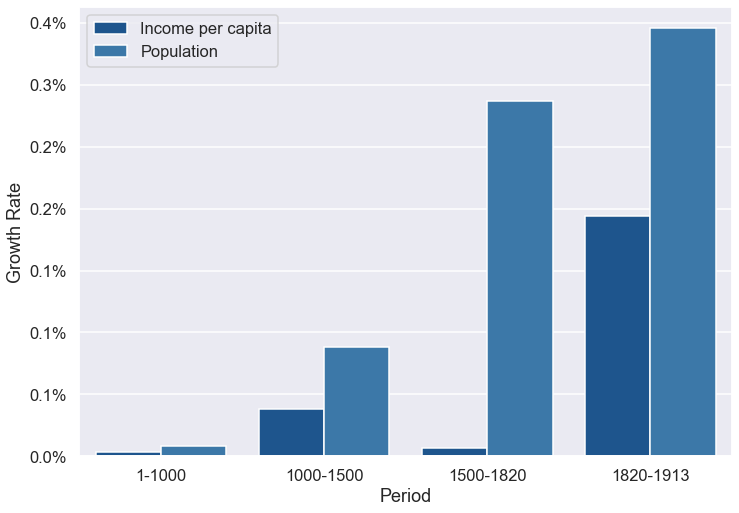

In [68]:
fig

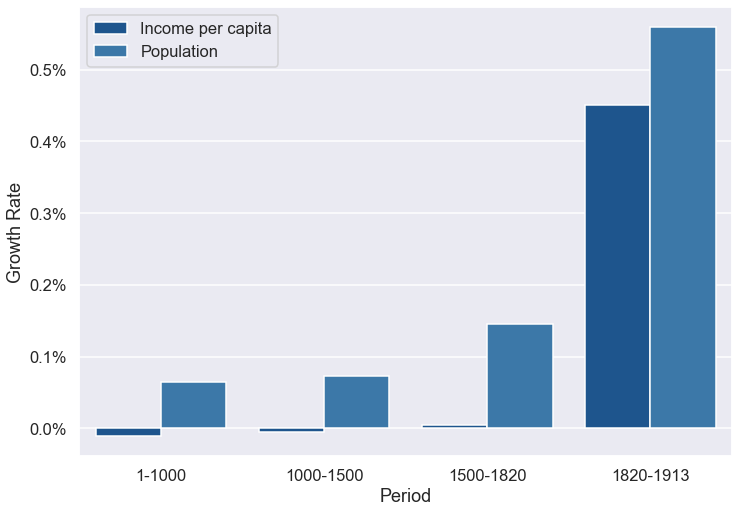

In [69]:
# Growth rates gdppc
myregion = 'Africa'
fname = 'AF'
world_gdppc = maddison_old_gdppc.loc[maddison_old_gdppc.Country.astype(str).str.strip()=='Total '+ myregion]
world_gdppc = pd.wide_to_long(world_gdppc, ['gdppc_'], i='Country', j='year').reset_index()
world_gdppc['Region'] = myregion
world_gdppc['Region'] = world_gdppc.Region.astype('category')
world_gdppc['gdppc_'] = world_gdppc.gdppc_.astype(float)
world_gdppc = world_gdppc.dropna(subset=['gdppc_'])
world_gdppc['mysample'] = world_gdppc.year.apply(lambda x: x in [1, 1000, 1500, 1820, 1913]).astype(int)
maddison_growth_gdppc = world_gdppc.loc[world_gdppc.mysample==1].reset_index(drop=True)
maddison_growth_gdppc['year_prev'] = maddison_growth_gdppc['year'] - maddison_growth_gdppc['year'].shift(1)
maddison_growth_gdppc['growth'] = ((maddison_growth_gdppc['gdppc_'] / maddison_growth_gdppc['gdppc_'].shift(1)) ** (1/ maddison_growth_gdppc.year_prev) -1)
maddison_growth_gdppc['Period'] = maddison_growth_gdppc['year'].astype(str).shift(1) + '-' + maddison_growth_gdppc['year'].astype(str)

# Growth rates population
world_pop = maddison_old_pop.loc[maddison_old_pop.Country.astype(str).str.strip()=='Total '+ myregion]
world_pop = pd.wide_to_long(world_pop, ['pop_'], i='Country', j='year').reset_index()
world_pop['Region'] = myregion
world_pop['Region'] = world_pop.Region.astype('category')
world_pop['pop_'] = world_pop.pop_.astype(float)
world_pop = world_pop.dropna(subset=['pop_'])
world_pop['mysample'] = world_pop.year.apply(lambda x: x in [1, 1000, 1500, 1820, 1913]).astype(int)

# Merge
maddison_growth_pop = world_pop.loc[world_pop.mysample==1].reset_index(drop=True)
maddison_growth_pop['year_prev'] = maddison_growth_pop['year'] - maddison_growth_pop['year'].shift(1)
maddison_growth_pop['growth'] = ((maddison_growth_pop['pop_'] / maddison_growth_pop['pop_'].shift(1)) ** (1/ maddison_growth_pop.year_prev) -1)
maddison_growth_pop['Period'] = maddison_growth_pop['year'].astype(str).shift(1) + '-' + maddison_growth_pop['year'].astype(str)
maddison_growth = maddison_growth_gdppc[['Region', 'Period', 'growth']].merge(maddison_growth_pop[['Region', 'Period', 'growth']], on=['Region', 'Period'],
                                                            suffixes=['_gdppc', '_pop'])
maddison_growth = maddison_growth.dropna()
maddison_growth = maddison_growth.rename(columns={'growth_gdppc':'GDPpc', 'growth_pop':'Population'})
maddison_growth = maddison_growth_gdppc[['Region', 'Period', 'growth']].merge(maddison_growth_pop[['Region', 'Period', 'growth']], on=['Region', 'Period'],
                                                            suffixes=['_gdppc', '_pop'])
maddison_growth = maddison_growth.dropna()
maddison_growth = maddison_growth.rename(columns={'growth_gdppc':'Income per capita', 'growth_pop':'Population'})
maddison_growth = pd.melt(maddison_growth, id_vars =['Region', 'Period'], value_vars =['Income per capita', 'Population'],
        var_name='variable',value_name='growth') 

# Plot
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.barplot(x='Period', y='growth', hue='variable', data=maddison_growth, alpha=1, palette=sns.color_palette("Blues_r"))
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.1%}'))
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])
ax.set_xlabel('Period')
ax.set_ylabel('Growth Rate')
plt.savefig(pathgraphs + fname + '-pm-gr-y-p.pdf', dpi=300, bbox_inches='tight')

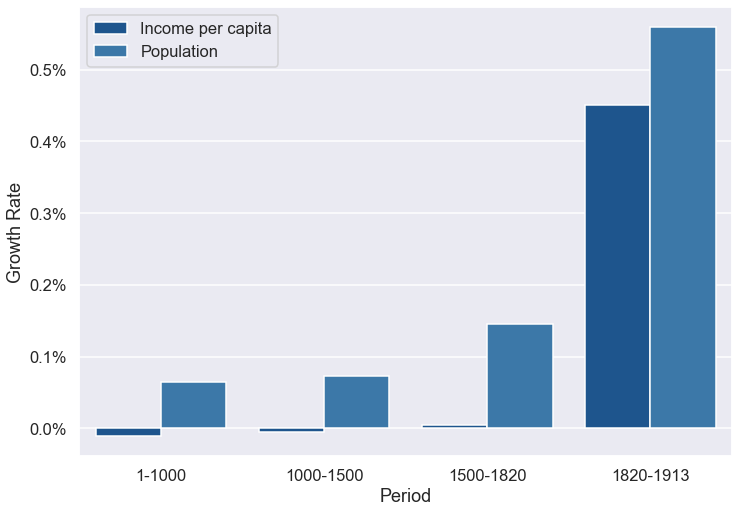

In [70]:
fig

#### Comparing richest to poorest region across time
Let's create a table that shows the GDP per capita levels for the 6 regions in the original data and compute the ratio of richest to poorest. Let's also plot it.

In [71]:
gdppc2['Richest-Poorest Ratio'] = gdppc2.max(axis=1) / gdppc2.min(axis=1)
gdp_ratio = gdppc2.loc[[1, 1000, 1500, 1700, 1820, 1870, 1913, 1940, 1960, 1980, 2000, 2008]].T
gdp_ratio = gdp_ratio.T.reset_index()
gdp_ratio['Region'] = 'Richest-Poorest'
gdp_ratio['Region'] = gdp_ratio.Region.astype('category')


In [72]:
gdp_ratio

Country,year,Africa,Asia,East Europe,Latin America,Western Europe,Western Offshoots,Richest-Poorest Ratio,Region
0,1,472.352941,455.671021,411.789474,400.000000,576.167665,400.000000,1.440419,Richest-Poorest
1,1000,424.767802,469.961665,400.000000,400.000000,427.425665,400.000000,1.174904,Richest-Poorest
2,1500,413.709504,568.417900,496.000000,416.457143,771.093805,400.000000,1.927735,Richest-Poorest
3,1700,420.628684,571.605276,606.010638,526.639004,993.456911,476.000000,2.361838,Richest-Poorest
4,1820,419.755914,580.626115,683.160984,691.060678,1194.184683,1201.993477,2.863553,Richest-Poorest
5,1870,500.011054,553.459947,936.628265,676.005331,1953.068150,2419.152411,4.838198,Richest-Poorest
6,1913,637.433138,695.131881,1694.879668,1494.431922,3456.576178,5232.816582,8.209201,Richest-Poorest
7,1940,813.374613,893.992784,1968.706774,1932.850716,4554.045082,6837.844866,8.406760,Richest-Poorest
8,1960,1055.114678,1025.743131,3069.750386,3135.517072,6879.294331,10961.082848,10.685992,Richest-Poorest
9,1980,1514.558119,2028.654705,5785.933433,5437.924365,13154.033928,18060.162963,11.924378,Richest-Poorest


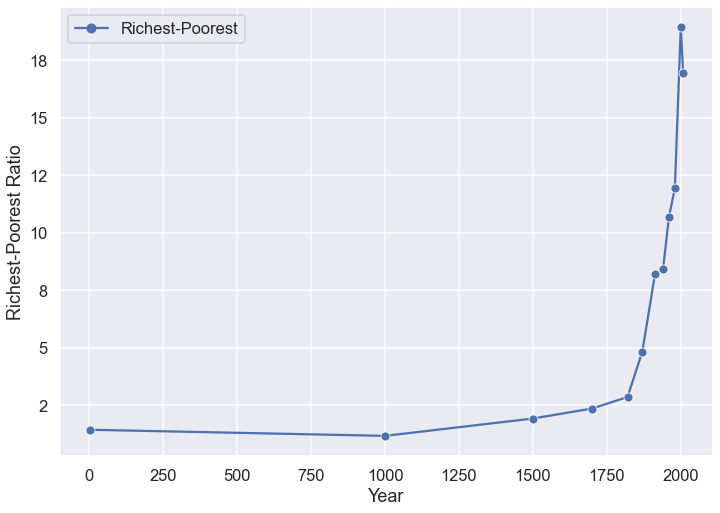

In [73]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='Richest-Poorest Ratio', data=gdp_ratio, alpha=1, hue='Region', style='Region', dashes=False, markers=True, )
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
#ax.legend(title='', prop={'size': 40})
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[1:], labels=labels[1:])
ax.set_xlabel('Year')
ax.set_ylabel('Richest-Poorest Ratio')
plt.savefig(pathgraphs + 'Richest-Poorest-Ratio.pdf', dpi=300, bbox_inches='tight')

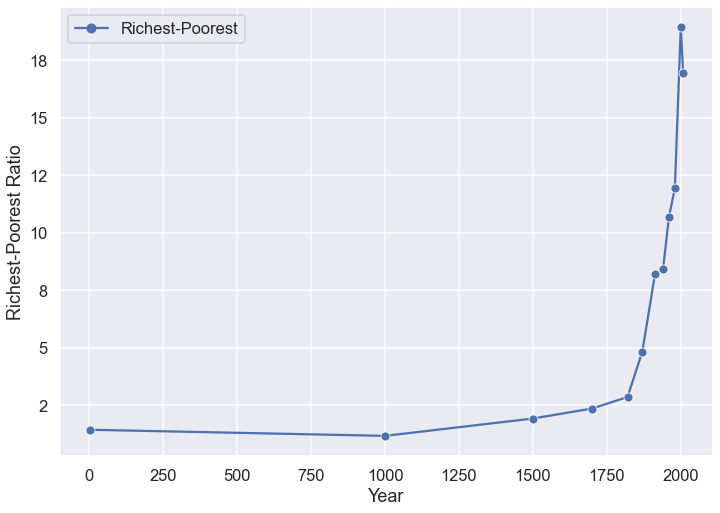

In [74]:
fig

### Visualize as Table

In [75]:
gdp_ratio.style.format({
    1: '{:,.1f}'.format, 1000: '{:,.1f}'.format, 1500: '{:,.1%}'.format, 1700: '{:,.1%}'.format, 
    1820: '{:,.1%}'.format, 1870: '{:,.1%}'.format, 1913: '{:,.1%}'.format, 1940: '{:,.1%}'.format, 
    1960: '{:,.1%}'.format, 1980: '{:,.1%}'.format, 2000: '{:,.1%}'.format, 2008: '{:,.1%}'.format, 
})

Country,year,Africa,Asia,East Europe,Latin America,Western Europe,Western Offshoots,Richest-Poorest Ratio,Region
0,1,472.352941,455.671021,411.789474,400.000000,576.167665,400.000000,1.440419,Richest-Poorest
1,1000,424.767802,469.961665,400.000000,400.000000,427.425665,400.000000,1.174904,Richest-Poorest
2,1500,413.709504,568.417900,496.000000,416.457143,771.093805,400.000000,1.927735,Richest-Poorest
3,1700,420.628684,571.605276,606.010638,526.639004,993.456911,476.000000,2.361838,Richest-Poorest
4,1820,419.755914,580.626115,683.160984,691.060678,1194.184683,1201.993477,2.863553,Richest-Poorest
5,1870,500.011054,553.459947,936.628265,676.005331,1953.068150,2419.152411,4.838198,Richest-Poorest
6,1913,637.433138,695.131881,1694.879668,1494.431922,3456.576178,5232.816582,8.209201,Richest-Poorest
7,1940,813.374613,893.992784,1968.706774,1932.850716,4554.045082,6837.844866,8.406760,Richest-Poorest
8,1960,1055.114678,1025.743131,3069.750386,3135.517072,6879.294331,10961.082848,10.685992,Richest-Poorest
9,1980,1514.558119,2028.654705,5785.933433,5437.924365,13154.033928,18060.162963,11.924378,Richest-Poorest


### Export table to LaTeX
Let's print the table as LaTeX code that can be copied and pasted in our slides or paper.

In [76]:
print(gdp_ratio.to_latex(formatters={
    1: '{:,.1f}'.format, 1000: '{:,.1f}'.format, 1500: '{:,.1f}'.format, 1700: '{:,.1f}'.format, 
    1820: '{:,.1f}'.format, 1870: '{:,.1f}'.format, 1913: '{:,.1f}'.format, 1940: '{:,.1f}'.format, 
    1960: '{:,.1f}'.format, 1980: '{:,.1f}'.format, 2000: '{:,.1f}'.format, 2008: '{:,.1f}'.format, 
}))

\begin{tabular}{lrrrrrrrrl}
\toprule
Country &  year &       Africa &         Asia &  East Europe &  Latin America &  Western Europe &  Western Offshoots &  Richest-Poorest Ratio &           Region \\
\midrule
0  &     1 &   472.352941 &   455.671021 &   411.789474 &     400.000000 &      576.167665 &         400.000000 &               1.440419 &  Richest-Poorest \\
1  &  1000 &   424.767802 &   469.961665 &   400.000000 &     400.000000 &      427.425665 &         400.000000 &               1.174904 &  Richest-Poorest \\
2  &  1500 &   413.709504 &   568.417900 &   496.000000 &     416.457143 &      771.093805 &         400.000000 &               1.927735 &  Richest-Poorest \\
3  &  1700 &   420.628684 &   571.605276 &   606.010638 &     526.639004 &      993.456911 &         476.000000 &               2.361838 &  Richest-Poorest \\
4  &  1820 &   419.755914 &   580.626115 &   683.160984 &     691.060678 &     1194.184683 &        1201.993477 &               2.863553 &  Richest-Poores

/var/folders/q1/7qsx8kmj439d81kr4f_k_wbr0000gp/T/ipykernel_10270/1652423148.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(gdp_ratio.to_latex(formatters={


In [77]:
%%latex
\begin{tabular}{lrrrrrrrrrrrr}
\toprule
year &  1    &  1000 &  1500 &  1700 &    1820 &    1870 &    1913 &    1940 &     1960 &     1980 &     2000 &     2008 \\
Country               &       &       &       &       &         &         &         &         &          &          &          &          \\
\midrule
Africa                & 472.4 & 424.8 & 413.7 & 420.6 &   419.8 &   500.0 &   637.4 &   813.4 &  1,055.1 &  1,514.6 &  1,447.1 &  1,780.3 \\
Asia                  & 455.7 & 470.0 & 568.4 & 571.6 &   580.6 &   553.5 &   695.1 &   894.0 &  1,025.7 &  2,028.7 &  3,797.6 &  5,611.2 \\
East Europe           & 411.8 & 400.0 & 496.0 & 606.0 &   683.2 &   936.6 & 1,694.9 & 1,968.7 &  3,069.8 &  5,785.9 &  5,970.2 &  8,569.0 \\
Latin America         & 400.0 & 400.0 & 416.5 & 526.6 &   691.1 &   676.0 & 1,494.4 & 1,932.9 &  3,135.5 &  5,437.9 &  5,889.2 &  6,973.1 \\
Western Europe        & 576.2 & 427.4 & 771.1 & 993.5 & 1,194.2 & 1,953.1 & 3,456.6 & 4,554.0 &  6,879.3 & 13,154.0 & 19,176.0 & 21,671.8 \\
Western Offshoots     & 400.0 & 400.0 & 400.0 & 476.0 & 1,202.0 & 2,419.2 & 5,232.8 & 6,837.8 & 10,961.1 & 18,060.2 & 27,393.8 & 30,151.8 \\
Richest-Poorest Ratio &   1.4 &   1.2 &   1.9 &   2.4 &     2.9 &     4.8 &     8.2 &     8.4 &     10.7 &     11.9 &     18.9 &     16.9 \\
\bottomrule
\end{tabular}


<IPython.core.display.Latex object>

### Export Table to HTML

In [78]:
from IPython.display import display, HTML
display(HTML(gdp_ratio.to_html(formatters={
    1: '{:,.1f}'.format, 1000: '{:,.1f}'.format, 1500: '{:,.1f}'.format, 1700: '{:,.1f}'.format, 
    1820: '{:,.1f}'.format, 1870: '{:,.1f}'.format, 1913: '{:,.1f}'.format, 1940: '{:,.1f}'.format, 
    1960: '{:,.1f}'.format, 1980: '{:,.1f}'.format, 2000: '{:,.1f}'.format, 2008: '{:,.1f}'.format, 
})))

Country,year,Africa,Asia,East Europe,Latin America,Western Europe,Western Offshoots,Richest-Poorest Ratio,Region
0,1,472.352941,455.671021,411.789474,400.000000,576.167665,400.000000,1.440419,Richest-Poorest
1,1000,424.767802,469.961665,400.000000,400.000000,427.425665,400.000000,1.174904,Richest-Poorest
2,1500,413.709504,568.417900,496.000000,416.457143,771.093805,400.000000,1.927735,Richest-Poorest
3,1700,420.628684,571.605276,606.010638,526.639004,993.456911,476.000000,2.361838,Richest-Poorest
4,1820,419.755914,580.626115,683.160984,691.060678,1194.184683,1201.993477,2.863553,Richest-Poorest
5,1870,500.011054,553.459947,936.628265,676.005331,1953.068150,2419.152411,4.838198,Richest-Poorest
6,1913,637.433138,695.131881,1694.879668,1494.431922,3456.576178,5232.816582,8.209201,Richest-Poorest
7,1940,813.374613,893.992784,1968.706774,1932.850716,4554.045082,6837.844866,8.406760,Richest-Poorest
8,1960,1055.114678,1025.743131,3069.750386,3135.517072,6879.294331,10961.082848,10.685992,Richest-Poorest
9,1980,1514.558119,2028.654705,5785.933433,5437.924365,13154.033928,18060.162963,11.924378,Richest-Poorest


# Take-off, industrialization and reversals

## Industrialization per capita

Let's create a full dataframe inserting the data by hand. This is based on data from Bairoch, P., 1982. "[International industrialization levels from 1750 to 1980](http://search.proquest.com/openview/b8f0ecee8c6f027c82a22281c0f46bcf/1?pq-origsite=gscholar&cbl=1819397)". Journal of European Economic History, 11(2), p.269. for 1750-1913 the data comes from Table 9

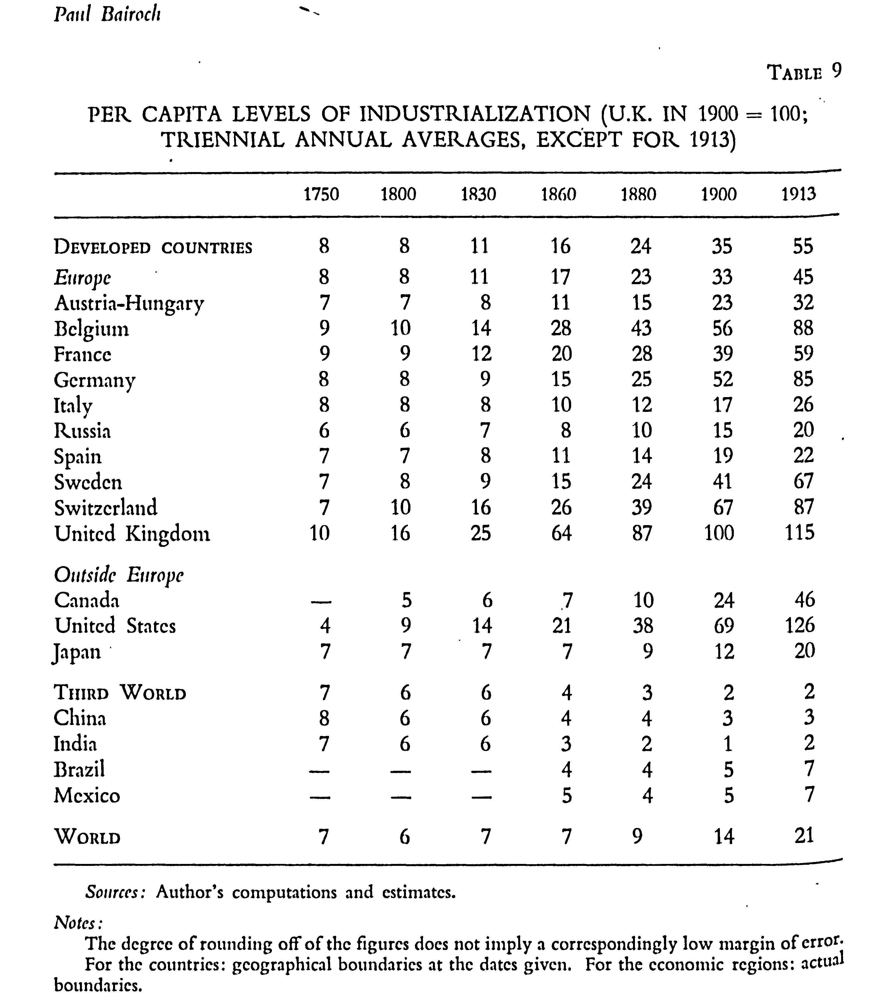

In [79]:
industrialization = [['Developed Countries', 8, 8, 11, 16, 24, 35, 55],
                     ['Europe', 8, 8, 11, 17, 23, 33, 45],
                     ['Austria-Hungary', 7, 7, 8, 11, 15, 23, 32],
                     ['Belgium', 9, 10, 14, 28, 43, 56, 88],
                     ['France', 9, 9, 12, 20, 28, 39, 59],
                     ['Germany', 8, 8, 9, 15, 25, 52, 85],
                     ['Italy', 8, 8, 8, 10, 12, 17, 26],
                     ['Russia', 6, 6, 7, 8, 10, 15, 20],
                     ['Spain', 7, 7, 8, 11, 14, 19, 22],
                     ['Sweden', 7, 8, 9, 15, 24, 41, 67],
                     ['Switzerland', 7, 10, 16, 26, 39, 67, 87],
                     ['United Kingdom', 10, 16, 25, 64, 87, 100, 115],
                     ['Canada', np.nan, 5, 6, 7, 10, 24, 46],
                     ['United States', 4, 9, 14, 21, 38, 69, 126],
                     ['Japan', 7, 7, 7, 7, 9, 12, 20],
                     ['Third World', 7, 6, 6, 4, 3, 2, 2],
                     ['China', 8, 6, 6, 4, 4, 3, 3],
                     ['India', 7, 6, 6, 3, 2, 1, 2],
                     ['Brazil', np.nan, np.nan, np.nan, 4, 4, 5, 7],
                     ['Mexico', np.nan, np.nan, np.nan, 5, 4, 5, 7],
                     ['World', 7, 6, 7, 7, 9, 14, 21]]

years = [1750, 1800, 1830, 1860, 1880, 1900, 1913]
industrialization = pd.DataFrame(industrialization, columns=['Country'] + ['y'+str(y) for y in years])

For 1913-1980 the data comes from Table 12

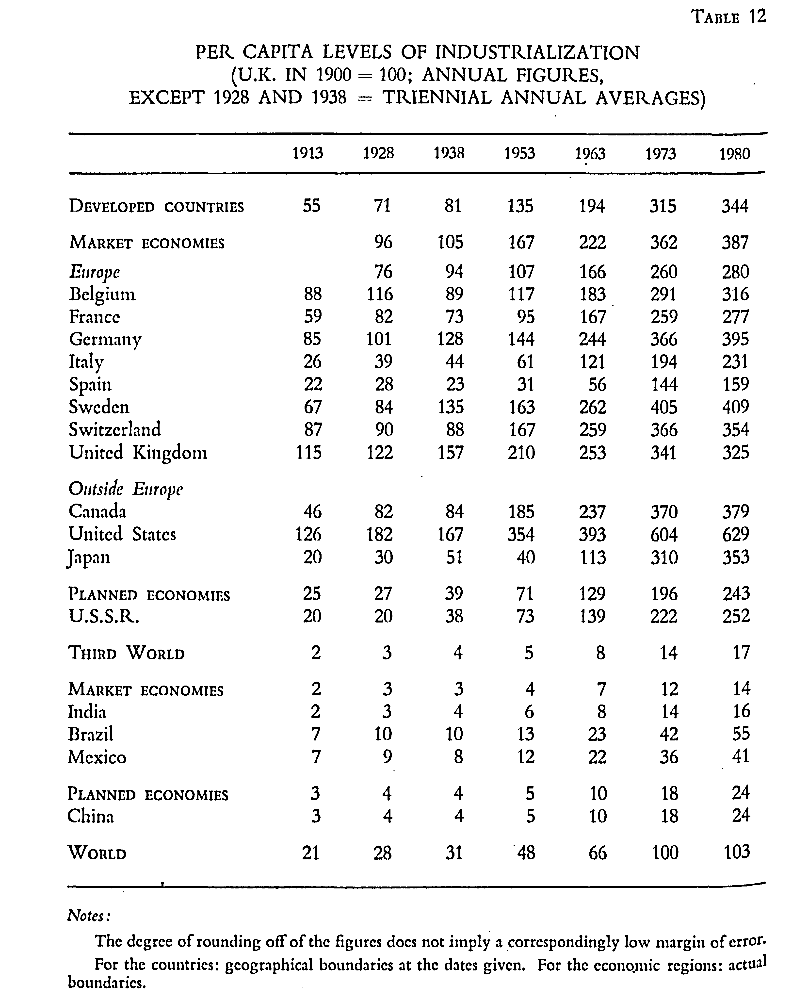

In [80]:
industrialization2 = [['Developed Countries', 55, 71, 81, 135, 194, 315, 344],
                      ['Market Economies', np.nan, 96, 105, 167, 222, 362, 387],
                      ['Europe', 45, 76, 94, 107, 166, 260, 280],
                      ['Belgium', 88, 116, 89, 117, 183, 291, 316],
                      ['France', 59, 82, 73, 95, 167, 259, 277],
                      ['Germany', 85, 101, 128, 144, 244, 366, 395],
                      ['Italy', 26, 39, 44, 61, 121, 194, 231],
                      ['Spain', 22, 28, 23, 31, 56, 144, 159],
                      ['Sweden', 67, 84, 135, 163, 262, 405, 409],
                      ['Switzerland', 87, 90, 88, 167, 259, 366, 354],
                      ['United Kingdom', 115, 122, 157, 210, 253, 341, 325],
                      ['Canada', 46, 82, 84, 185, 237, 370, 379],
                      ['United States', 126, 182, 167, 354, 393, 604, 629],
                      ['Japan', 20, 30, 51, 40, 113, 310, 353],
                      ['U.S.S.R.', 20, 20, 38, 73, 139, 222, 252],
                      ['Third World', 2, 3, 4, 5, 8, 14, 17],
                      ['India', 2, 3, 4, 6, 8, 14, 16],
                      ['Brazil', 7, 10, 10, 13, 23, 42, 55],
                      ['Mexico', 7, 9, 8, 12, 22, 36, 41],
                      ['China', 3, 4, 4, 5, 10, 18, 24],
                      ['World', 21, 28, 31 ,48, 66, 100, 103]]
years = [1913, 1928, 1938, 1953, 1963, 1973, 1980]
industrialization2 = pd.DataFrame(industrialization2, columns=['Country'] + ['y'+str(y) for y in years])

Let's join both dataframes so we can plot the whole series.

In [81]:
industrialization = industrialization.merge(industrialization2)
industrialization

,Country,y1750,y1800,y1830,y1860,y1880,y1900,y1913,y1928,y1938,y1953,y1963,y1973,y1980
0,Developed Countries,8.0,8.0,11.0,16,24,35,55,71,81,135,194,315,344
1,Europe,8.0,8.0,11.0,17,23,33,45,76,94,107,166,260,280
2,Belgium,9.0,10.0,14.0,28,43,56,88,116,89,117,183,291,316
3,France,9.0,9.0,12.0,20,28,39,59,82,73,95,167,259,277
4,Germany,8.0,8.0,9.0,15,25,52,85,101,128,144,244,366,395
5,Italy,8.0,8.0,8.0,10,12,17,26,39,44,61,121,194,231
6,Spain,7.0,7.0,8.0,11,14,19,22,28,23,31,56,144,159
7,Sweden,7.0,8.0,9.0,15,24,41,67,84,135,163,262,405,409
8,Switzerland,7.0,10.0,16.0,26,39,67,87,90,88,167,259,366,354
9,United Kingdom,10.0,16.0,25.0,64,87,100,115,122,157,210,253,341,325


Let's convert to long format and plot the evolution of industrialization across regions and groups of countries.

In [82]:
industrialization = pd.wide_to_long(industrialization, ['y'], i='Country', j='year').reset_index()
industrialization.rename(columns={'y':'Industrialization'}, inplace=True)

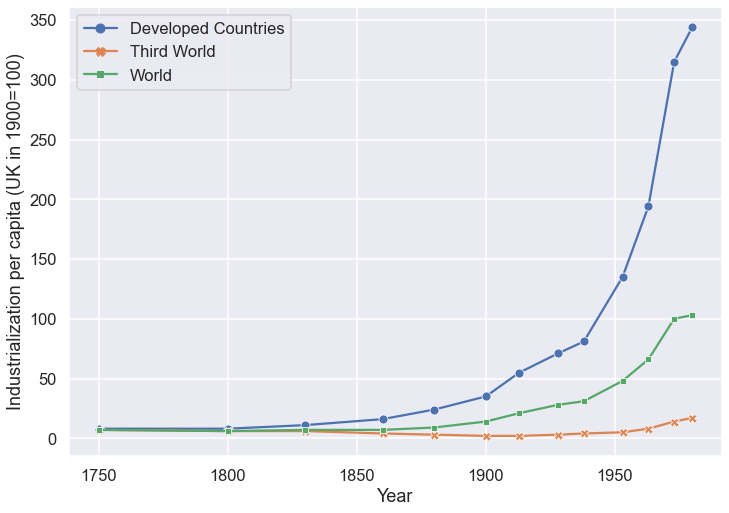

In [83]:
# Select some colors
mycolors = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
# Use seaborn to setup a color map to be used by matplotlib
my_cmap = mpl.colors.ListedColormap(sns.color_palette(mycolors).as_hex())
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='Industrialization', hue='Country',
             data=industrialization.loc[industrialization.Country.apply(lambda x: x in ['Developed Countries', 'Third World', 'World'])].reset_index(drop=True),
             alpha=1, style='Country', dashes=False, markers=True)
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.legend(title='')
ax.set_xlabel('Year')
ax.set_ylabel('Industrialization per capita (UK in 1900=100)')
plt.savefig(pathgraphs + 'Industrialization-Dev-NonDev.pdf', dpi=300, bbox_inches='tight')

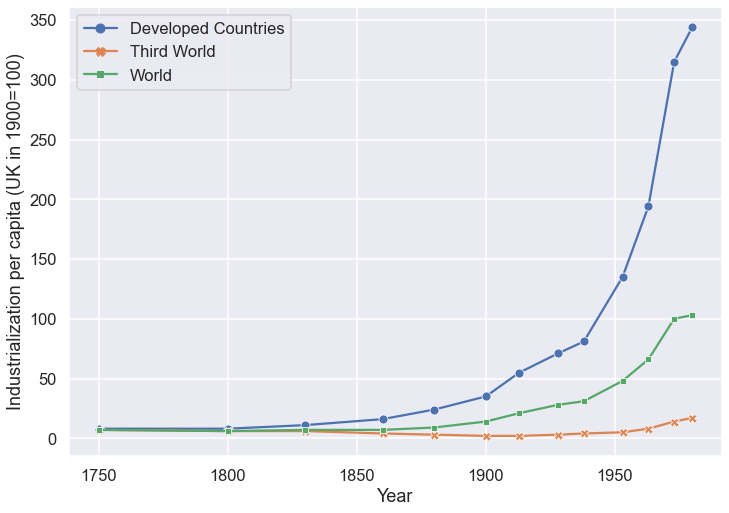

In [84]:
fig

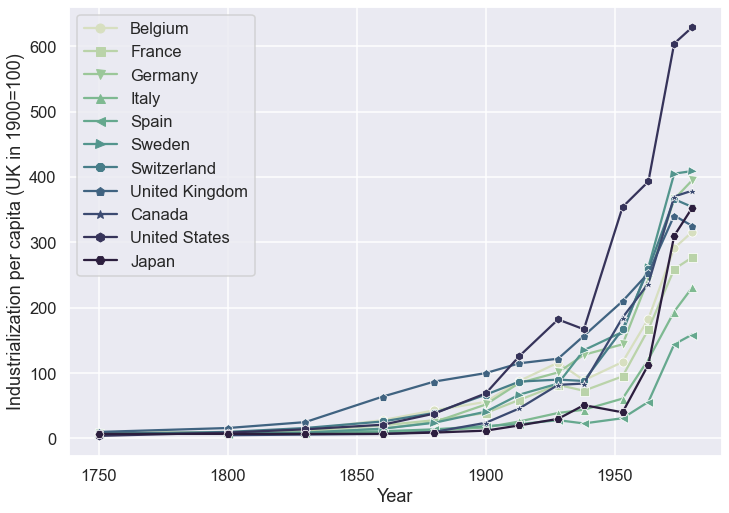

In [85]:
# Map country name to development level
dev_level = {'Belgium':'Developed',
             'France':'Developed',
             'Germany':'Developed',
             'Italy':'Developed',
             'Spain':'Developed',
             'Sweden':'Developed',
             'Switzerland':'Developed',
             'United Kingdom':'Developed',
             'Canada':'Developed',
             'United States':'Developed',
             'Japan':'Developed',
             'China':'Developing',
             'India':'Developing',
             'Brazil':'Developing',
             'Mexico':'Developing'}

industrialization['dev_level'] = industrialization.Country.map(dev_level)

filled_markers = ('o', 's', 'v', '^', '<', '>', '8', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X')

sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='Industrialization', hue='Country',
             data=industrialization.loc[industrialization.dev_level=='Developed'].reset_index(drop=True),
             alpha=1, style='Country', dashes=False, markers=filled_markers[:11],
             palette=sns.cubehelix_palette(11, start=.5, rot=-.75))
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.legend(title='')
ax.set_xlabel('Year')
ax.set_ylabel('Industrialization per capita (UK in 1900=100)')
plt.savefig(pathgraphs + 'Industrialization-Dev.pdf', dpi=300, bbox_inches='tight')

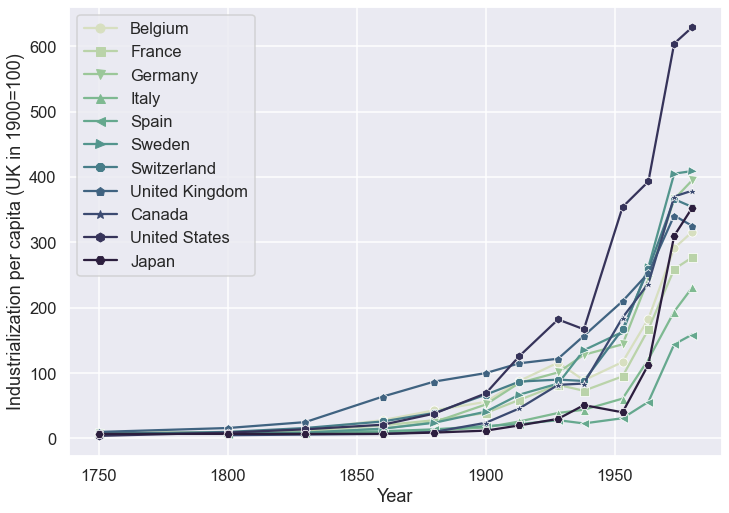

In [86]:
fig

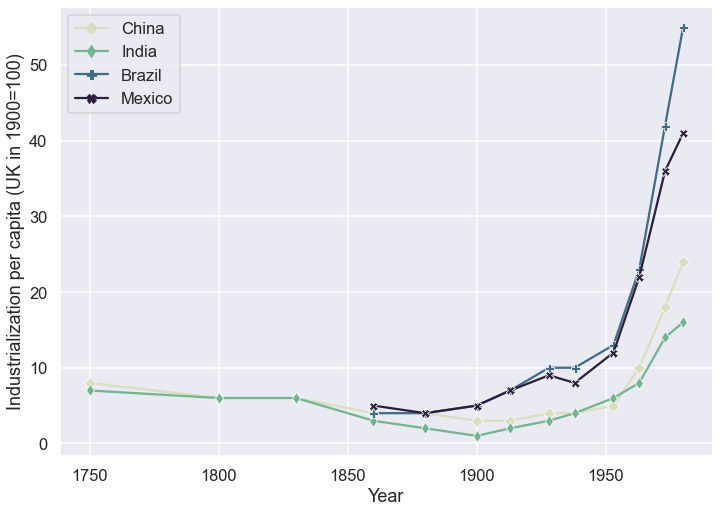

In [87]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='Industrialization', hue='Country',
             data=industrialization.loc[industrialization.dev_level=='Developing'].reset_index(drop=True),
             alpha=1, style='Country', dashes=False, markers=filled_markers[11:],
             palette=sns.cubehelix_palette(4, start=.5, rot=-.75))
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.legend(title='')
ax.set_xlabel('Year')
ax.set_ylabel('Industrialization per capita (UK in 1900=100)')
plt.savefig(pathgraphs + 'Industrialization-NonDev.pdf', dpi=300, bbox_inches='tight')

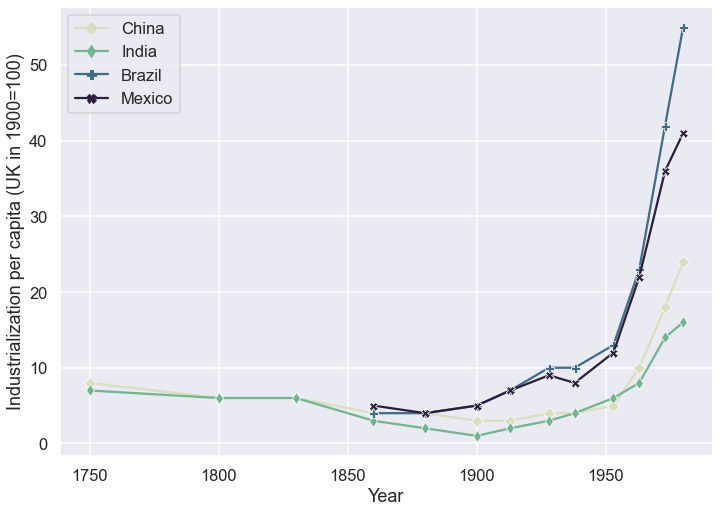

In [88]:
fig

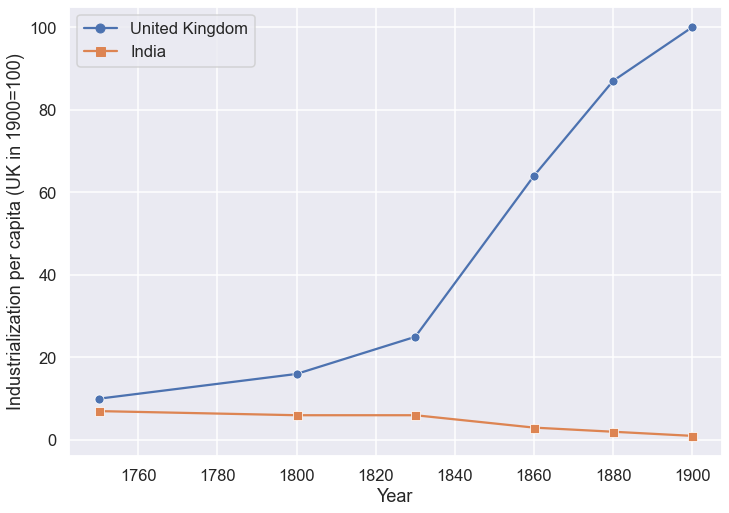

In [89]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='Industrialization', hue='Country',
             data=industrialization.loc[
                 (industrialization.Country.apply(lambda x: x in ['India', 'United Kingdom'])) & 
                 (industrialization.year<=1900)].reset_index(drop=True),
             alpha=1, style='Country', dashes=False, markers=filled_markers[:2],
             )
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.legend(title='')
ax.set_xlabel('Year')
ax.set_ylabel('Industrialization per capita (UK in 1900=100)')
plt.savefig(pathgraphs + 'Industrialization-UK-IND.pdf', dpi=300, bbox_inches='tight')

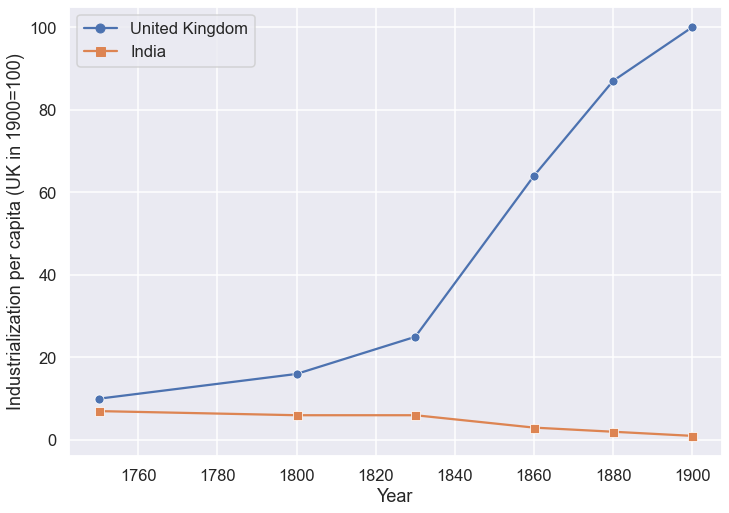

In [90]:
fig

## Manufacturing

Let's use data from the same source to explore what happened to the share of manufacturing across regions. 

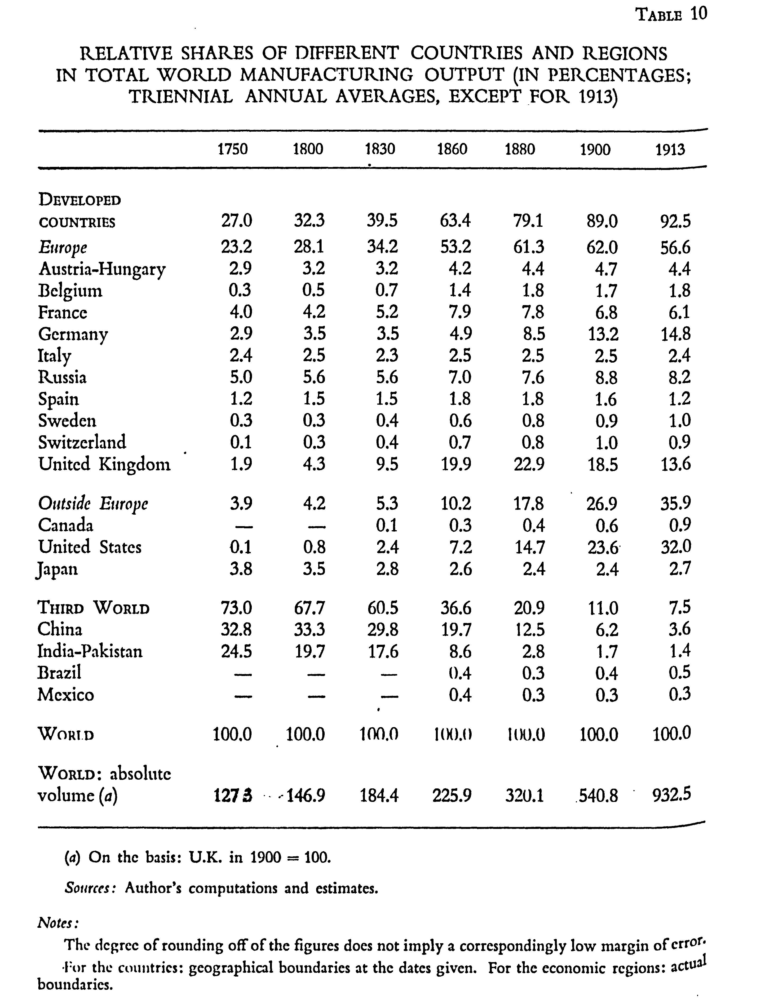

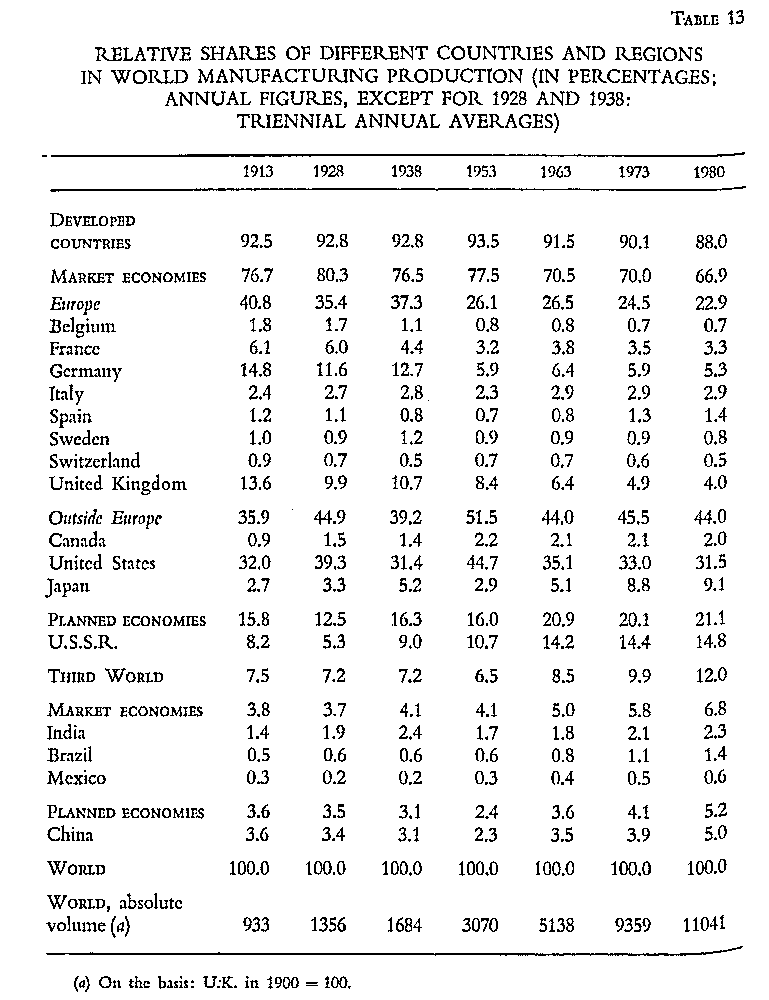

In [91]:
# 1750-1913
manufacturing = [['Developed Countries', 27.0, 32.3, 39.5, 63.4, 79.1, 89.0, 92.5],
                 ['Europe', 23.2, 28.1, 34.2, 53.2, 61.3, 62.0, 56.6],
                 ['Austria-Hungary', 2.9, 3.2, 3.2, 4.2, 4.4, 4.7, 4.4],
                 ['Belgium', 0.3, 0.5, 0.7, 1.4, 1.8, 1.7, 1.8],
                 ['France', 4.0, 4.2, 5.2, 7.9, 7.8, 6.8, 6.1],
                 ['Germany', 2.9, 3.5, 3.5, 4.9, 8.5, 13.2, 14.8],
                 ['Italy', 2.4, 2.5, 2.3, 2.5, 2.5, 2.5, 2.4],
                 ['Russia', 5.0, 5.6, 5.6, 7.0, 7.6, 8.8, 8.2],
                 ['Spain', 1.2, 1.5, 1.5, 1.8, 1.8, 1.6, 1.2],
                 ['Sweden', 0.3, 0.3, 0.4, 0.6, 0.8, 0.9, 1.0],
                 ['Switzerland', 0.1, 0.3, 0.4, 0.7, 0.8, 1.0, 0.9],
                 ['United Kingdom', 1.9, 4.3, 9.5, 19.9, 22.9, 18.5, 13.6],
                 ['Canada', np.nan, np.nan, 0.1, 0.3, 0.4, 0.6, 0.9],
                 ['United States', 0.1, 0.8, 2.4, 7.2, 14.7, 23.6, 32.0],
                 ['Japan', 3.8, 3.5, 2.8, 2.6, 2.4, 2.4, 2.7],
                 ['Third World', 73.0, 67.7, 60.5, 36.6, 20.9, 11.0, 7.5],
                 ['China', 32.8, 33.3, 29.8, 19.7, 12.5, 6.2, 3.6],
                 ['India', 24.5, 19.7, 17.6, 8.6, 2.8, 1.7, 1.4],
                 ['Brazil', np.nan, np.nan, np.nan, 0.4, 0.3, 0.4, 0.5],
                 ['Mexico', np.nan, np.nan, np.nan, 0.4, 0.3, 0.3, 0.3]]

years = [1750, 1800, 1830, 1860, 1880, 1900, 1913]
manufacturing = pd.DataFrame(manufacturing, columns=['Country'] + ['y'+str(y) for y in years])

# 1913-1980
manufacturing2 = [['Developed Countries', 92.5, 92.8, 92.8, 93.5, 91.5, 90.1, 88.0],
                  ['Market Economies', 76.7, 80.3, 76.5, 77.5, 70.5, 70.0, 66.9],
                  ['Europe', 40.8, 35.4, 37.3, 26.1, 26.5, 24.5, 22.9],
                  ['Belgium', 1.8, 1.7, 1.1, 0.8, 0.8, 0.7, 0.7],
                  ['France', 6.1, 6.0, 4.4, 3.2, 3.8, 3.5, 3.3],
                  ['Germany', 14.8, 11.6, 12.7, 5.9, 6.4, 5.9, 5.3],
                  ['Italy', 2.4, 2.7, 2.8, 2.3, 2.9, 2.9, 2.9],
                  ['Spain', 1.2, 1.1, 0.8, 0.7, 0.8, 1.3, 1.4],
                  ['Sweden', 1.0, 0.9, 1.2, 0.9, 0.9, 0.9, 0.8],
                  ['Switzerland', 0.9, 0.7, 0.5, 0.7, 0.7, 0.6, 0.5],
                  ['United Kingdom', 13.6, 9.9, 10.7, 8.4, 6.4, 4.9, 4.0],
                  ['Canada', 0.9, 1.5, 1.4, 2.2, 2.1, 2.1, 2.0],
                  ['United States', 32.0, 39.3, 31.4, 44.7, 35.1, 33.0, 31.5],
                  ['Japan', 2.7, 3.3, 5.2, 2.9, 5.1, 8.8, 9.1],
                  ['U.S.S.R.', 8.2, 5.3, 9.0, 10.7, 14.2, 14.4, 14.8],
                  ['Third World', 7.5, 7.2, 7.2, 6.5, 8.5, 9.9, 12.0],
                  ['India', 1.4, 1.9, 2.4, 1.7, 1.8, 2.1, 2.3],
                  ['Brazil', 0.5, 0.6, 0.6, 0.6, 0.8, 1.1, 1.4],
                  ['Mexico', 0.3, 0.2, 0.2, 0.3, 0.4, 0.5, 0.6],
                  ['China', 3.6, 3.4, 3.1, 2.3, 3.5, 3.9, 5.0]]
years = [1913, 1928, 1938, 1953, 1963, 1973, 1980]
manufacturing2 = pd.DataFrame(manufacturing2, columns=['Country'] + ['y'+str(y) for y in years])

# Merge
manufacturing = manufacturing.merge(manufacturing2)
manufacturing = pd.wide_to_long(manufacturing, ['y'], i='Country', j='year').reset_index()
manufacturing.rename(columns={'y':'manufacturing'}, inplace=True)
manufacturing['manufacturing'] = manufacturing.manufacturing / 100
manufacturing

,Country,year,manufacturing
0,Developed Countries,1750,0.270
1,Belgium,1750,0.003
2,France,1750,0.040
3,Germany,1750,0.029
4,Italy,1750,0.024
...,...,...,...
216,Third World,1980,0.120
217,China,1980,0.050
218,India,1980,0.023
219,Brazil,1980,0.014


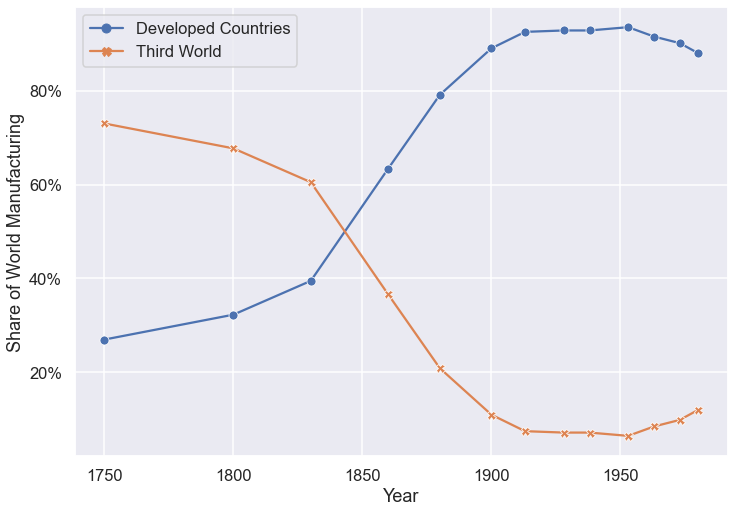

In [92]:
# Select some colors
mycolors = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
# Use seaborn to setup a color map to be used by matplotlib
my_cmap = mpl.colors.ListedColormap(sns.color_palette(mycolors).as_hex())
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='manufacturing', hue='Country',
             data=manufacturing.loc[manufacturing.Country.apply(lambda x: x in ['Developed Countries', 'Third World', 'World'])].reset_index(drop=True),
             alpha=1, style='Country', dashes=False, markers=True)
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0%}'))
ax.legend(title='')
ax.set_xlabel('Year')
ax.set_ylabel('Share of World Manufacturing')
plt.savefig(pathgraphs + 'Manufacturing-Dev-NonDev.pdf', dpi=300, bbox_inches='tight')


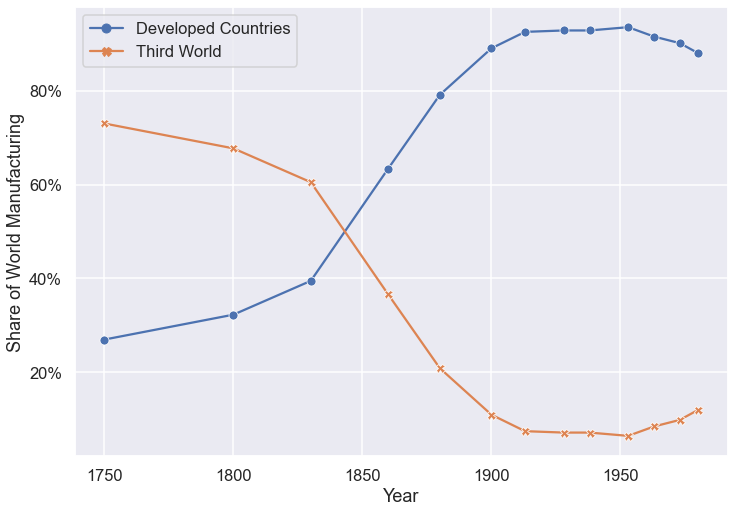

In [93]:
fig

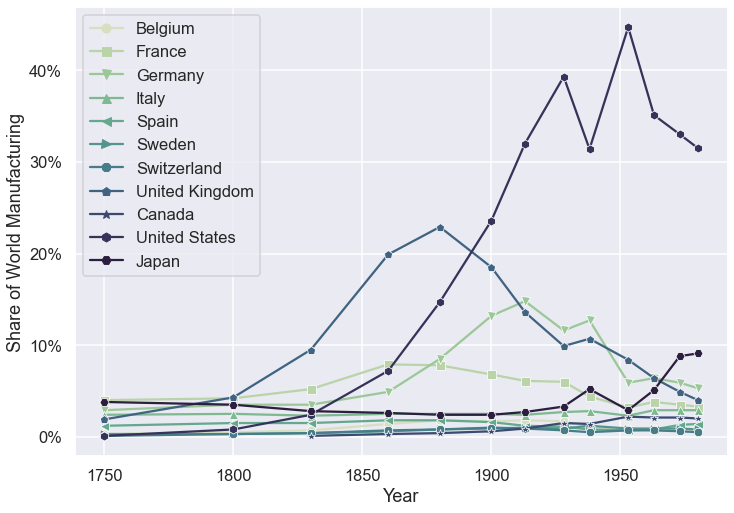

In [94]:
# Map country name to development level
dev_level = {'Belgium':'Developed',
             'France':'Developed',
             'Germany':'Developed',
             'Italy':'Developed',
             'Spain':'Developed',
             'Sweden':'Developed',
             'Switzerland':'Developed',
             'United Kingdom':'Developed',
             'Canada':'Developed',
             'United States':'Developed',
             'Japan':'Developed',
             'China':'Developing',
             'India':'Developing',
             'Brazil':'Developing',
             'Mexico':'Developing'}

manufacturing['dev_level'] = manufacturing.Country.map(dev_level)

filled_markers = ('o', 's', 'v', '^', '<', '>', '8', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X')

sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='manufacturing', hue='Country',
             data=manufacturing.loc[manufacturing.dev_level=='Developed'].reset_index(drop=True),
             alpha=1, style='Country', dashes=False, markers=filled_markers[:11],
             palette=sns.cubehelix_palette(11, start=.5, rot=-.75))
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0%}'))
ax.legend(title='')
ax.set_xlabel('Year')
ax.set_ylabel('Share of World Manufacturing')
plt.savefig(pathgraphs + 'Manufacturing-Dev.pdf', dpi=300, bbox_inches='tight')


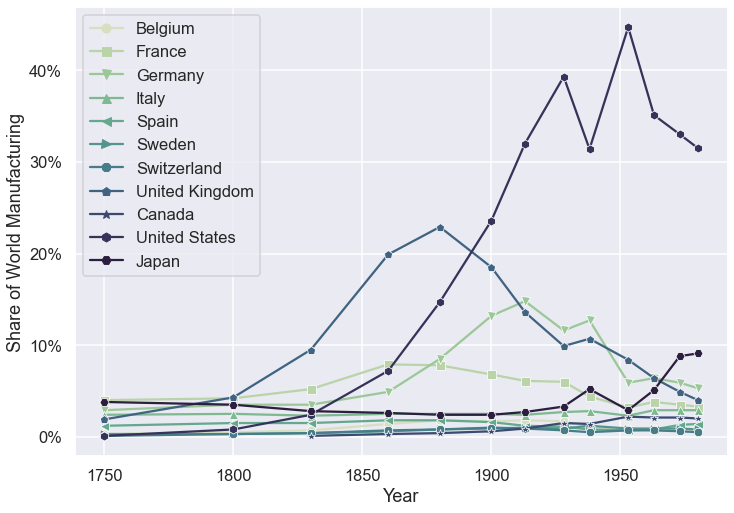

In [95]:
fig

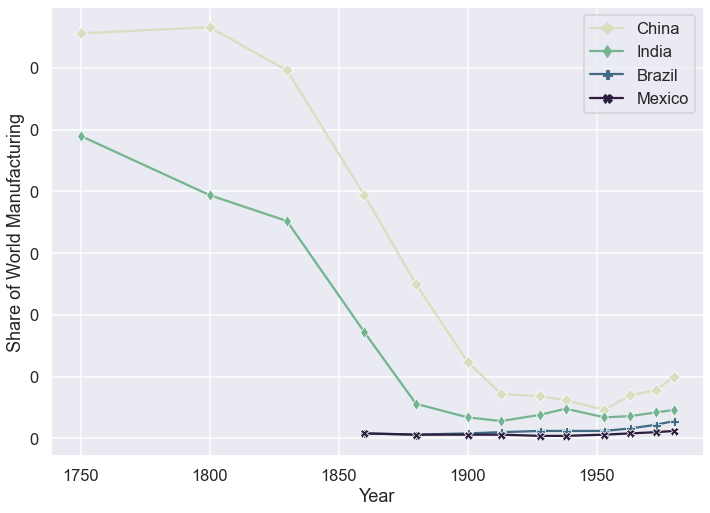

In [96]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='manufacturing', hue='Country',
             data=manufacturing.loc[manufacturing.dev_level=='Developing'].reset_index(drop=True),
             alpha=1, style='Country', dashes=False, markers=filled_markers[11:],
             palette=sns.cubehelix_palette(4, start=.5, rot=-.75))
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.legend(title='')
ax.set_xlabel('Year')
ax.set_ylabel('Share of World Manufacturing')
plt.savefig(pathgraphs + 'Manufacturing-NonDev.pdf', dpi=300, bbox_inches='tight')

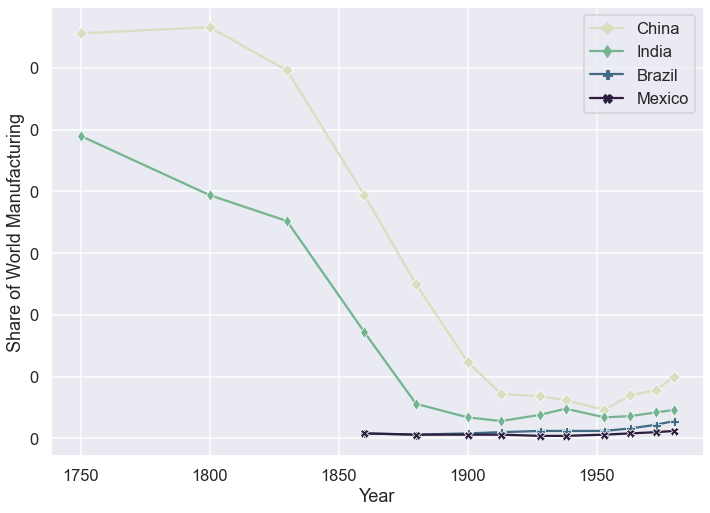

In [97]:
fig

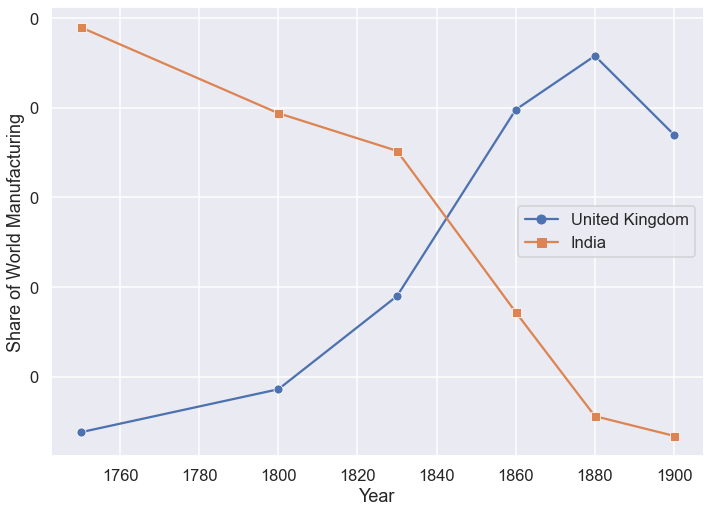

In [98]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='manufacturing', hue='Country',
             data=manufacturing.loc[
                 (manufacturing.Country.apply(lambda x: x in ['India', 'United Kingdom'])) & 
                 (manufacturing.year<=1900)].reset_index(drop=True),
             alpha=1, style='Country', dashes=False, markers=filled_markers[:2],
             )
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.legend(title='')
ax.set_xlabel('Year')
ax.set_ylabel('Share of World Manufacturing')
plt.savefig(pathgraphs + 'manufacturing-UK-IND.pdf', dpi=300, bbox_inches='tight')

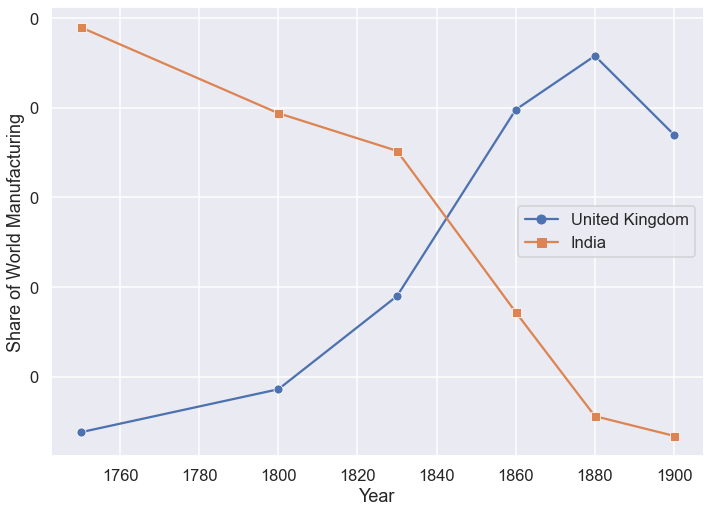

In [99]:
fig

## Industrial Potential

We can also explore the industrial potantial of these countries.

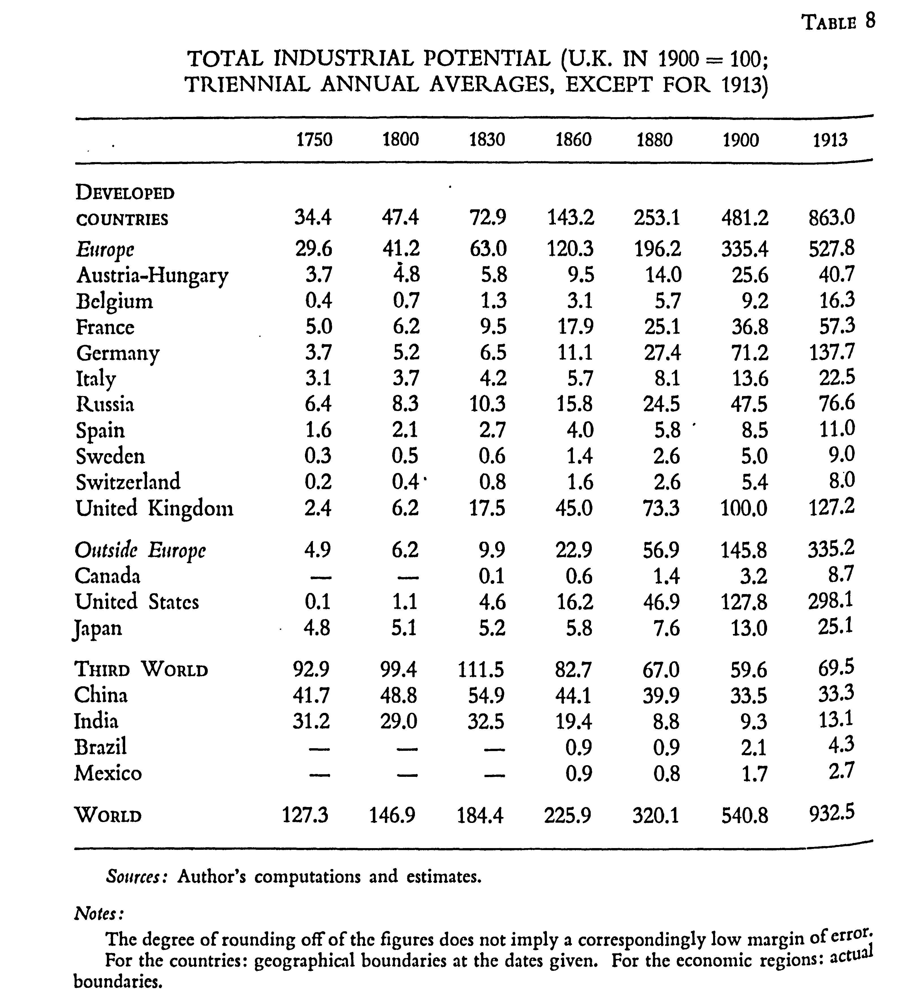

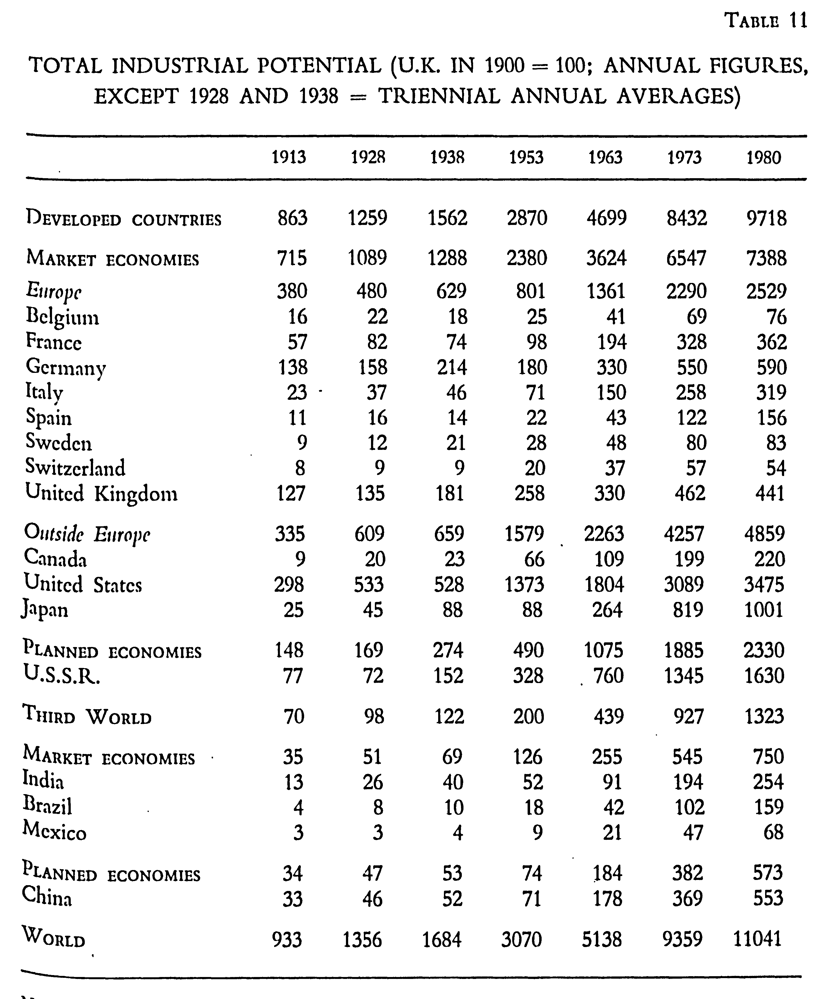

In [100]:
# 1750-1913
indpotential = [['Developed Countries', 34.4, 47.4, 72.9, 143.2, 253.1, 481.2, 863.0,],
                ['Europe', 29.6, 41.2, 63.0, 120.3, 196.2, 335.4, 527.8,],
                ['Austria-Hungary', 3.7, 4.8, 5.8, 9.5, 14.0, 25.6, 40.7,],
                ['Belgium', 0.4, 0.7, 1.3, 3.1, 5.7, 9.2, 16.3,],
                ['France', 5.0, 6.2, 9.5, 17.9, 25.1, 36.8, 57.3,],
                ['Germany', 3.7, 5.2, 6.5, 11.1, 27.4, 71.2, 137.7,],
                ['Italy', 3.1, 3.7, 4.2, 5.7, 8.1, 13.6, 22.5,],
                ['Russia', 6.4, 8.3, 10.3, 15.8, 24.5, 47.5, 76.6,],
                ['Spain', 1.6, 2.1, 2.7, 4.0, 5.8, 8.5, 11.0,],
                ['Sweden', 0.3, 0.5, 0.6, 1.4, 2.6, 5.0, 9.0,],
                ['Switzerland', 0.2, 0.4, 0.8, 1.6, 2.6, 5.4, 8.0,],
                ['United Kingdom', 2.4, 6.2, 17.5, 45.0, 73.3, 100.0, 127.2,],
                ['Canada', np.nan, np.nan, 0.1, 0.6, 1.4, 3.2, 8.7,],
                ['United States', 0.1, 1.1, 4.6, 16.2, 46.9, 127.8, 298.1,],
                ['Japan', 4.8, 5.1, 5.2, 5.8, 7.6, 13.0, 25.1,],
                ['Third World', 92.9, 99.4, 111.5, 82.7, 67.0, 59.6, 69.5,],
                ['China', 41.7, 48.8, 54.9, 44.1, 39.9, 33.5, 33.3,],
                ['India', 31.2, 29.0, 32.5, 19.4, 8.8, 9.3, 13.1,],
                ['Brazil', np.nan, np.nan, np.nan, 0.9, 0.9, 2.1, 4.3,],
                ['Mexico', np.nan, np.nan, np.nan, 0.9, 0.8, 1.7, 2.7,],
                ['World', 127.3, 146.9, 184.4, 225.9, 320.1, 540.8, 932.5,]]

years = [1750, 1800, 1830, 1860, 1880, 1900, 1913]
indpotential = pd.DataFrame(indpotential, columns=['Country'] + ['y'+str(y) for y in years])

# 1913-1980
indpotential2 = [['Developed Countries', 863, 1259, 1562, 2870, 4699, 8432, 9718],
                 ['Market Economies', 715, 1089, 1288, 2380, 3624, 6547, 7388],
                 ['Europe', 380, 480, 629, 801, 1361, 2290, 2529],
                 ['Belgium', 16, 22, 18, 25, 41, 69, 76],
                 ['France', 57, 82, 74, 98, 194, 328, 362],
                 ['Germany', 138, 158, 214, 180, 330, 550, 590],
                 ['Italy', 23, 37, 46, 71, 150, 258, 319],
                 ['Spain', 11, 16, 14, 22, 43, 122, 156],
                 ['Sweden', 9, 12, 21, 28, 48, 80, 83],
                 ['Switzerland', 8, 9, 9, 20, 37, 57, 54],
                 ['United Kingdom', 127, 135, 181, 258, 330, 462, 441],
                 ['Canada', 9, 20, 23, 66, 109, 199, 220],
                 ['United States', 298, 533, 528, 1373, 1804, 3089, 3475],
                 ['Japan', 25, 45, 88, 88, 264, 819, 1001],
                 ['U.S.S.R.', 77, 72, 152, 328, 760, 1345, 1630],
                 ['Third World', 70, 98, 122, 200, 439, 927, 1323],
                 ['India', 13, 26, 40, 52, 91, 194, 254],
                 ['Brazil', 4, 8, 10, 18, 42, 102, 159],
                 ['Mexico', 3, 3, 4, 9, 21, 47, 68],
                 ['China', 33, 46, 52, 71, 178, 369, 553],
                 ['World', 933, 1356, 1684, 3070, 5138, 9359, 11041]]

years = [1913, 1928, 1938, 1953, 1963, 1973, 1980]
indpotential2 = pd.DataFrame(indpotential2, columns=['Country'] + ['y'+str(y) for y in years])

# Merge
indpotential = indpotential.merge(indpotential2[indpotential2.columns.difference(['y1913'])])
indpotential = pd.wide_to_long(indpotential, ['y'], i='Country', j='year').reset_index()
indpotential.rename(columns={'y':'indpotential'}, inplace=True)
indpotential

,Country,year,indpotential
0,Developed Countries,1750,34.4
1,Europe,1750,29.6
2,Belgium,1750,0.4
3,France,1750,5.0
4,Germany,1750,3.7
...,...,...,...
242,China,1980,553.0
243,India,1980,254.0
244,Brazil,1980,159.0
245,Mexico,1980,68.0


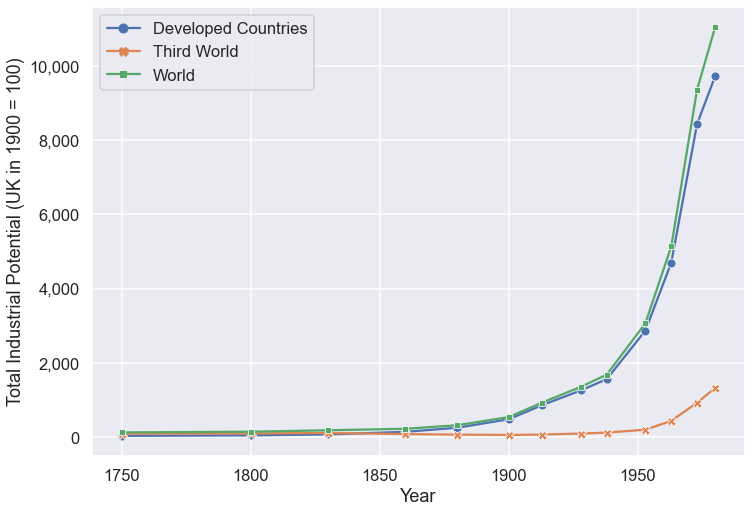

In [101]:
# Select some colors
mycolors = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
# Use seaborn to setup a color map to be used by matplotlib
my_cmap = mpl.colors.ListedColormap(sns.color_palette(mycolors).as_hex())
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='indpotential', hue='Country',
             data=indpotential.loc[indpotential.Country.apply(lambda x: x in ['Developed Countries', 'Third World', 'World'])].reset_index(drop=True),
             alpha=1, style='Country', dashes=False, markers=True)
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.legend(title='')
ax.set_xlabel('Year')
ax.set_ylabel('Total Industrial Potential (UK in 1900 = 100)')
plt.savefig(pathgraphs + 'indpotential-Dev-NonDev.pdf', dpi=300, bbox_inches='tight')

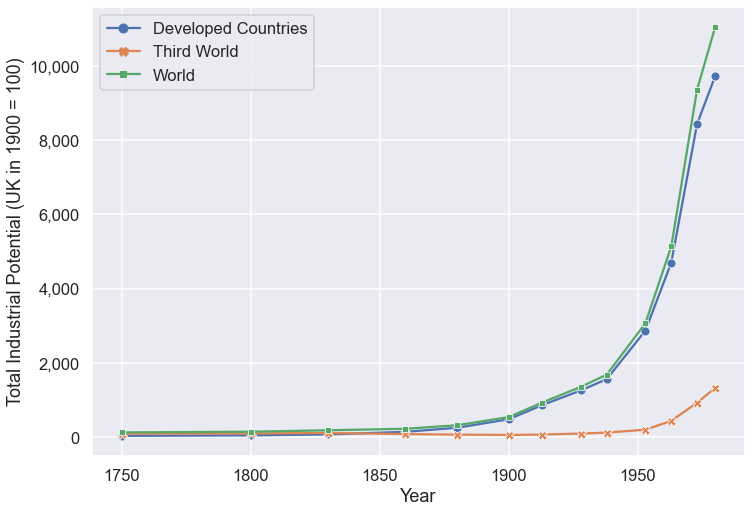

In [102]:
fig

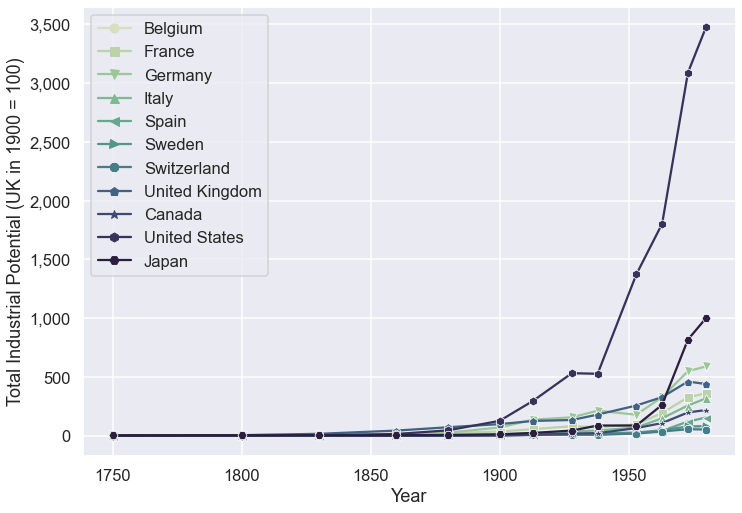

In [103]:
# Map country name to development level
dev_level = {'Belgium':'Developed',
             'France':'Developed',
             'Germany':'Developed',
             'Italy':'Developed',
             'Spain':'Developed',
             'Sweden':'Developed',
             'Switzerland':'Developed',
             'United Kingdom':'Developed',
             'Canada':'Developed',
             'United States':'Developed',
             'Japan':'Developed',
             'China':'Developing',
             'India':'Developing',
             'Brazil':'Developing',
             'Mexico':'Developing'}

indpotential['dev_level'] = indpotential.Country.map(dev_level)

filled_markers = ('o', 's', 'v', '^', '<', '>', '8', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X')

sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='indpotential', hue='Country',
             data=indpotential.loc[indpotential.dev_level=='Developed'].reset_index(drop=True),
             alpha=1, style='Country', dashes=False, markers=filled_markers[:11],
             palette=sns.cubehelix_palette(11, start=.5, rot=-.75))
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.legend(title='')
ax.set_xlabel('Year')
ax.set_ylabel('Total Industrial Potential (UK in 1900 = 100)')
plt.savefig(pathgraphs + 'indpotential-Dev.pdf', dpi=300, bbox_inches='tight')

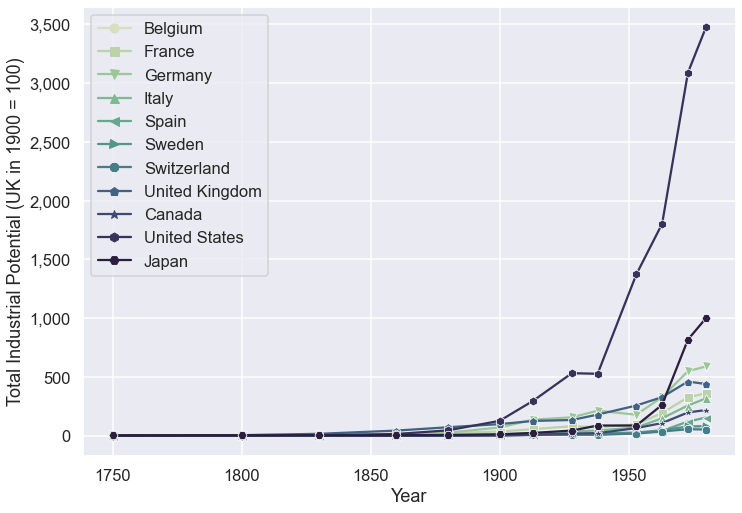

In [104]:
fig

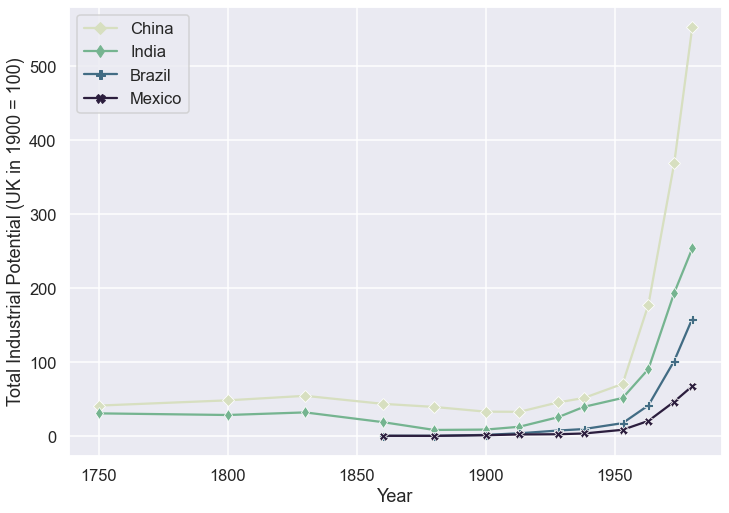

In [105]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='indpotential', hue='Country',
             data=indpotential.loc[indpotential.dev_level=='Developing'].reset_index(drop=True),
             alpha=1, style='Country', dashes=False, markers=filled_markers[11:],
             palette=sns.cubehelix_palette(4, start=.5, rot=-.75))
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.legend(title='')
ax.set_xlabel('Year')
ax.set_ylabel('Total Industrial Potential (UK in 1900 = 100)')
plt.savefig(pathgraphs + 'indpotential-NonDev.pdf', dpi=300, bbox_inches='tight')

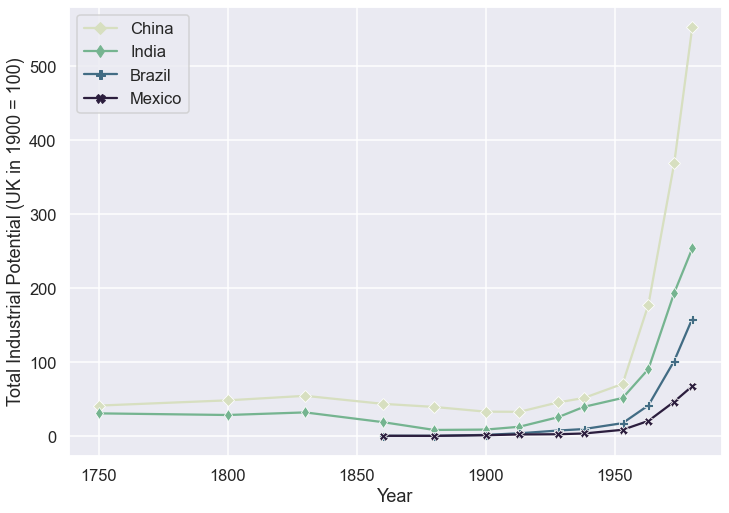

In [106]:
fig

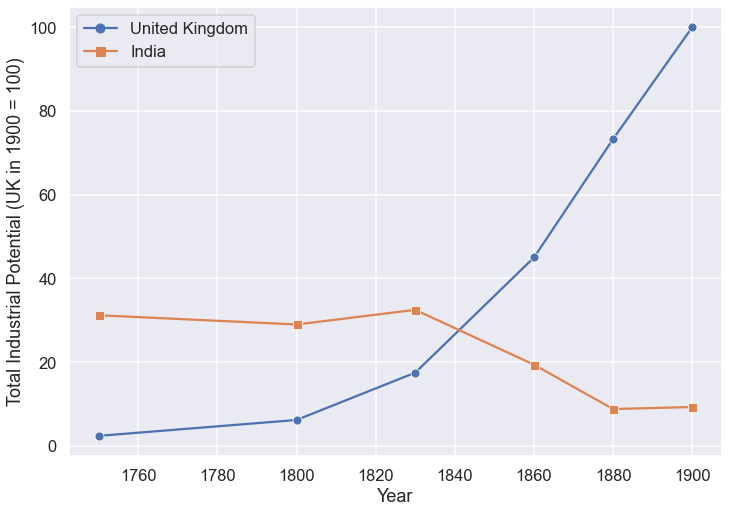

In [107]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='year', y='indpotential', hue='Country',
             data=indpotential.loc[
                 (indpotential.Country.apply(lambda x: x in ['India', 'United Kingdom'])) & 
                 (indpotential.year<=1900)].reset_index(drop=True),
             alpha=1, style='Country', dashes=False, markers=filled_markers[:2],
             )
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax.legend(title='')
ax.set_xlabel('Year')
ax.set_ylabel('Total Industrial Potential (UK in 1900 = 100)')
plt.savefig(pathgraphs + 'indpotential-UK-IND.pdf', dpi=300, bbox_inches='tight')

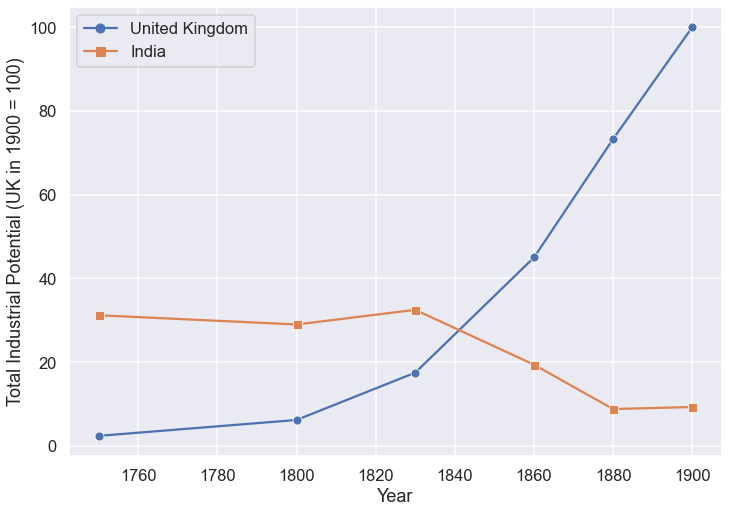

In [108]:
fig

# Persistence

Let's explore the persistence of economic development since 1950. To do so, let's get the Penn World Table and World Bank Data.

## Penn World Table

Let's start by importing the data from the Penn World Tables

In [109]:
try:
    pwt_xls = pd.read_excel(pathout + 'pwt100.xlsx',encoding='utf-8')
    pwt = pd.read_stata(pathout + 'pwt100.dta')    
except:
    pwt_xls = pd.read_excel('https://www.rug.nl/ggdc/docs/pwt100.xlsx',sheet_name=1)
    pwt = pd.read_stata('https://www.rug.nl/ggdc/docs/pwt100.dta')
    pwt_xls.to_excel(pathout + 'pwt100.xlsx', index=False, encoding='utf-8')
    pwt.to_stata(pathout + 'pwt100.dta', write_index=False, version=117)
    
# Get labels of variables
pwt_labels = pd.io.stata.StataReader(pathout + 'pwt100.dta').variable_labels()

The excel file let's us know the defintion of the variables, while the Stata file has the data (of course the excel file also has the data). For some reason the original Stata file does not seem to have labels!

In [110]:
pwt_labels

{'countrycode': '',
 'country': '',
 'currency_unit': '',
 'year': '',
 'rgdpe': '',
 'rgdpo': '',
 'pop': '',
 'emp': '',
 'avh': '',
 'hc': '',
 'ccon': '',
 'cda': '',
 'cgdpe': '',
 'cgdpo': '',
 'cn': '',
 'ck': '',
 'ctfp': '',
 'cwtfp': '',
 'rgdpna': '',
 'rconna': '',
 'rdana': '',
 'rnna': '',
 'rkna': '',
 'rtfpna': '',
 'rwtfpna': '',
 'labsh': '',
 'irr': '',
 'delta': '',
 'xr': '',
 'pl_con': '',
 'pl_da': '',
 'pl_gdpo': '',
 'i_cig': '',
 'i_xm': '',
 'i_xr': '',
 'i_outlier': '',
 'i_irr': '',
 'cor_exp': '',
 'statcap': '',
 'csh_c': '',
 'csh_i': '',
 'csh_g': '',
 'csh_x': '',
 'csh_m': '',
 'csh_r': '',
 'pl_c': '',
 'pl_i': '',
 'pl_g': '',
 'pl_x': '',
 'pl_m': '',
 'pl_n': '',
 'pl_k': ''}

In [111]:
pwt_xls

,Variable name,Variable definition
0,Identifier variables,NaN
1,countrycode,3-letter ISO country code
2,country,Country name
3,currency_unit,Currency unit
4,year,Year
...,...,...
62,pl_g,"Price level of government consumption, price ..."
63,pl_x,"Price level of exports, price level of USA GDP..."
64,pl_m,"Price level of imports, price level of USA GDP..."
65,pl_n,"Price level of the capital stock, price level ..."


In [112]:
pwt

,countrycode,country,currency_unit,year,rgdpe,rgdpo,pop,emp,avh,hc,...,csh_x,csh_m,csh_r,pl_c,pl_i,pl_g,pl_x,pl_m,pl_n,pl_k
0,ABW,Aruba,Aruban Guilder,1950,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ABW,Aruba,Aruban Guilder,1951,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ABW,Aruba,Aruban Guilder,1952,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ABW,Aruba,Aruban Guilder,1953,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ABW,Aruba,Aruban Guilder,1954,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12805,ZWE,Zimbabwe,US Dollar,2015,40141.617188,39798.644531,13.814629,6.393752,NaN,2.584653,...,0.140172,-0.287693,-0.051930,0.479228,0.651287,0.541446,0.616689,0.533235,0.422764,1.533909
12806,ZWE,Zimbabwe,US Dollar,2016,41875.203125,40963.191406,14.030331,6.504374,NaN,2.616257,...,0.131920,-0.251232,-0.016258,0.470640,0.651027,0.539631,0.619789,0.519718,0.416510,1.491724
12807,ZWE,Zimbabwe,US Dollar,2017,44672.175781,44316.742188,14.236595,6.611773,NaN,2.648248,...,0.126722,-0.202827,-0.039897,0.473560,0.639560,0.519956,0.619739,0.552042,0.415592,1.514525
12808,ZWE,Zimbabwe,US Dollar,2018,44325.109375,43420.898438,14.438802,6.714952,NaN,2.680630,...,0.144485,-0.263658,-0.020791,0.543757,0.655473,0.529867,0.641361,0.561526,0.425143,1.590120


In [113]:
# Describe the data
pwt.describe()

,year,rgdpe,rgdpo,pop,emp,avh,hc,ccon,cda,cgdpe,...,csh_x,csh_m,csh_r,pl_c,pl_i,pl_g,pl_x,pl_m,pl_n,pl_k
count,12810.000000,1.039900e+04,1.039900e+04,10399.000000,9529.000000,3492.000000,8637.000000,1.039900e+04,1.039900e+04,1.039900e+04,...,10399.000000,10399.000000,10399.000000,10399.000000,10399.000000,10399.000000,10399.000000,10399.000000,10314.000000,7095.000000
mean,1984.500000,3.048523e+05,3.070802e+05,30.962982,14.171166,1986.923200,2.087200,2.249465e+05,3.049463e+05,3.061396e+05,...,0.229317,-0.300829,0.017791,0.370850,0.423964,0.345635,0.409820,0.403422,0.359145,1.334313
std,20.205986,1.214332e+06,1.218457e+06,116.189454,58.056976,284.003338,0.727413,8.882342e+05,1.236096e+06,1.226056e+06,...,0.266793,0.640212,0.216200,0.424091,0.635708,0.408015,0.196283,0.202566,0.435645,1.941830
min,1950.000000,2.036377e+01,2.765232e+01,0.004425,0.001200,1380.607643,1.007038,1.604856e+01,2.176663e+01,2.026185e+01,...,-1.937363,-23.237627,-12.568965,0.015589,0.006002,0.009270,0.007354,0.020806,0.012977,0.064379
25%,1967.000000,6.801782e+03,7.191773e+03,1.579663,0.775101,1788.478805,1.450483,5.892980e+03,7.194495e+03,6.689781e+03,...,0.067027,-0.379584,-0.025204,0.171226,0.191958,0.116110,0.237652,0.240777,0.164562,0.650612
50%,1984.500000,3.031913e+04,3.084435e+04,6.150688,2.856044,1972.355973,1.987572,2.465417e+04,3.134864e+04,3.031841e+04,...,0.140116,-0.200254,0.000326,0.306258,0.377943,0.244554,0.443856,0.452949,0.295903,0.955435
75%,2002.000000,1.559740e+05,1.587386e+05,19.934229,8.266107,2168.035042,2.674011,1.133967e+05,1.532297e+05,1.559242e+05,...,0.300332,-0.102694,0.044529,0.484549,0.557087,0.452951,0.557034,0.541063,0.447797,1.415420
max,2019.000000,2.086051e+07,2.059584e+07,1433.783686,799.306641,3039.794005,4.351568,1.682624e+07,2.138355e+07,2.079136e+07,...,3.523480,32.874020,7.598285,23.122841,34.444988,18.420809,2.056070,4.990355,20.649197,31.932846


## Computing $\log$ GDP per capita

Now, we can create new variables, transform and plot the data

To compute the $log$ of income per capita (GDPpc), the first thing we need is to know the name of the column that contains the GDPpc data in the dataframe. To do this, let's find among the variables those whic in their description have the word *capita*.

In [114]:
pwt_xls.columns

Index(['Variable name', 'Variable definition'], dtype='object')

To be able to read the definitions better, let's tell ``pandas`` to show us more content.

In [115]:
pd.set_option("display.max_columns", 20)
pd.set_option('display.max_rows', 50)
pd.set_option('display.width', 1000)
#pd.set_option('display.max_colwidth', -1)

In [116]:
pwt_xls.loc[pwt_xls['Variable definition'].apply(lambda x: str(x).lower().find('capita')!=-1)]

,Variable name,Variable definition
12,hc,"Human capital index, based on years of schooli..."
19,cn,Capital stock at current PPPs (in mil. 2017US$)
20,ck,Capital services levels at current PPPs (USA=1)
28,rnna,Capital stock at constant 2017 national prices...
29,rkna,Capital services at constant 2017 national pri...
34,delta,Average depreciation rate of the capital stock
47,i_irr,0/1/2/3: the observation for irr is not an out...
53,csh_i,Share of gross capital formation at current PPPs
61,pl_i,"Price level of capital formation, price level..."
65,pl_n,"Price level of the capital stock, price level ..."


So, it seems the data does not contain that variable. But do not panic...we know how to compute it based on *GDP* and *Population*. Let's do it!

### Identify the name of the variable for GDP

In [117]:
pwt_xls.loc[pwt_xls['Variable definition'].apply(lambda x: str(x).upper().find('GDP')!=-1)]

,Variable name,Variable definition
7,rgdpe,Expenditure-side real GDP at chained PPPs (in ...
8,rgdpo,Output-side real GDP at chained PPPs (in mil. ...
17,cgdpe,Expenditure-side real GDP at current PPPs (in ...
18,cgdpo,Output-side real GDP at current PPPs (in mil. ...
25,rgdpna,Real GDP at constant 2017 national prices (in ...
32,labsh,Share of labour compensation in GDP at current...
38,pl_con,"Price level of CCON (PPP/XR), price level of U..."
39,pl_da,"Price level of CDA (PPP/XR), price level of US..."
40,pl_gdpo,"Price level of CGDPo (PPP/XR), price level of ..."
46,i_outlier,0/1: the observation on pl_gdpe or pl_gdpo is ...


### Identify the name of the variable for population

In [118]:
pwt_xls.loc[pwt_xls['Variable definition'].apply(lambda x: str(x).lower().find('population')!=-1)]

,Variable name,Variable definition
9,pop,Population (in millions)


### Create a new variables/columns with real GDPpc for all the measures included in PWT

In [119]:
# Get columns with GDP measures
gdpcols = pwt_xls.loc[pwt_xls['Variable definition'].apply(lambda x: str(x).upper().find('REAL GDP')!=-1), 'Variable name'].tolist()

# Generate GDPpc for each measure
for gdp in gdpcols:
    pwt[gdp + '_pc'] = pwt[gdp] / pwt['pop']

# GDPpc data
gdppccols = [col+'_pc' for col in gdpcols]
pwt[['countrycode', 'country', 'year'] + gdppccols]

,countrycode,country,year,rgdpe_pc,rgdpo_pc,cgdpe_pc,cgdpo_pc,rgdpna_pc
0,ABW,Aruba,1950,NaN,NaN,NaN,NaN,NaN
1,ABW,Aruba,1951,NaN,NaN,NaN,NaN,NaN
2,ABW,Aruba,1952,NaN,NaN,NaN,NaN,NaN
3,ABW,Aruba,1953,NaN,NaN,NaN,NaN,NaN
4,ABW,Aruba,1954,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
12805,ZWE,Zimbabwe,2015,2905.732553,2880.905780,2892.674328,2856.095690,3040.848887
12806,ZWE,Zimbabwe,2016,2984.619759,2919.616893,2970.770578,2912.558803,3016.730437
12807,ZWE,Zimbabwe,2017,3137.841301,3112.875107,3137.841301,3112.875107,3112.875107
12808,ZWE,Zimbabwe,2018,3069.860600,3007.236919,3071.061791,3017.391036,3217.517468


Now let's use the ``apply`` function to compute logs.

In [120]:
pwt[['l'+col for col in gdppccols]] = pwt[gdppccols].apply(np.log, axis=1)
pwt[['countrycode', 'country', 'year'] + ['l'+col for col in gdppccols]]

,countrycode,country,year,lrgdpe_pc,lrgdpo_pc,lcgdpe_pc,lcgdpo_pc,lrgdpna_pc
0,ABW,Aruba,1950,NaN,NaN,NaN,NaN,NaN
1,ABW,Aruba,1951,NaN,NaN,NaN,NaN,NaN
2,ABW,Aruba,1952,NaN,NaN,NaN,NaN,NaN
3,ABW,Aruba,1953,NaN,NaN,NaN,NaN,NaN
4,ABW,Aruba,1954,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
12805,ZWE,Zimbabwe,2015,7.974441,7.965860,7.969937,7.957211,8.019892
12806,ZWE,Zimbabwe,2016,8.001228,7.979208,7.996577,7.976787,8.011929
12807,ZWE,Zimbabwe,2017,8.051290,8.043302,8.051290,8.043302,8.043302
12808,ZWE,Zimbabwe,2018,8.029387,8.008777,8.029779,8.012148,8.076365


How correlated are these measures of log GDP per capita?

In [121]:
pwt[['countrycode', 'country', 'year'] + ['l'+col for col in gdppccols]].groupby('year').corr()

lrgdpe_pc  lrgdpo_pc  lcgdpe_pc  lcgdpo_pc  lrgdpna_pc
year                                                                   
1950 lrgdpe_pc    1.000000   0.995984   0.999441   0.995318    0.818344
     lrgdpo_pc    0.995984   1.000000   0.996080   0.999158    0.823961
     lcgdpe_pc    0.999441   0.996080   1.000000   0.996412    0.821171
     lcgdpo_pc    0.995318   0.999158   0.996412   1.000000    0.828410
     lrgdpna_pc   0.818344   0.823961   0.821171   0.828410    1.000000
...                    ...        ...        ...        ...         ...
2019 lrgdpe_pc    1.000000   0.996471   0.999999   0.996911    0.994584
     lrgdpo_pc    0.996471   1.000000   0.996466   0.999960    0.997909
     lcgdpe_pc    0.999999   0.996466   1.000000   0.996909    0.994581
     lcgdpo_pc    0.996911   0.999960   0.996909   1.000000    0.997914
     lrgdpna_pc   0.994584   0.997909   0.994581   0.997914    1.000000

[350 rows x 5 columns]

While it seems they are highly correlated, it is hard to see here directly. Let's get the statistics for each measures correlations across all years.

In [122]:
pwt[['countrycode', 'country', 'year'] + ['l'+col for col in gdppccols]].groupby('year').corr().describe()

,lrgdpe_pc,lrgdpo_pc,lcgdpe_pc,lcgdpo_pc,lrgdpna_pc
count,350.000000,350.000000,350.000000,350.000000,350.000000
mean,0.980488,0.976436,0.980427,0.979111,0.935778
std,0.036614,0.037566,0.036591,0.036655,0.052340
min,0.818344,0.822508,0.821171,0.825543,0.818344
25%,0.982882,0.975386,0.982467,0.978188,0.907210
50%,0.996006,0.991856,0.996237,0.995459,0.930806
75%,0.999751,0.999158,0.999751,0.999158,0.987301
max,1.000000,1.000000,1.000000,1.000000,1.000000


Ok. This gives us a better sense of how strongly correlated these measures of log GDP per capita are. In what follows we will use only one, namely Log[GDPpc] based on Expenditure-side real GDP at chained PPPs (in mil. 2011US$), i.e., ``lrgdpe_pc``.

## Convergence post-1960?

Let's start by looking at the distribution of Log[GDPpc] in 1960. For these we need to subset our dataframe and select only the rows for the year 1960. This is don with the ``loc`` property of the dataframe.

In [123]:
gdppc1960 = pwt.loc[pwt.year==1960, ['countrycode', 'country', 'year', 'lrgdpe_pc']]
gdppc1960

,countrycode,country,year,lrgdpe_pc
10,ABW,Aruba,1960,NaN
80,AGO,Angola,1960,NaN
150,AIA,Anguilla,1960,NaN
220,ALB,Albania,1960,NaN
290,ARE,United Arab Emirates,1960,NaN
...,...,...,...,...
12470,VNM,Viet Nam,1960,NaN
12540,YEM,Yemen,1960,NaN
12610,ZAF,South Africa,1960,8.783560
12680,ZMB,Zambia,1960,7.958144


``gdppc1960`` has the data for all countries in th eyear 1960. We can plot the histogram using the functions of the dataframe.

<AxesSubplot:>

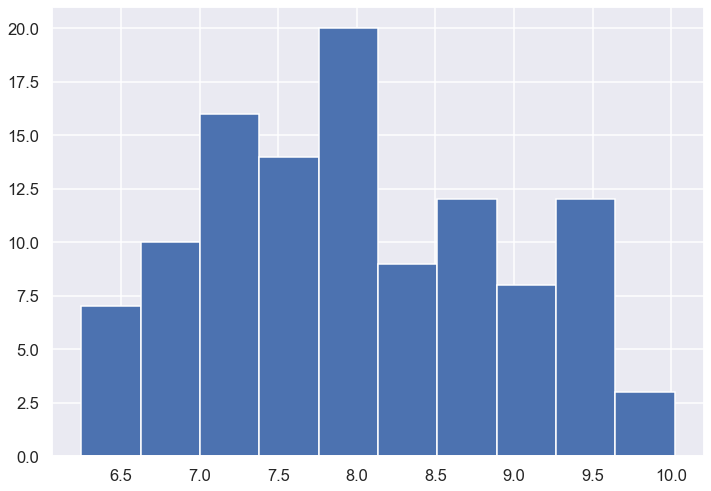

In [124]:
gdppc1960.lrgdpe_pc.hist()

We can also plot it using the ``seaborn`` package. Let's plot the kernel density of the distribution

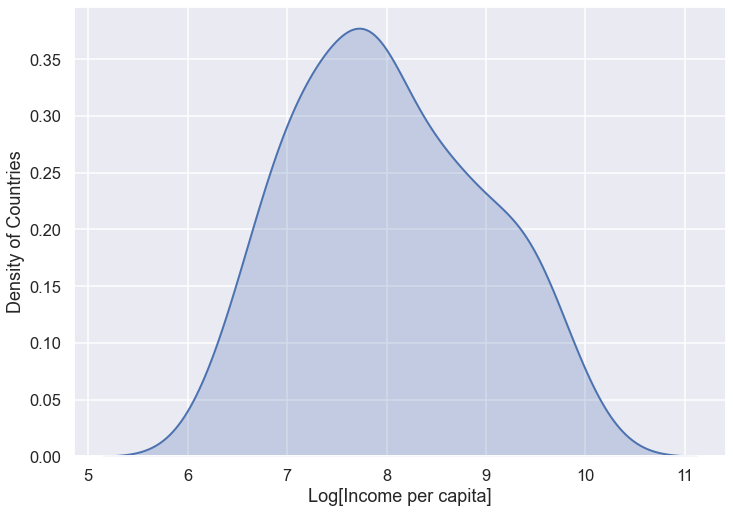

In [125]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.kdeplot(gdppc1960.lrgdpe_pc, ax=ax, shade=True, label='1960', linewidth=2)
ax.set_xlabel('Log[Income per capita]')
ax.set_ylabel('Density of Countries')
plt.savefig(pathgraphs + 'y1960-density.pdf', dpi=300, bbox_inches='tight')

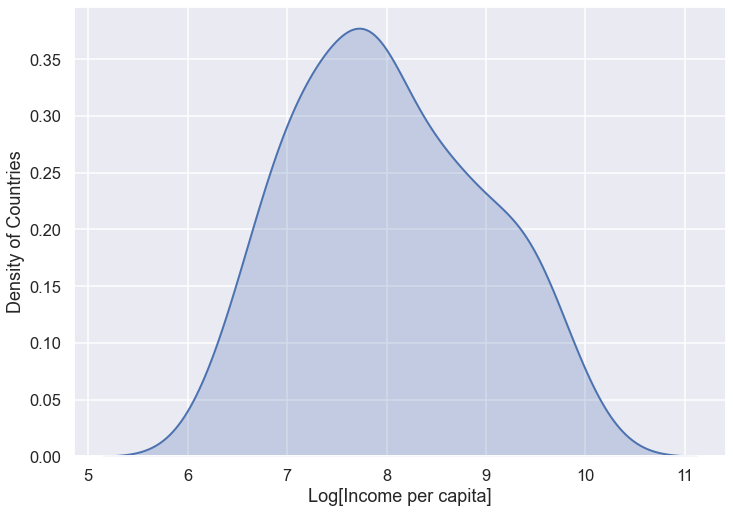

In [126]:
fig

Let's now also include the distribution for other years

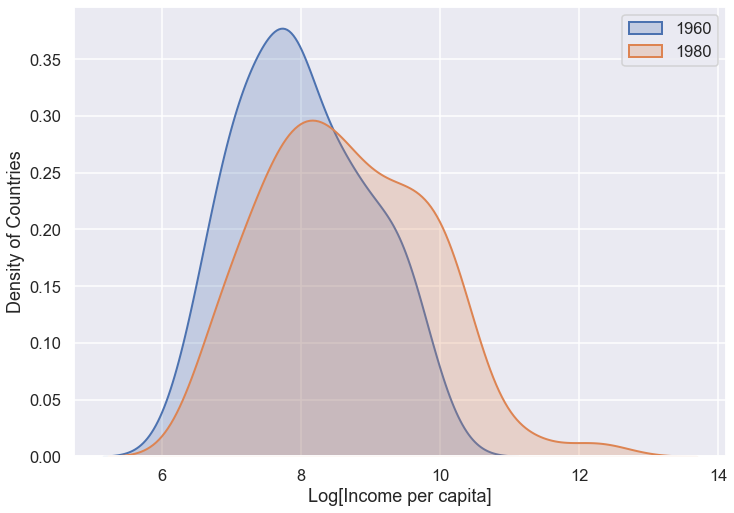

In [137]:
gdppc1980 = pwt.loc[pwt.year==1980, ['countrycode', 'country', 'year', 'lrgdpe_pc']]
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.kdeplot(gdppc1960.lrgdpe_pc, ax=ax, shade=True, label='1960', linewidth=2)
sns.kdeplot(gdppc1980.lrgdpe_pc, ax=ax, shade=True, label='1980', linewidth=2)
ax.set_xlabel('Log[Income per capita]')
ax.set_ylabel('Density of Countries')
ax.legend()
plt.savefig(pathgraphs + 'y1960-1980-density.pdf', dpi=300, bbox_inches='tight')

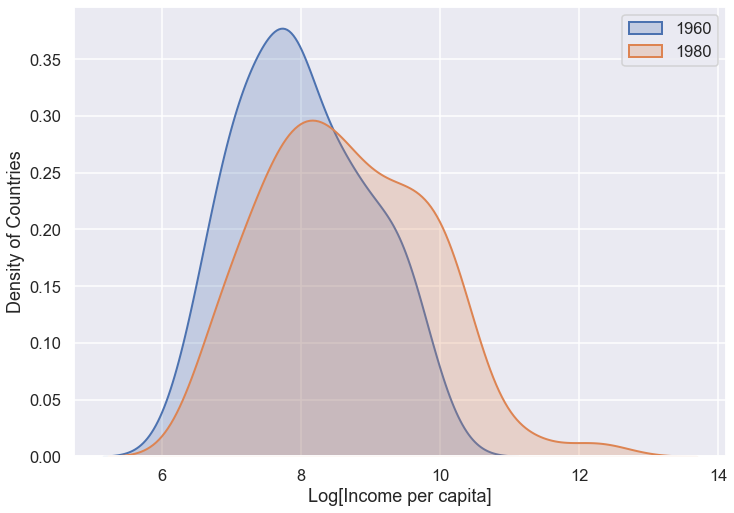

In [138]:
fig

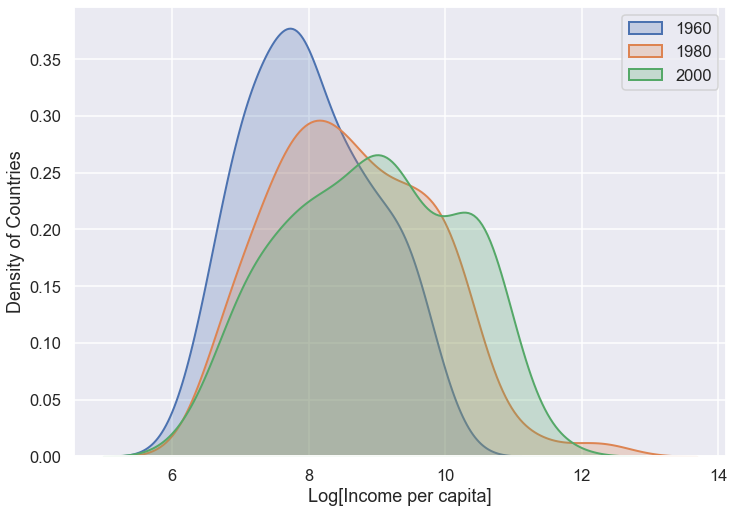

In [139]:
gdppc2000 = pwt.loc[pwt.year==2000, ['countrycode', 'country', 'year', 'lrgdpe_pc']]
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.kdeplot(gdppc1960.lrgdpe_pc, ax=ax, shade=True, label='1960', linewidth=2)
sns.kdeplot(gdppc1980.lrgdpe_pc, ax=ax, shade=True, label='1980', linewidth=2)
sns.kdeplot(gdppc2000.lrgdpe_pc, ax=ax, shade=True, label='2000', linewidth=2)
ax.set_xlabel('Log[Income per capita]')
ax.set_ylabel('Density of Countries')
ax.legend()
plt.savefig(pathgraphs + 'y1960-2000-density.pdf', dpi=300, bbox_inches='tight')

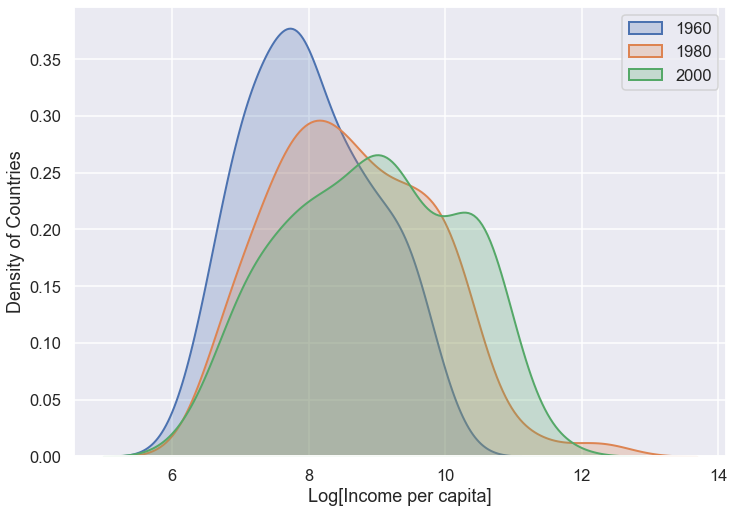

In [140]:
fig

Let's show the evolution of the distribution by looking at it every 10 years starting from 1950 onwards. Moreover, let's do everything in a unique piece of code.

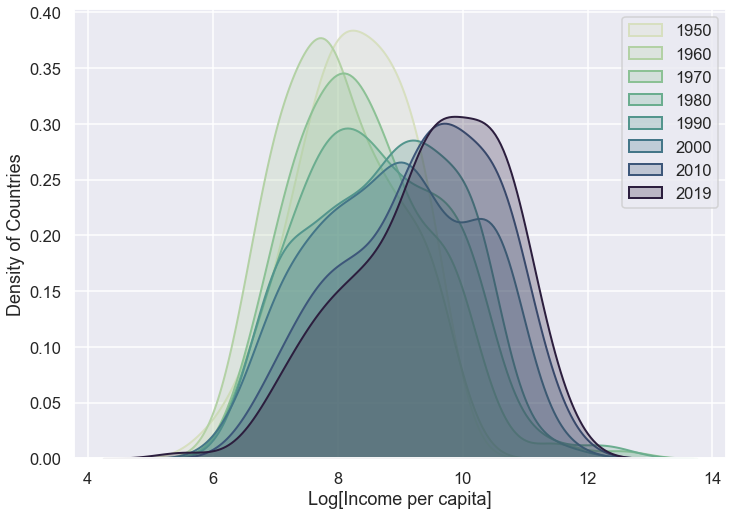

In [141]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_context("talk")
period = list(range(1950, 2025, 10)) + [pwt.year.max()]
#mycolors = sns.color_palette("GnBu", n_colors=len(period)+5)
mycolors = sns.cubehelix_palette(len(period), start=.5, rot=-.75)
# Plot
fig, ax = plt.subplots()
k = 0
for t in period:
    sns.kdeplot(pwt.loc[pwt.year==t].lrgdpe_pc, ax=ax, shade=True, label=str(t), linewidth=2, color=mycolors[k])
    k += 1
ax.set_xlabel('Log[Income per capita]')
ax.set_ylabel('Density of Countries')
ax.legend()
plt.savefig(pathgraphs + 'y1950-2010-density.pdf', dpi=300, bbox_inches='tight')

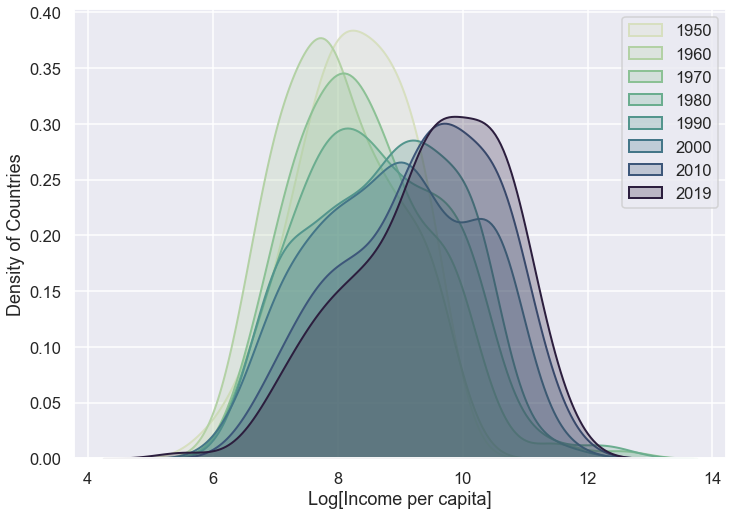

In [142]:
fig

# Persistence

The lack of convergence in the last 60 years suggest that there is some persistence in (recent) development. Let's explore this by plotting the association between past GDP per capita across different periods. In order to make  things more comparable, let's normalize looking at income levels relative to the US. To do so, it's better to use the year as the index of the dataframe.

In [143]:
pwt.set_index('year', inplace=True)
pwt['lrgdpe_pc_US'] = pwt.loc[pwt.countrycode=='USA', 'lrgdpe_pc']
pwt['lrgdpe_pc_rel'] = pwt.lrgdpe_pc / pwt.lrgdpe_pc_US
pwt.reset_index(inplace=True)
pwt[['countrycode', 'country', 'year', 'lrgdpe_pc_rel']]

,countrycode,country,year,lrgdpe_pc_rel
0,ABW,Aruba,1950,NaN
1,ABW,Aruba,1951,NaN
2,ABW,Aruba,1952,NaN
3,ABW,Aruba,1953,NaN
4,ABW,Aruba,1954,NaN
...,...,...,...,...
12805,ZWE,Zimbabwe,2015,0.726013
12806,ZWE,Zimbabwe,2016,0.727573
12807,ZWE,Zimbabwe,2017,0.730951
12808,ZWE,Zimbabwe,2018,0.727346


Let's plot the relative income levels in 1960 to 1980, 2000 and 2017. First let's create the wide version of this data.

In [144]:
relgdppc = pwt[['countrycode', 'year', 'lrgdpe_pc_rel']].pivot(index='countrycode', columns='year', values='lrgdpe_pc_rel')
relgdppc.columns = ['y' + str(col) for col in relgdppc.columns]
relgdppc.reset_index(inplace=True)
relgdppc

,countrycode,y1950,y1951,y1952,y1953,y1954,y1955,y1956,y1957,y1958,...,y2010,y2011,y2012,y2013,y2014,y2015,y2016,y2017,y2018,y2019
0,ABW,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.971785,0.972698,0.966964,0.965812,0.961921,0.959951,0.958192,0.956832,0.953101,0.951019
1,AGO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.799210,0.820745,0.825169,0.825301,0.827355,0.815370,0.809379,0.809938,0.811589,0.802877
2,AIA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.947898,0.946339,0.937914,0.932076,0.934279,0.934142,0.928033,0.913169,0.915423,0.917034
3,ALB,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.845753,0.846474,0.847895,0.845258,0.847195,0.847901,0.847705,0.850693,0.852540,0.852854
4,ARE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.019227,1.029266,1.026225,1.023208,1.024195,1.013461,1.010135,1.010522,1.005990,1.008647
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178,VNM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.771328,0.777442,0.784826,0.786367,0.789719,0.792964,0.797312,0.802582,0.806857,0.810306
179,YEM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.772557,0.758383,0.749334,0.747058,0.744926,0.707611,0.686753,0.657612,0.674280,0.673591
180,ZAF,0.89849,0.893105,0.881282,0.88735,0.895034,0.891319,0.894591,0.897244,0.896683,...,0.868685,0.871505,0.869000,0.867254,0.864386,0.862042,0.860408,0.859622,0.857125,0.855232
181,ZMB,NaN,NaN,NaN,NaN,NaN,0.814531,0.817760,0.797963,0.786983,...,0.748095,0.756346,0.748758,0.745580,0.744860,0.736409,0.737912,0.733792,0.732958,0.731187


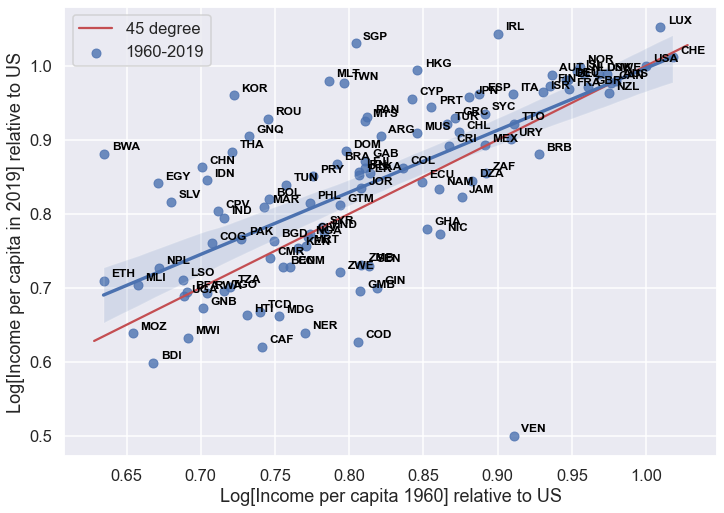

In [147]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_context("talk")
# Plot
k = 0
fig, ax = plt.subplots()
ax.plot([relgdppc.y1960.min()*.99, relgdppc.y1960.max()*1.01], [relgdppc.y1960.min()*.99, relgdppc.y1960.max()*1.01], c='r', label='45 degree')
sns.regplot(x='y1960', y='y2019', data=relgdppc, ax=ax, label='1960-2019')
movex = relgdppc.y1960.mean() * 0.006125
movey = relgdppc.y2019.mean() * 0.006125
for line in range(0,relgdppc.shape[0]):
    if (np.isnan(relgdppc.y1960[line])==False) & (np.isnan(relgdppc.y2019[line])==False):
        ax.text(relgdppc.y1960[line]+movex, relgdppc.y2019[line]+movey, relgdppc.countrycode[line], horizontalalignment='left', fontsize=12, color='black', weight='semibold')
ax.set_xlabel('Log[Income per capita 1960] relative to US')
ax.set_ylabel('Log[Income per capita in 2019] relative to US')
ax.legend()
plt.savefig(pathgraphs + '1960_versus_2019_drop.pdf', dpi=300, bbox_inches='tight')

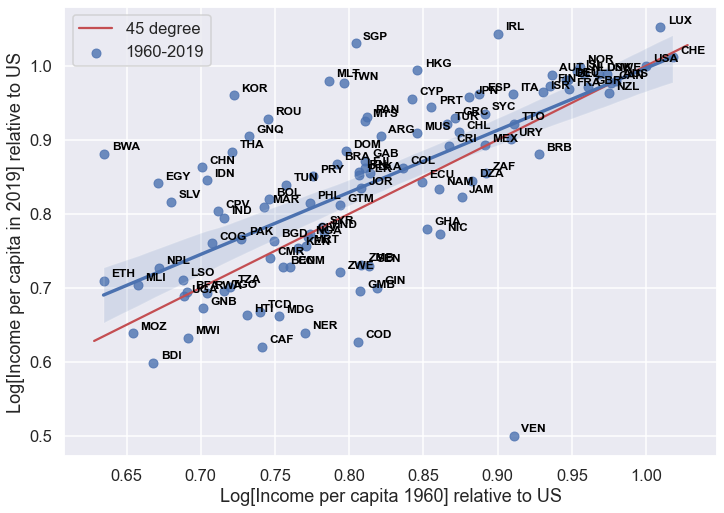

In [148]:
fig

Let's create a function that will simplify our plotting of this figure for various years

In [149]:
def PersistencePlot(dfin, var0='y1960', var1='y2010', labelvar='countrycode', 
                    dx=0.006125, dy=0.006125, 
                    xlabel='Log[Income per capita 1960] relative to US', 
                    ylabel='Log[Income per capita in 2010] relative to US',
                    linelabel='1960-2010',
                    filename='1960_versus_2010_drop.pdf'):
    '''
    Plot the association between var0 and var in dataframe using labelvar for labels. 
    '''
    sns.set(rc={'figure.figsize':(11.7,8.27)})
    sns.set_context("talk")
    df = dfin.copy()
    df = df.dropna(subset=[var0, var1]).reset_index(drop=True)
    # Plot
    k = 0
    fig, ax = plt.subplots()
    ax.plot([df[var0].min()*.99, df[var0].max()*1.01], [df[var0].min()*.99, df[var0].max()*1.01], c='r', label='45 degree')
    sns.regplot(x=var0, y=var1, data=df, ax=ax, label=linelabel)
    movex = df[var0].mean() * dx
    movey = df[var1].mean() * dy
    for line in range(0,df.shape[0]):
        ax.text(df[var0][line]+movex, df[var1][line]+movey, df[labelvar][line], horizontalalignment='left', fontsize=12, color='black')
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.legend()
    plt.savefig(pathgraphs + filename, dpi=300, bbox_inches='tight')
    pass

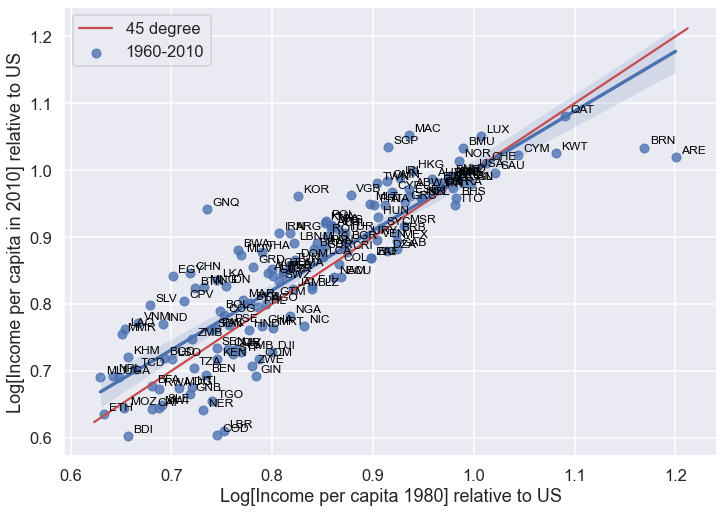

In [150]:
PersistencePlot(relgdppc, var0='y1980', var1='y2010', xlabel='Log[Income per capita 1980] relative to US',
                ylabel='Log[Income per capita in 2010] relative to US',
                    filename='1980_versus_2010_drop.pdf')

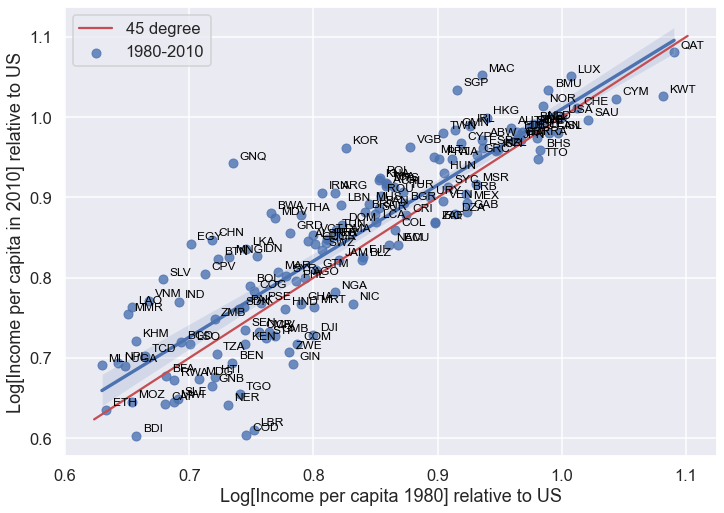

In [151]:
PersistencePlot(relgdppc.loc[(relgdppc.countrycode!='BRN')& (relgdppc.countrycode!='ARE')], var0='y1980', var1='y2010', xlabel='Log[Income per capita 1980] relative to US',
                ylabel='Log[Income per capita in 2010] relative to US', linelabel='1980-2010',
                filename='1980_versus_2010_drop.pdf')

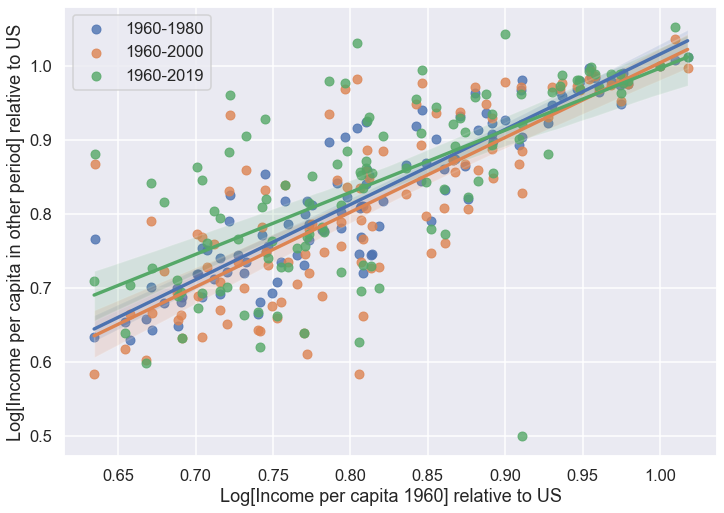

In [152]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_context("talk")
period = list(range(1980, 2020, 20)) + [pwt.year.max()]
#mycolors = sns.color_palette("GnBu", n_colors=len(period)+5)
mycolors = sns.cubehelix_palette(len(period), start=.5, rot=-.75)
# Plot
k = 0
fig, ax = plt.subplots()
for t in period:
    sns.regplot(x='y1960', y='y'+str(t), data=relgdppc, ax=ax, label='1960-'+str(t))
    k += 1
ax.set_xlabel('Log[Income per capita 1960] relative to US')
ax.set_ylabel('Log[Income per capita in other period] relative to US')
ax.legend()

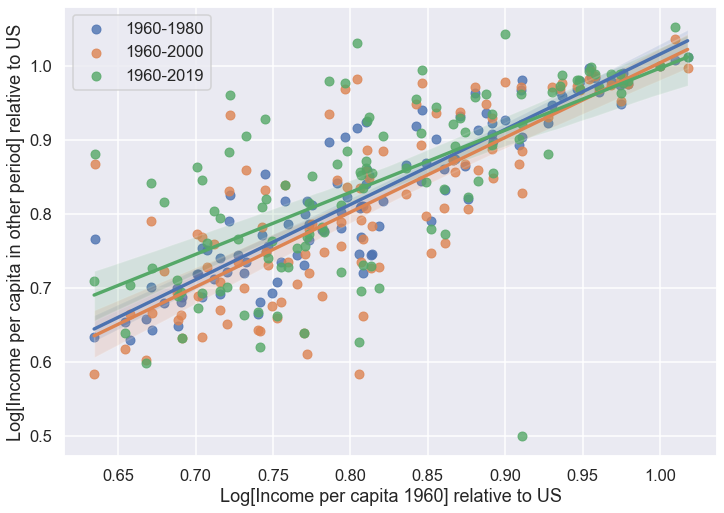

In [153]:
fig

# Getting data from the World Bank

The World Bank (WB) is a major source of free data. ``pandas`` has a subpackage that allows you download from many sources including the WB. The package we will use to access these API is ``pandas-datareader``. ``pandas-datareader`` can be used to download data from a host of sources including the WB, OECD, FRED [(see here)](https://pydata.github.io/pandas-datareader/remote_data.html).

In [154]:
from pandas_datareader import data, wb

We can now use ``wb`` to get information and data from the WB. Let's start by downloading teh set of basic information about the countries included in the API.

In [155]:
wbcountries = wb.get_countries()
wbcountries['name'] = wbcountries.name.str.strip()
wbcountries

,iso3c,iso2c,name,region,adminregion,incomeLevel,lendingType,capitalCity,longitude,latitude
0,ABW,AW,Aruba,Latin America & Caribbean,,High income,Not classified,Oranjestad,-70.0167,12.5167
1,AFE,ZH,Africa Eastern and Southern,Aggregates,,Aggregates,Aggregates,,NaN,NaN
2,AFG,AF,Afghanistan,South Asia,South Asia,Low income,IDA,Kabul,69.1761,34.5228
3,AFR,A9,Africa,Aggregates,,Aggregates,Aggregates,,NaN,NaN
4,AFW,ZI,Africa Western and Central,Aggregates,,Aggregates,Aggregates,,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
294,XZN,A5,Sub-Saharan Africa excluding South Africa and ...,Aggregates,,Aggregates,Aggregates,,NaN,NaN
295,YEM,YE,"Yemen, Rep.",Middle East & North Africa,Middle East & North Africa (excluding high inc...,Low income,IDA,Sana'a,44.2075,15.3520
296,ZAF,ZA,South Africa,Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),Upper middle income,IBRD,Pretoria,28.1871,-25.7460
297,ZMB,ZM,Zambia,Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),Low income,IDA,Lusaka,28.2937,-15.3982


Let's use ``wb`` to find all the series that have the word "population".  

In [156]:
popvars = wb.search(string='population')
popvars

,id,name,unit,source,sourceNote,sourceOrganization,topics
24,1.1_ACCESS.ELECTRICITY.TOT,Access to electricity (% of total population),,Sustainable Energy for All,Access to electricity is the percentage of pop...,b'World Bank Global Electrification Database 2...,
39,1.2_ACCESS.ELECTRICITY.RURAL,Access to electricity (% of rural population),,Sustainable Energy for All,Access to electricity is the percentage of rur...,b'World Bank Global Electrification Database 2...,
40,1.3_ACCESS.ELECTRICITY.URBAN,Access to electricity (% of urban population),,Sustainable Energy for All,Access to electricity is the percentage of tot...,b'World Bank Global Electrification Database 2...,
164,2.1_ACCESS.CFT.TOT,Access to Clean Fuels and Technologies for coo...,,Sustainable Energy for All,,b'',
195,3.11.01.01.popcen,Population census,,Statistical Capacity Indicators,"Population censuses collect data on the size, ...",b'World Bank Microdata library. Original sourc...,
...,...,...,...,...,...,...,...
20220,per_sionl.overlap_pop_urb,Population only receiving All Social Insurance...,,The Atlas of Social Protection: Indicators of ...,Percentage of population only receiving All So...,b'ASPIRE',Social Protection & Labor
20221,per_sionl.overlap_q1_preT_tot,Population in the 1st quintile (poorest) only ...,,The Atlas of Social Protection: Indicators of ...,Percentage of population only receiving All So...,b'ASPIRE',Social Protection & Labor
20222,per_sionl.overlap_q1_rur,Population in the 1st quintile (poorest) only ...,,The Atlas of Social Protection: Indicators of ...,Percentage of population only receiving All So...,b'ASPIRE',Social Protection & Labor
20223,per_sionl.overlap_q1_tot,Population in the 1st quintile (poorest) only ...,,The Atlas of Social Protection: Indicators of ...,Percentage of population only receiving All So...,b'ASPIRE',Social Protection & Labor


Lot's of variables are available, from multiple sources that have been collected by the WB. If you check [their website](https://data.worldbank.org/) you can see more information on them, also identify and search the variables you may want to focus on. Here let's download the number of males and females in the population by age group, the total population, as well as the total urban population for the year 2017.

In [157]:
femalepop = popvars.loc[popvars.id.apply(lambda x: x.find('SP.POP.')!=-1 and x.endswith('FE'))]
malepop = popvars.loc[popvars.id.apply(lambda x: x.find('SP.POP.')!=-1 and x.endswith('MA'))]
popfields = ['SP.POP.0014.FE.IN', 'SP.POP.1564.FE.IN', 'SP.POP.65UP.FE.IN',
             'SP.POP.0014.MA.IN', 'SP.POP.1564.MA.IN', 'SP.POP.65UP.MA.IN',
             'SP.POP.TOTL.FE.IN', 'SP.POP.TOTL.MA.IN', 'SP.POP.TOTL',
             'EN.URB.MCTY', 'EN.URB.LCTY'] + malepop.id.tolist() + femalepop.id.tolist()
popfields

['SP.POP.0014.FE.IN',
 'SP.POP.1564.FE.IN',
 'SP.POP.65UP.FE.IN',
 'SP.POP.0014.MA.IN',
 'SP.POP.1564.MA.IN',
 'SP.POP.65UP.MA.IN',
 'SP.POP.TOTL.FE.IN',
 'SP.POP.TOTL.MA.IN',
 'SP.POP.TOTL',
 'EN.URB.MCTY',
 'EN.URB.LCTY',
 'SP.POP.0004.MA',
 'SP.POP.0509.MA',
 'SP.POP.1014.MA',
 'SP.POP.1519.MA',
 'SP.POP.2024.MA',
 'SP.POP.2529.MA',
 'SP.POP.3034.MA',
 'SP.POP.3539.MA',
 'SP.POP.4044.MA',
 'SP.POP.4549.MA',
 'SP.POP.5054.MA',
 'SP.POP.5559.MA',
 'SP.POP.6064.MA',
 'SP.POP.6569.MA',
 'SP.POP.7074.MA',
 'SP.POP.7579.MA',
 'SP.POP.80UP.MA',
 'SP.POP.0004.FE',
 'SP.POP.0509.FE',
 'SP.POP.1014.FE',
 'SP.POP.1519.FE',
 'SP.POP.2024.FE',
 'SP.POP.2529.FE',
 'SP.POP.3034.FE',
 'SP.POP.3539.FE',
 'SP.POP.4044.FE',
 'SP.POP.4549.FE',
 'SP.POP.5054.FE',
 'SP.POP.5559.FE',
 'SP.POP.6064.FE',
 'SP.POP.6569.FE',
 'SP.POP.7074.FE',
 'SP.POP.7579.FE',
 'SP.POP.80UP.FE']

Let's also download GDP per capita in PPP at constant 2011 prices, which is the series ``NY.GDP.PCAP.PP.KD``.

In [163]:
wdi = wb.download(indicator=popfields+['NY.GDP.PCAP.PP.KD'], country=wbcountries.iso2c.values, start=2020, end=2020)

wdi

/Users/ozak/anaconda3/envs/EconGrowthUG/lib/python3.9/site-packages/pandas_datareader/wb.py:592: UserWarning: Non-standard ISO country codes: 1A, 1W, 4E, 6F, 6N, 6X, 7E, 8S, A4, A5, A9, B1, B2, B3, B4, B6, B7, B8, C4, C5, C6, C7, C8, C9, D2, D3, D4, D5, D6, D7, D8, D9, EU, F1, F6, JG, M1, M2, N6, OE, R6, S1, S2, S3, S4, T2, T3, T4, T5, T6, T7, V1, V2, V3, V4, XC, XD, XE, XF, XG, XH, XI, XJ, XK, XL, XM, XN, XO, XP, XQ, XT, XU, XY, Z4, Z7, ZB, ZF, ZG, ZH, ZI, ZJ, ZQ, ZT
  warnings.warn(


,,SP.POP.0014.FE.IN,SP.POP.1564.FE.IN,SP.POP.65UP.FE.IN,SP.POP.0014.MA.IN,SP.POP.1564.MA.IN,SP.POP.65UP.MA.IN,SP.POP.TOTL.FE.IN,SP.POP.TOTL.MA.IN,SP.POP.TOTL,EN.URB.MCTY,...,SP.POP.4044.FE,SP.POP.4549.FE,SP.POP.5054.FE,SP.POP.5559.FE,SP.POP.6064.FE,SP.POP.6569.FE,SP.POP.7074.FE,SP.POP.7579.FE,SP.POP.80UP.FE,NY.GDP.PCAP.PP.KD
country,year,,,,,,,,,,,,,,,,,,,,,
Aruba,2020,9113.0,38000.0,9011.0,9444.0,34616.0,6582.0,56124.0,50642.0,106766.0,NaN,...,3712.0,4054.0,4403.0,4897.0,4196.0,3363.0,2406.0,1549.0,1693.0,29563.756955
Africa Eastern and Southern,2020,138352035.0,190472197.0,12266504.0,140988093.0,185894168.0,9270302.0,341090736.0,336152563.0,677243299.0,NaN,...,15669437.0,12697054.0,10181631.0,8211128.0,6530132.0,4922064.0,3486260.0,2186612.0,1671566.0,3491.978104
Afghanistan,2020,7947146.0,10452059.0,552871.0,8333700.0,11164198.0,478367.0,18952076.0,19976265.0,38928341.0,4221532.0,...,790703.0,627510.0,503171.0,396460.0,307557.0,229221.0,172197.0,91107.0,60346.0,1970.560169
Africa Western and Central,2020,97264292.0,123798711.0,6922424.0,100597279.0,124357945.0,5862825.0,227985427.0,230818049.0,458803476.0,NaN,...,10315219.0,8341291.0,6685492.0,5368142.0,4163670.0,3046986.0,2034894.0,1173845.0,666699.0,4021.293919
Angola,2020,7590076.0,8616194.0,399128.0,7658353.0,8281395.0,321122.0,16605398.0,16260870.0,32866268.0,8329798.0,...,684932.0,561290.0,410848.0,344802.0,252683.0,158692.0,117389.0,69351.0,53696.0,6141.963839
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Kosovo,2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1790133.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10706.513976
"Yemen, Rep.",2020,5675675.0,8647645.0,477663.0,5906414.0,8722038.0,396533.0,14800983.0,15024985.0,29825968.0,2972988.0,...,667208.0,491438.0,409632.0,350039.0,265461.0,196233.0,140734.0,80598.0,60098.0,NaN
South Africa,2020,8444602.0,19666314.0,1981762.0,8636966.0,19293233.0,1285813.0,30092678.0,29216012.0,59308690.0,21272284.0,...,1917268.0,1655021.0,1401326.0,1183834.0,990310.0,784770.0,535895.0,367665.0,293432.0,12665.832404


Looks like there are lots of missing values...but be not fooled. This is a strange behavior of ``wb``. Since the original source differs, it is not linking the countries correctly. Let's see this

In [164]:
wdi.sort_index()

,,SP.POP.0014.FE.IN,SP.POP.1564.FE.IN,SP.POP.65UP.FE.IN,SP.POP.0014.MA.IN,SP.POP.1564.MA.IN,SP.POP.65UP.MA.IN,SP.POP.TOTL.FE.IN,SP.POP.TOTL.MA.IN,SP.POP.TOTL,EN.URB.MCTY,...,SP.POP.4044.FE,SP.POP.4549.FE,SP.POP.5054.FE,SP.POP.5559.FE,SP.POP.6064.FE,SP.POP.6569.FE,SP.POP.7074.FE,SP.POP.7579.FE,SP.POP.80UP.FE,NY.GDP.PCAP.PP.KD
country,year,,,,,,,,,,,,,,,,,,,,,
Afghanistan,2020,7947146.0,1.045206e+07,552871.0,8.333700e+06,1.116420e+07,478367.0,1.895208e+07,1.997626e+07,3.892834e+07,4221532.0,...,790703.0,627510.0,503171.0,396460.0,307557.0,229221.0,172197.0,91107.0,60346.0,1970.560169
Africa Eastern and Southern,2020,138352035.0,1.904722e+08,12266504.0,1.409881e+08,1.858942e+08,9270302.0,3.410907e+08,3.361526e+08,6.772433e+08,NaN,...,15669437.0,12697054.0,10181631.0,8211128.0,6530132.0,4922064.0,3486260.0,2186612.0,1671566.0,3491.978104
Africa Western and Central,2020,97264292.0,1.237987e+08,6922424.0,1.005973e+08,1.243579e+08,5862825.0,2.279854e+08,2.308180e+08,4.588035e+08,NaN,...,10315219.0,8341291.0,6685492.0,5368142.0,4163670.0,3046986.0,2034894.0,1173845.0,666699.0,4021.293919
Albania,2020,231501.0,9.446380e+05,217330.0,2.576260e+05,9.867900e+05,199964.0,1.393469e+06,1.444380e+06,2.837849e+06,NaN,...,75550.0,88992.0,94353.0,101819.0,93972.0,72919.0,54917.0,44481.0,45013.0,13253.733337
Algeria,2020,6608900.0,1.358423e+07,1504101.0,6.889992e+06,1.381108e+07,1452738.0,2.169724e+07,2.215381e+07,4.385104e+07,2767661.0,...,1502809.0,1220495.0,1035144.0,870269.0,684035.0,560160.0,364221.0,272083.0,307637.0,10735.382539
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
West Bank and Gaza,2020,900632.0,1.384634e+06,82225.0,9.419560e+05,1.421572e+06,72250.0,2.367491e+06,2.435778e+06,4.803269e+06,NaN,...,114483.0,93717.0,78325.0,61960.0,42418.0,31964.0,22840.0,15132.0,12289.0,5402.538773
World,2020,956900030.0,2.492744e+09,398610418.0,1.020597e+09,2.567276e+09,324985413.0,3.848254e+09,3.912859e+09,7.763933e+09,NaN,...,243289551.0,236807645.0,221792957.0,194492100.0,164041353.0,139814706.0,100946603.0,68683572.0,89165540.0,16269.969854
"Yemen, Rep.",2020,5675675.0,8.647645e+06,477663.0,5.906414e+06,8.722038e+06,396533.0,1.480098e+07,1.502498e+07,2.982597e+07,2972988.0,...,667208.0,491438.0,409632.0,350039.0,265461.0,196233.0,140734.0,80598.0,60098.0,NaN


Let's aggregate by year-country so that we have the correct data

In [165]:
wdi = wdi.groupby(['country', 'year']).max()
wdi.reset_index(inplace=True)
wdi

,country,year,SP.POP.0014.FE.IN,SP.POP.1564.FE.IN,SP.POP.65UP.FE.IN,SP.POP.0014.MA.IN,SP.POP.1564.MA.IN,SP.POP.65UP.MA.IN,SP.POP.TOTL.FE.IN,SP.POP.TOTL.MA.IN,...,SP.POP.4044.FE,SP.POP.4549.FE,SP.POP.5054.FE,SP.POP.5559.FE,SP.POP.6064.FE,SP.POP.6569.FE,SP.POP.7074.FE,SP.POP.7579.FE,SP.POP.80UP.FE,NY.GDP.PCAP.PP.KD
0,Afghanistan,2020,7947146.0,1.045206e+07,552871.0,8.333700e+06,1.116420e+07,478367.0,1.895208e+07,1.997626e+07,...,790703.0,627510.0,503171.0,396460.0,307557.0,229221.0,172197.0,91107.0,60346.0,1970.560169
1,Africa Eastern and Southern,2020,138352035.0,1.904722e+08,12266504.0,1.409881e+08,1.858942e+08,9270302.0,3.410907e+08,3.361526e+08,...,15669437.0,12697054.0,10181631.0,8211128.0,6530132.0,4922064.0,3486260.0,2186612.0,1671566.0,3491.978104
2,Africa Western and Central,2020,97264292.0,1.237987e+08,6922424.0,1.005973e+08,1.243579e+08,5862825.0,2.279854e+08,2.308180e+08,...,10315219.0,8341291.0,6685492.0,5368142.0,4163670.0,3046986.0,2034894.0,1173845.0,666699.0,4021.293919
3,Albania,2020,231501.0,9.446380e+05,217330.0,2.576260e+05,9.867900e+05,199964.0,1.393469e+06,1.444380e+06,...,75550.0,88992.0,94353.0,101819.0,93972.0,72919.0,54917.0,44481.0,45013.0,13253.733337
4,Algeria,2020,6608900.0,1.358423e+07,1504101.0,6.889992e+06,1.381108e+07,1452738.0,2.169724e+07,2.215381e+07,...,1502809.0,1220495.0,1035144.0,870269.0,684035.0,560160.0,364221.0,272083.0,307637.0,10735.382539
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,West Bank and Gaza,2020,900632.0,1.384634e+06,82225.0,9.419560e+05,1.421572e+06,72250.0,2.367491e+06,2.435778e+06,...,114483.0,93717.0,78325.0,61960.0,42418.0,31964.0,22840.0,15132.0,12289.0,5402.538773
262,World,2020,956900030.0,2.492744e+09,398610418.0,1.020597e+09,2.567276e+09,324985413.0,3.848254e+09,3.912859e+09,...,243289551.0,236807645.0,221792957.0,194492100.0,164041353.0,139814706.0,100946603.0,68683572.0,89165540.0,16269.969854
263,"Yemen, Rep.",2020,5675675.0,8.647645e+06,477663.0,5.906414e+06,8.722038e+06,396533.0,1.480098e+07,1.502498e+07,...,667208.0,491438.0,409632.0,350039.0,265461.0,196233.0,140734.0,80598.0,60098.0,NaN
264,Zambia,2020,4008980.0,5.033425e+06,238545.0,4.083160e+06,4.866437e+06,153409.0,9.280950e+06,9.103006e+06,...,410788.0,307992.0,223199.0,172863.0,130471.0,95899.0,67563.0,42945.0,32138.0,3277.816510


Let's merge this data with the original ``wbcountries`` dataframe, so that we can use it to plot.

In [166]:
wdi = wbcountries.merge(wdi, left_on='name', right_on='country')
wdi

,iso3c,iso2c,name,region,adminregion,incomeLevel,lendingType,capitalCity,longitude,latitude,...,SP.POP.4044.FE,SP.POP.4549.FE,SP.POP.5054.FE,SP.POP.5559.FE,SP.POP.6064.FE,SP.POP.6569.FE,SP.POP.7074.FE,SP.POP.7579.FE,SP.POP.80UP.FE,NY.GDP.PCAP.PP.KD
0,ABW,AW,Aruba,Latin America & Caribbean,,High income,Not classified,Oranjestad,-70.0167,12.51670,...,3712.0,4054.0,4403.0,4897.0,4196.0,3363.0,2406.0,1549.0,1693.0,29563.756955
1,AFE,ZH,Africa Eastern and Southern,Aggregates,,Aggregates,Aggregates,,NaN,NaN,...,15669437.0,12697054.0,10181631.0,8211128.0,6530132.0,4922064.0,3486260.0,2186612.0,1671566.0,3491.978104
2,AFG,AF,Afghanistan,South Asia,South Asia,Low income,IDA,Kabul,69.1761,34.52280,...,790703.0,627510.0,503171.0,396460.0,307557.0,229221.0,172197.0,91107.0,60346.0,1970.560169
3,AFW,ZI,Africa Western and Central,Aggregates,,Aggregates,Aggregates,,NaN,NaN,...,10315219.0,8341291.0,6685492.0,5368142.0,4163670.0,3046986.0,2034894.0,1173845.0,666699.0,4021.293919
4,AGO,AO,Angola,Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),Lower middle income,IBRD,Luanda,13.2420,-8.81155,...,684932.0,561290.0,410848.0,344802.0,252683.0,158692.0,117389.0,69351.0,53696.0,6141.963839
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,XKX,XK,Kosovo,Europe & Central Asia,Europe & Central Asia (excluding high income),Upper middle income,IDA,Pristina,20.9260,42.56500,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10706.513976
262,YEM,YE,"Yemen, Rep.",Middle East & North Africa,Middle East & North Africa (excluding high inc...,Low income,IDA,Sana'a,44.2075,15.35200,...,667208.0,491438.0,409632.0,350039.0,265461.0,196233.0,140734.0,80598.0,60098.0,NaN
263,ZAF,ZA,South Africa,Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),Upper middle income,IBRD,Pretoria,28.1871,-25.74600,...,1917268.0,1655021.0,1401326.0,1183834.0,990310.0,784770.0,535895.0,367665.0,293432.0,12665.832404
264,ZMB,ZM,Zambia,Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),Low income,IDA,Lusaka,28.2937,-15.39820,...,410788.0,307992.0,223199.0,172863.0,130471.0,95899.0,67563.0,42945.0,32138.0,3277.816510


## Plot Male vs Female population in each country in 2020

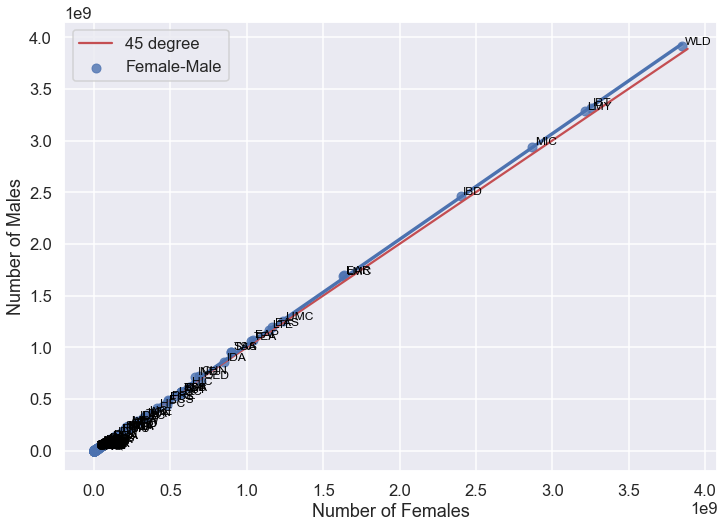

In [167]:
PersistencePlot(wdi, var0='SP.POP.TOTL.FE.IN', var1='SP.POP.TOTL.MA.IN', xlabel='Number of Females',
                ylabel='Number of Males', labelvar='iso3c', linelabel='Female-Male', 
                dx=0.1, dy=0.1, filename='Female-Male-2017.pdf')

Let's take $log$s so we see this better

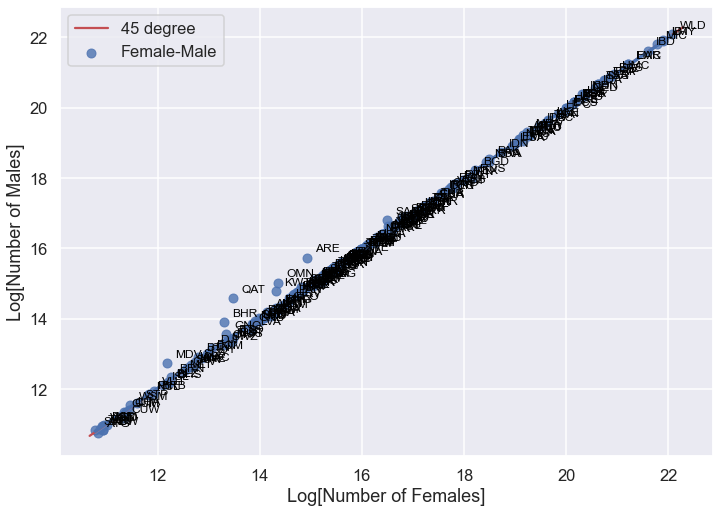

In [168]:
wdi['lpop_fe'] = np.log(wdi['SP.POP.TOTL.FE.IN'])
wdi['lpop_ma'] = np.log(wdi['SP.POP.TOTL.MA.IN'])
PersistencePlot(wdi, var0='lpop_fe', var1='lpop_ma', xlabel='Log[Number of Females]',
                ylabel='Log[Number of Males]', labelvar='iso3c', linelabel='Female-Male', 
                dx=0.01, dy=0.01, filename='Female-Male-2020.pdf')

Seems like the gender ratio, i.e., the number of males per female is quite different from 1. Let's plot the histogram of the gender ratio across countries to see this better.

<AxesSubplot:>

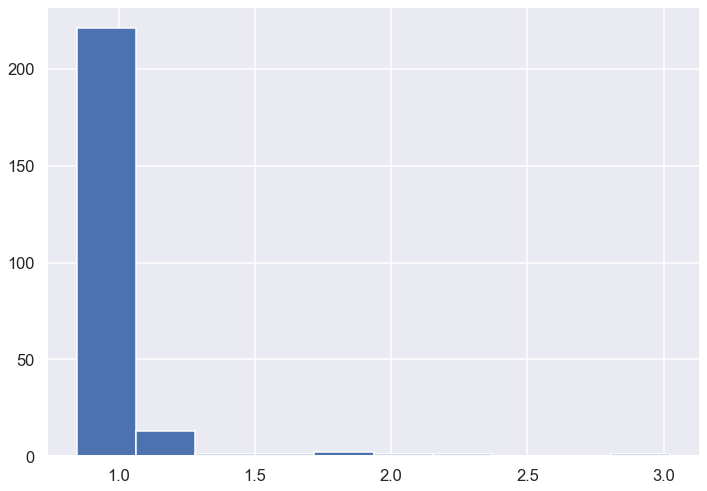

In [169]:
(np.exp(wdi['lpop_ma'] - wdi['lpop_fe'])).hist()

<AxesSubplot:>

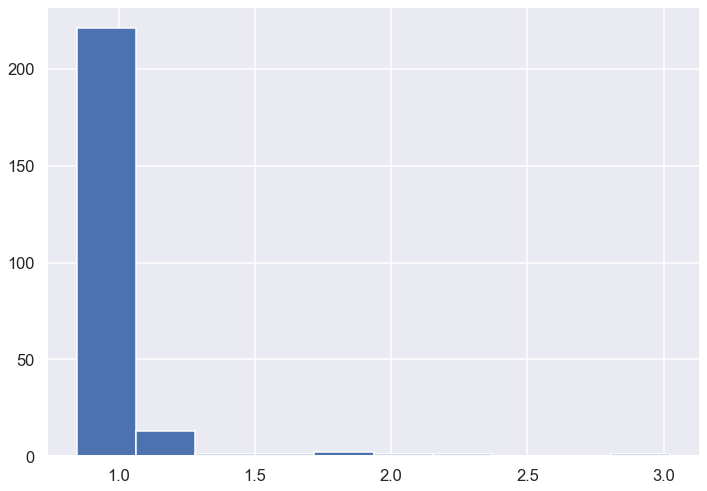

In [170]:
wdi['gender_ratio'] = (wdi['SP.POP.TOTL.MA.IN'] / wdi['SP.POP.TOTL.FE.IN'])
wdi.gender_ratio.hist()

In [172]:
print('Maximum gender ratio = ', wdi.gender_ratio.max())
wdi.loc[wdi.gender_ratio>=1.05][['iso3c', 'name', 'region', 'gender_ratio']].sort_values('gender_ratio', ascending=False)

Maximum gender ratio =  3.024248350036666


,iso3c,name,region,gender_ratio
200,QAT,Qatar,Middle East & North Africa,3.024248
8,ARE,United Arab Emirates,Middle East & North Africa,2.238453
182,OMN,Oman,Middle East & North Africa,1.940938
22,BHR,Bahrain,Middle East & North Africa,1.830740
152,MDV,Maldives,South Asia,1.735343
127,KWT,Kuwait,Middle East & North Africa,1.578660
205,SAU,Saudi Arabia,Middle East & North Africa,1.371103
88,GNQ,Equatorial Guinea,Sub-Saharan Africa,1.253411
183,OSS,Other small states,Aggregates,1.139644
32,BTN,Bhutan,South Asia,1.134325


In [173]:
print('Minimum gender ratio = ', wdi.gender_ratio.min())
wdi.loc[wdi.gender_ratio<=0.95][['iso3c', 'name', 'region', 'gender_ratio']].sort_values('gender_ratio')

Minimum gender ratio =  0.8454598203374091


,iso3c,name,region,gender_ratio
178,NPL,Nepal,South Asia,0.845460
96,HKG,"Hong Kong SAR, China",East Asia & Pacific,0.847768
51,CUW,Curacao,Latin America & Caribbean,0.851506
145,LVA,Latvia,Europe & Central Asia,0.854916
143,LTU,Lithuania,Europe & Central Asia,0.861644
248,UKR,Ukraine,Europe & Central Asia,0.863341
202,RUS,Russian Federation,Europe & Central Asia,0.863925
25,BLR,Belarus,Europe & Central Asia,0.871170
211,SLV,El Salvador,Latin America & Caribbean,0.880180
10,ARM,Armenia,Europe & Central Asia,0.888027


### Gender ratio and development

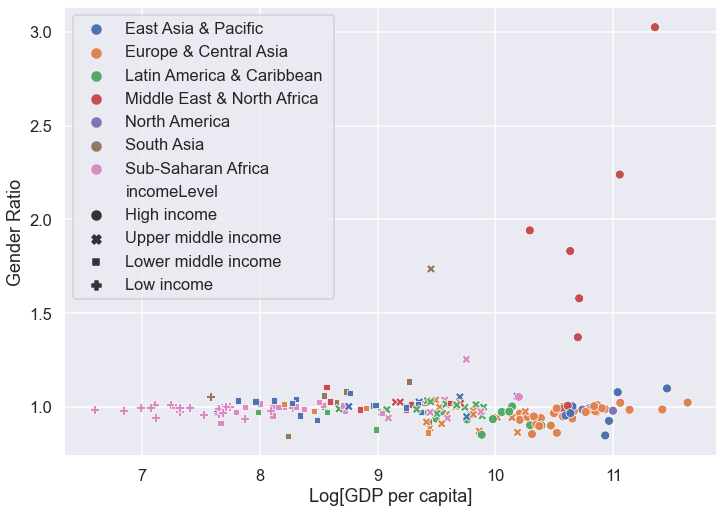

In [174]:
wdi['lgdppc'] = np.log(wdi['NY.GDP.PCAP.PP.KD'])
sns.set(rc={'figure.figsize':(11.7,8.27)})
#sns.reset_orig()
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.scatterplot(x='lgdppc', y='gender_ratio', hue='region',
                hue_order=['East Asia & Pacific', 'Europe & Central Asia',
                           'Latin America & Caribbean ', 'Middle East & North Africa',
                           'North America', 'South Asia', 'Sub-Saharan Africa '],
                data=wdi.loc[wdi.region!='Aggregates'], alpha=1, style='incomeLevel', 
                style_order=['High income', 'Upper middle income', 'Lower middle income', 'Low income'],
                )
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,}'))
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[1:], labels=labels[1:])
ax.set_xlabel('Log[GDP per capita]')
ax.set_ylabel('Gender Ratio')
plt.savefig(pathgraphs + 'Gender-Ratio-GDPpc.pdf', dpi=300, bbox_inches='tight')

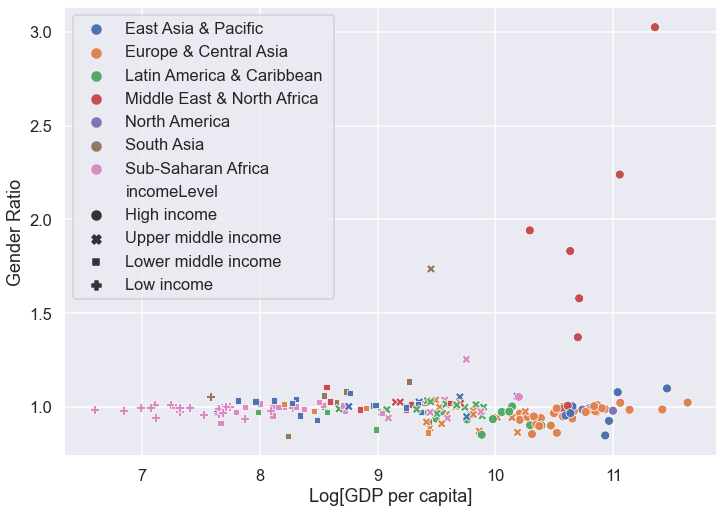

In [175]:
fig

### Use statistical and mathematical functions to analyze the data

Now let's import the ``statsmodels`` module to run regressions.

In [176]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
from IPython.display import Latex

Let's estimate the elasticity of the number of men with respect to the number of women.

In [177]:
mod = sm.OLS(wdi['lpop_ma'],sm.add_constant(wdi['lpop_fe']), missing='drop').fit()
mod.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                 Results: Ordinary least squares
==================================================================
Model:              OLS              Adj. R-squared:     0.998    
Dependent Variable: lpop_ma          AIC:                -304.1073
Date:               2022-08-18 14:17 BIC:                -297.1377
No. Observations:   241              Log-Likelihood:     154.05   
Df Model:           1                F-statistic:        1.051e+05
Df Residuals:       239              Prob (F-statistic): 5.70e-318
R-squared:          0.998            Scale:              0.016441 
--------------------------------------------------------------------
            Coef.    Std.Err.      t       P>|t|     [0.025   0.975]
--------------------------------------------------------------------
const       0.0590     0.0499     1.1829   0.2380   -0.0393   0.1573
lpop_fe     0.9967     0.0031   324.1164   0.0000    0.9906   1.0027
------------------------------------------------------------------
Omnibus:             281.246      Durbin-Watson:         1.948    
Prob(Omnibus):       0.000        Jarque-Bera (JB):      11562.963
Skew:                5.012        Prob(JB):              0.000    
Kurtosis:            35.419       Condition No.:         98       
==================================================================

"""

In [178]:
print('The elasticity is %8.4f' % mod.params[1])
print(r'The $R^2$ is %8.3f' % mod.rsquared)

The elasticity is   0.9967
The $R^2$ is    0.998


Let's instead use the ``smf`` module, which allows us to run the regression wiritng the formula instead of having to pass the data and adding the constant as a new variable. Let's run a simple correlation between $\log(GDPpc)$ and the gender ratio. 

In [179]:
mod = smf.ols(formula='lgdppc ~ gender_ratio', data=wdi[['lpop_ma','lpop_fe', 'lgdppc', 'gender_ratio']], missing='drop').fit()
mod.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                 Results: Ordinary least squares
=================================================================
Model:              OLS              Adj. R-squared:     0.021   
Dependent Variable: lgdppc           AIC:                690.6298
Date:               2022-08-18 14:17 BIC:                697.4972
No. Observations:   229              Log-Likelihood:     -343.31 
Df Model:           1                F-statistic:        5.775   
Df Residuals:       227              Prob (F-statistic): 0.0171  
R-squared:          0.025            Scale:              1.1844  
------------------------------------------------------------------
                 Coef.   Std.Err.     t     P>|t|   [0.025  0.975]
------------------------------------------------------------------
Intercept        8.4370    0.3809  22.1526  0.0000  7.6865  9.1875
gender_ratio     0.8829    0.3674   2.4032  0.0171  0.1590  1.6069
-----------------------------------------------------------------
Omnibus:               15.634       Durbin-Watson:          1.815
Prob(Omnibus):         0.000        Jarque-Bera (JB):       7.515
Skew:                  -0.227       Prob(JB):               0.023
Kurtosis:              2.238        Condition No.:          11   
=================================================================

"""

In [180]:
mysummary=mod.summary2()
Latex(mysummary.as_latex())

<IPython.core.display.Latex object>

In [181]:
print('The semi-elasticity is %2.4f' % mod.params[1])
print(r'The $R^2$ is %1.3f' % mod.rsquared)

The semi-elasticity is 0.8829
The $R^2$ is 0.025


But of course we know correlation is not causation! Even more, from our figure we know that the positive association is driven by the rich oil producing countries of the Middle East & North Africa. To see this, let's replicate the analysis without those countries.

In [182]:
mod = smf.ols(formula='lgdppc ~ gender_ratio', data=wdi.loc[wdi.region!='Middle East & North Africa'][['lpop_ma','lpop_fe', 'lgdppc', 'gender_ratio']], missing='drop').fit()
mod.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                 Results: Ordinary least squares
=================================================================
Model:              OLS              Adj. R-squared:     0.006   
Dependent Variable: lgdppc           AIC:                640.2134
Date:               2022-08-18 14:17 BIC:                646.9076
No. Observations:   210              Log-Likelihood:     -318.11 
Df Model:           1                F-statistic:        2.209   
Df Residuals:       208              Prob (F-statistic): 0.139   
R-squared:          0.011            Scale:              1.2230  
------------------------------------------------------------------
               Coef.   Std.Err.     t     P>|t|    [0.025   0.975]
------------------------------------------------------------------
Intercept     10.8201    1.0318  10.4869  0.0000   8.7860  12.8541
gender_ratio  -1.5447    1.0394  -1.4861  0.1388  -3.5938   0.5044
-----------------------------------------------------------------
Omnibus:               13.779       Durbin-Watson:          1.732
Prob(Omnibus):         0.001        Jarque-Bera (JB):       6.758
Skew:                  -0.224       Prob(JB):               0.034
Kurtosis:              2.244        Condition No.:          27   
=================================================================

"""

In [183]:
print('The semi-elasticity is %2.4f with a p-value of %1.4f' % (mod.params[1], mod.pvalues[1]))
print(r'The $R^2$ is %1.3f' % mod.rsquared)
print("Luckily we had plotted the data, right?!")

The semi-elasticity is -1.5447 with a p-value of 0.1388
The $R^2$ is 0.011
Luckily we had plotted the data, right?!


# Homework

Using Pandas and Statsmodels write a Jupyter Notebook that: 

1. Uses the data from the Maddison Project to plot the evolution of total population across the world. 
2. Plots the evolution of the share of the world population by countries and WB regions.
3. Downloads fertility, mortality and life expectancy data from the WB and plots its evolution in the last 60 years.
4. Downloads mortality and life expectancy data (across regions and cohorts) from the [Human Mortality Database](https://www.mortality.org/) and plots its evolution.
5. Using this data analyze the convergence of life expectanty, mortality and fertility.

Submit your notebook as a ``pull request`` to the course's github repository.

# Wages and Population In England 1200-1860

Let's get the population and wage series from Greg Clark's website for plotting.

In [184]:
uk1 = pd.read_excel('http://faculty.econ.ucdavis.edu/faculty/gclark/English%20Data/England%20NNI%20-%20Clark%20-%202015.xlsx', sheet_name='Decadal')
uk2 = pd.read_excel('http://faculty.econ.ucdavis.edu/faculty/gclark/English%20Data/Wages%202014.xlsx', sheet_name='Decadal')

In [185]:
uk1

,Decade,Unnamed: 1,Pop England,Share Males farm sector,Male Farm Wage,Male Non-Farm Wage,Male average Wage,Male Work Days per Year,Total Wage Income,Land rents,...,All Capital Income,Indirect Taxes,Net National Income,Unnamed: 15,Price Index - Domestic Expenditure,Price Index - GDP,Price Index - Cost of Living,Unnamed: 19,Real Net National Income (DE),Real NNI/N
0,NaN,NaN,m.,NaN,d./day,d./day,d./day,NaN,(₤ m),(₤ m),...,(₤ m),(₤ m),(₤ m),NaN,(1860s=100),(1860s=100),(1860s=100),NaN,(1860s=100),(1860s=100)
1,1200.0,NaN,3.395946,0.555168,1.373647,2.282816,2.088783,300.0,3.078466,1.606036,...,1.741253,0,6.425755,NaN,6.586338,7.126418,6.544197,NaN,14.897218,86.621351
2,1210.0,NaN,3.395946,0.575784,1.269451,1.84928,2.021137,300.0,3.200434,1.606036,...,1.95638,0,6.76285,NaN,7.494729,8.109296,7.575843,NaN,14.042469,81.651332
3,1220.0,NaN,3.738005,0.626021,1.255379,2.135947,1.947335,300.0,3.394164,1.628947,...,1.971441,0,6.994552,NaN,8.332736,9.016021,8.535567,NaN,13.143741,69.432007
4,1230.0,NaN,3.903905,0.652303,1.178929,NaN,1.848722,300.0,3.365295,1.331461,...,2.04084,0,6.737596,NaN,8.265396,8.943159,8.40574,NaN,12.462355,63.034958
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,1820.0,NaN,11.982104,0.345313,20.333416,34.53486,34.327787,300.0,191.868124,38.191485,...,78.77882,29.164632,338.003061,NaN,108.478968,112.086157,110.194354,NaN,48.128176,79.290718
64,1830.0,NaN,13.773176,0.308229,20.042939,35.383693,35.429759,300.0,227.645679,36.557278,...,93.747986,25.876734,383.827677,NaN,100.892148,102.97158,101.268842,NaN,58.593182,84.035129
65,1840.0,NaN,15.636482,0.264763,21.096252,36.16764,37.016669,300.0,269.976598,39.165564,...,101.875156,26.184313,437.201631,NaN,96.899076,97.81461,98.799054,NaN,69.558992,87.724658
66,1850.0,NaN,17.589614,0.246630,22.09969,37.840784,39.129929,300.0,321.386522,39.474329,...,124.452112,28.390429,513.703392,NaN,93.317821,93.166374,95.128327,NaN,84.548996,94.905732


In [186]:
uk2

,Decade,"Farm Laborers, d/day","Coal Miners, d./day","Building Laborers, d/day","Building Craftsmen, d/day",Unnamed: 5,Cost of Living (1860s=100),Unnamed: 7,Real Farm Wage (1860s=100),Real Building Laborer Wage (1860s=100),Real Building Craftsman Wage (1860s=100)
0,1200,1.373647,NaN,NaN,2.783922,NaN,6.544197,NaN,88.841573,NaN,80.673336
1,1210,1.262561,NaN,NaN,2.078984,NaN,7.575843,NaN,72.045676,NaN,52.335306
2,1220,1.249455,NaN,1.625946,2.602945,NaN,8.535567,NaN,60.578574,51.791535,56.307104
3,1230,1.178929,NaN,NaN,NaN,NaN,8.405740,NaN,59.258095,NaN,NaN
4,1240,1.246828,NaN,1.878412,2.893921,NaN,8.871055,NaN,61.132054,58.464596,62.484216
...,...,...,...,...,...,...,...,...,...,...,...
62,1820,20.333416,32.226677,27.009300,42.060419,NaN,110.194354,NaN,78.081590,71.212912,72.500372
63,1830,20.042939,32.680000,28.021165,42.746221,NaN,101.268842,NaN,83.892814,80.390114,80.295861
64,1840,21.096252,30.920000,29.023687,43.311592,NaN,98.771980,NaN,90.604982,85.635493,83.439177
65,1850,22.099690,36.680000,30.103970,45.577598,NaN,95.128327,NaN,98.270928,92.231871,91.251668


Let's clean the data and merge it into a unique dataframe.

In [187]:
uk1 = uk1.loc[uk1.index.difference([0])].reset_index(drop=True)[[col for col in uk1.columns if col.find('Unnamed')==-1]]
uk2 = uk2[[col for col in uk2.columns if col.find('Unnamed')==-1]]
uk = uk1.merge(uk2)
uk.Decade = uk.Decade.astype(int)
uk['Pop England'] = uk['Pop England'].astype(float)

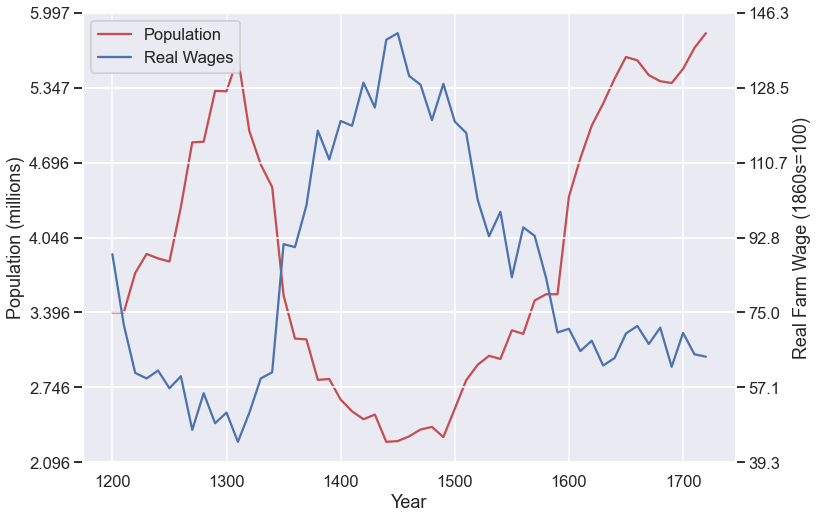

In [188]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_context("talk")
# Plot
fig, ax = plt.subplots()
sns.lineplot(x='Decade', y='Pop England', data=uk.loc[uk.Decade<1730], alpha=1, label='Population', color='r')
ax2 = ax.twinx()
sns.lineplot(x='Decade', y='Real Farm Wage (1860s=100)', data=uk.loc[uk.Decade<1730], alpha=1, label='Real Wages', color='b')
ax.tick_params(axis = 'both', which = 'major')
ax.tick_params(axis = 'both', which = 'minor')
handles, labels = ax.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
ax.legend(handles=(handles+handles2), labels=(labels+labels2), loc='upper left')
ax2.legend(handles=(handles+handles2), labels=(labels+labels2), loc='upper left')
nticks = 7
ax.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax2.yaxis.set_major_locator(matplotlib.ticker.LinearLocator(nticks))
ax.set_xlabel('Year')
ax.set_ylabel('Population (millions)')
plt.savefig(pathgraphs + 'UK-pop-GDPpc-1200-1730.pdf', dpi=300, bbox_inches='tight')

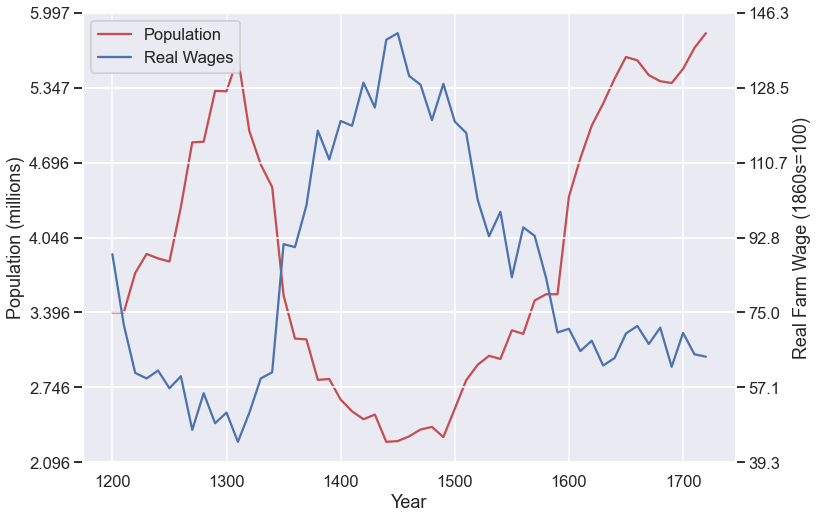

In [189]:
fig